# 24ANN_노트북파일_7조

## > 20201588 박태현
## > 20201590 송준규
## > 20201596 양은주
## > 20201610 정하연

# 이하 datasets_utils.py

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

import numpy as np
import pandas as pd
from skimage.transform import resize
from scipy.ndimage import zoom
import matplotlib.pyplot as plt
import cv2
from PIL import Image

def process_image(img, resize_shape):
    img = img.reshape(28, 28)  # Reshape to 28x28
    img = np.fliplr(img)  # Flip the image left to right
    img = np.rot90(img)  # Rotate the image 90 degrees
    img = Image.fromarray(img.astype('uint8'), 'L')  # Convert to PIL image in grayscale
    img = img.resize(resize_shape, Image.ANTIALIAS)  # Resize to the target shape
    img = img.convert('RGB')  # Convert to RGB
    img = np.array(img)  # Convert back to numpy array
    return img

def prepare_datasets(type, resize_shape=(32, 32)):
    # Define dataset paths based on type
    base_path = f"/home/hayeon/ann/project/emnist/{type}/"
    train_path = base_path + "emnist-" + type + "-train.csv"
    test_path = base_path + "emnist-" + type + "-test.csv"
    mapping_path = base_path + "emnist-" + type + "-mapping.txt"

    # Read datasets
    train = pd.read_csv(train_path, delimiter=',')
    test = pd.read_csv(test_path, delimiter=',')
    mapp = pd.read_csv(mapping_path, delimiter=' ', index_col=0, header=None, squeeze=True)

    # Split datasets
    X_train = train.iloc[:, 1:].values
    y_train = train.iloc[:, 0].values
    X_test = test.iloc[:, 1:].values
    y_test = test.iloc[:, 0].values

    val_size = len(X_test)

    X_valid = X_train[-val_size:]
    y_valid = y_train[-val_size:]
    X_train = X_train[:-val_size]
    y_train = y_train[:-val_size]

    # Apply processing
    X_train = np.array([process_image(img, resize_shape) for img in X_train])
    X_valid = np.array([process_image(img, resize_shape) for img in X_valid])
    X_test = np.array([process_image(img, resize_shape) for img in X_test])

    # Normalize pixel values to [0, 1]
    X_train = X_train.astype('float32') / 255.0
    X_valid = X_valid.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    print("X_train shape:", X_train.shape)
    print("X_valid shape:", X_valid.shape)
    print("X_test shape:", X_test.shape)
    print("")

    num_classes = np.unique(y_train).size
    print("Number of label classes:", num_classes)
    print("")

    return X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes


# 클래스별로 예시 이미지 출력
def plot_class_examples(images, labels, mapp):
    class_names = sorted(np.unique(labels))

    num_classes = len(class_names)
    num_rows = (num_classes // 10) + 1  # 최대 10개의 열을 가진 subplot의 행의 개수 계산
    num_cols = min(num_classes, 10)  # 최대 10개의 열을 가진 subplot의 열의 개수는 최대 클래스 개수까지
    
    plt.figure(figsize=(15, 2 * num_rows))
    
    for i, class_name in enumerate(class_names):
        class_indices = np.where(labels == class_name)[0]
        example_index = class_indices[0] if class_indices.size > 0 else None  # 클래스에 속한 이미지가 있는지 확인

        plt.subplot(num_rows, num_cols, i + 1)
        if example_index is not None:
            plt.imshow(images[example_index])
            plt.axis('off')
            
            # 이미지와 텍스트의 좌우 정렬을 위해 text 위치 조정
            image_width = images[example_index].shape[1]
            class_text = 'Class: {}'.format(class_name)
            label_text = 'Label: {}'.format(chr(mapp[class_name]))
            plt.text(image_width // 2, images[example_index].shape[0] + 10, class_text, fontsize=10, ha='center')
            plt.text(image_width // 2, images[example_index].shape[0] + 20, label_text, fontsize=10, ha='center')
        else:
            plt.text(0.5, 0.5, 'No image', fontsize=10, ha='center', va='center')
            plt.axis('off')

    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # subplot 간격 조정
    plt.show()


# 데이터셋 별로 각 클래스가 가진 샘플 개수를 보여주는 함수
def class_counts_plot(y_train, y_valid, y_test):

    # EMNIST balanced의 각 클래스의 이미지 개수가 같은지 확인하기 위한 함수 정의
    def count_samples(labels):
        unique_classes, class_counts = np.unique(labels, return_counts=True)
        class_counts_dict = dict(zip(unique_classes, class_counts))
        return class_counts_dict
    
    # Assuming y_train, y_valid, y_test are already defined and contain your class labels
    train_class_counts = count_samples(y_train)
    valid_class_counts = count_samples(y_valid)
    test_class_counts = count_samples(y_test)

    # Prepare data for plotting
    train_classes = list(train_class_counts.keys())
    train_counts = [train_class_counts[cls] for cls in train_classes]

    valid_classes = list(valid_class_counts.keys())
    valid_counts = [valid_class_counts[cls] for cls in valid_classes]

    test_classes = list(test_class_counts.keys())
    test_counts = [test_class_counts[cls] for cls in test_classes]

    # Ensure class labels are consistent across all datasets (if necessary)
    all_classes = sorted(set(train_classes + valid_classes + test_classes))
    train_counts = [train_class_counts.get(cls, 0) for cls in all_classes]
    valid_counts = [valid_class_counts.get(cls, 0) for cls in all_classes]
    test_counts = [test_class_counts.get(cls, 0) for cls in all_classes]

    # Plotting
    fig, axes = plt.subplots(3, 1, figsize=(10, 6))  # Adjust size as needed for clarity

    # Training data subplot
    axes[0].bar(all_classes, train_counts, color='skyblue')
    axes[0].set_title('Train Set Class Distribution')
    axes[0].set_xlabel('Class Labels')
    axes[0].set_ylabel('Number of Samples')
    axes[0].tick_params(axis='x', rotation=45)  # Rotate labels to make them readable if necessary

    # Validation data subplot
    axes[1].bar(all_classes, valid_counts, color='lightgreen')
    axes[1].set_title('Validation Set Class Distribution')
    axes[1].set_xlabel('Class Labels')
    axes[1].set_ylabel('Number of Samples')
    axes[1].tick_params(axis='x', rotation=45)

    # Test data subplot
    axes[2].bar(all_classes, test_counts, color='pink')
    axes[2].set_title('Test Set Class Distribution')
    axes[2].set_xlabel('Class Labels')
    axes[2].set_ylabel('Number of Samples')
    axes[2].tick_params(axis='x', rotation=45)

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

    return

# 이하 distribution_utils.py

In [ ]:
# distribution_utils.py

import os
import numpy as np
import tensorflow as tf
from tensorflow.python.client import device_lib

def num_of_gpu(num):

    if num == 1:
        os.environ["CUDA_VISIBLE_DEVICES"] = "5"  # 사용할 GPU 번호 지정
    elif num == 2:
        os.environ["CUDA_VISIBLE_DEVICES"] = "4,5"
    elif num == 3:
        os.environ["CUDA_VISIBLE_DEVICES"] = "3,4,5" 
    elif num == 4:
        os.environ["CUDA_VISIBLE_DEVICES"] = "2,3,4,5"  
    elif num == 5:
        os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,3,4,5" 
    elif num == 6:
        os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2,3,4,5" 

    # GPU 장치 목록 가져오기
    gpus = tf.config.experimental.list_physical_devices('GPU')

    # GPU 수 확인
    gpu_count = len(gpus)
    print("Number of GPUs:", gpu_count)
    print("")

    return gpu_count

def distribute_dataset(batch_size, num_gpus, strategy, X_train, y_train, X_valid, y_valid, X_test, y_test):
    batch_size_per_gpu = batch_size // num_gpus
    shuffle_buffer_size = 1000

    train_steps_per_epoch = int(np.ceil(len(X_train) / batch_size))
    val_steps_per_epoch = int(np.ceil(len(X_valid) / batch_size))

    options = tf.data.Options()
    options.experimental_distribute.auto_shard_policy = tf.data.experimental.AutoShardPolicy.DATA

    with strategy.scope():
        # Trainset
        train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
        train_dataset = train_dataset.shuffle(shuffle_buffer_size).batch(batch_size_per_gpu).repeat().prefetch(1)
        train_dataset = train_dataset.with_options(options)
        train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)

        # Validation set
        val_dataset = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))
        val_dataset = val_dataset.shuffle(shuffle_buffer_size).batch(batch_size_per_gpu).repeat().prefetch(tf.data.AUTOTUNE)
        val_dataset = val_dataset.with_options(options)
        val_dist_dataset = strategy.experimental_distribute_dataset(val_dataset)

        # Testset
        test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))
        test_dataset = test_dataset.batch(batch_size_per_gpu).prefetch(tf.data.AUTOTUNE)
        test_dataset = test_dataset.with_options(options)
        test_dist_dataset = strategy.experimental_distribute_dataset(test_dataset)

    return train_steps_per_epoch, val_steps_per_epoch, train_dist_dataset, val_dist_dataset, test_dist_dataset

def generator_to_dataset(generator, X, y, batch_size):
    gen = generator.flow(X, y, batch_size=batch_size)
    dataset = tf.data.Dataset.from_generator(
        lambda: ((tf.convert_to_tensor(x), tf.convert_to_tensor(y)) for x, y in gen),
        output_signature=(
            tf.TensorSpec(shape=(None, X.shape[1], X.shape[2], X.shape[3]), dtype=tf.float32),
            tf.TensorSpec(shape=(None, y.shape[1]), dtype=tf.float32)
        )
    )
    return dataset


def distribute_dataset_datagen(datagen, batch_size, num_gpus, strategy, X_train, y_train, X_valid, y_valid, X_test, y_test):
    batch_size_per_gpu = batch_size // num_gpus
    shuffle_buffer_size = 1000

    train_steps_per_epoch = int(np.ceil(len(X_train) / batch_size))
    val_steps_per_epoch = int(np.ceil(len(X_valid) / batch_size))

    options = tf.data.Options()
    options.experimental_distribute.auto_shard_policy = tf.data.experimental.AutoShardPolicy.DATA

    with strategy.scope():
        # 증강된 Trainset
        train_dataset = generator_to_dataset(datagen, X_train, y_train, batch_size)
        train_dataset = train_dataset.shuffle(shuffle_buffer_size).batch(batch_size_per_gpu).repeat().prefetch(1)
        train_dataset = train_dataset.with_options(options)
        train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)

        # Validation set (증강 없이 변환)
        val_dataset = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))
        val_dataset = val_dataset.shuffle(shuffle_buffer_size).batch(batch_size_per_gpu).repeat().prefetch(tf.data.AUTOTUNE)
        val_dataset = val_dataset.with_options(options)
        val_dist_dataset = strategy.experimental_distribute_dataset(val_dataset)

        # Testset
        test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))
        test_dataset = test_dataset.batch(batch_size_per_gpu).prefetch(tf.data.AUTOTUNE)
        test_dataset = test_dataset.with_options(options)
        test_dist_dataset = strategy.experimental_distribute_dataset(test_dataset)

    return train_steps_per_epoch, val_steps_per_epoch, train_dist_dataset, val_dist_dataset, test_dist_dataset



def set_strategy():

    # 로컬 디바이스 목록 가져오기
    device_lib.list_local_devices()

    # gpu 이름
    gpus = tf.config.experimental.list_logical_devices('GPU')

    # gpu가 2개 이상이면, MirroredStrategy 인스턴스 생성
    if len(gpus) > 1: 
        strategy = tf.distribute.MirroredStrategy([gpu.name for gpu in gpus])
        print('\n\n Running on multiple GPUs ', [gpu.name for gpu in gpus])
        num_gpus = len(gpus)

    # gpu가 1개 이하면, 디폴트 전략 설정
    else:
        strategy = tf.distribute.get_strategy() # default strategy that works on CPU and single GPU
        print('\n\n Running on single GPU', gpus[0].name)
        print('\n\n #accelerators: ', strategy.num_replicas_in_sync, '\n\n')
    
    return strategy

# 이하 train_and_test_utils.py

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import numpy as np
import itertools
from tensorflow.keras.optimizers import SGD, Adam, Adagrad, RMSprop, Adamax, Nadam
from tensorflow_addons.optimizers import AdamW
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import time
import os

def get_model_path(model_name):
    model_path = "/home/hayeon/ann/project/trained_models/" + model_name + ".h5"
    return model_path

def set_before_train(early_stopping_patience, model_path):
    # Early stopping 콜백 정의
    early_stopping = EarlyStopping(monitor='val_loss', patience=early_stopping_patience, restore_best_weights=True)

    # 모델 체크포인트 콜백 정의
    model_checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(model_path, save_best_only=True, monitor='val_loss', mode='min')

    return early_stopping, model_checkpoint_cb

def get_optimizer(name, learning_rate, weight_decay=0.0001):
    if name == "Momentum":
        return SGD(learning_rate=learning_rate, momentum=0.9)
    elif name == "Nesterov":
        return SGD(learning_rate=learning_rate, momentum=0.9, nesterov=True)
    elif name == "AdaGrad":
        return Adagrad(learning_rate=learning_rate)
    elif name == "RMSprop":
        return RMSprop(learning_rate=learning_rate)
    elif name == "Adam":
        return Adam(learning_rate=learning_rate)
    elif name == "AdaMax":
        return Adamax(learning_rate=learning_rate)
    elif name == "Nadam":
        return Nadam(learning_rate=learning_rate)
    elif name == "AdamW":
        return AdamW(learning_rate=learning_rate, weight_decay=weight_decay)
    else:
        raise ValueError(f"Unknown optimizer: {name}")

# learning_rate, optimizer 조합 테스트 하는 함수.
def test_combinations(custom_model,
                      train_dist_dataset,
                      train_steps_per_epoch,
                      val_dist_dataset,
                      val_steps_per_epoch,
                      X_test,
                      batch_size, num_epochs,
                      model_name,
                      learning_rates, optimizers,
                      strategy, num_gpus, test_dist_dataset,
                      num_classes):
    best_val_accuracy = 0
    best_model_path = ""
    best_combination = (None, None)

    for lr, optimizer_name in itertools.product(learning_rates,
                                                optimizers):
        with strategy.scope():
            # 내가 정의한 모델 데려와서 사용하기
            model = custom_model
            optimizer = get_optimizer(optimizer_name, lr)
            model.compile(optimizer=optimizer,
                          loss='sparse_categorical_crossentropy',
                          metrics=['accuracy'])
        
            # 모델 저장 경로 정하기
            model_path = get_model_path(f"{model_name}_lr_{lr}_{optimizer_name}")
            print()
            print(model_path)

            # early_stopping, lr_scheduler 정하기
            #early_stopping, model_checkpoint_cb = set_before_train(10, model_path)
            # lr_scheduler = ReduceLROnPlateau(monitor='val_loss',
            #                                  factor=0.1,
            #                                  patience=7,
            #                                  min_lr=1e-6)
            
            # 학습시간 측정하면서 학습하기
            start_time = time.time()
            history = model.fit(
                        train_dist_dataset, 
                        epochs=num_epochs, 
                        steps_per_epoch=train_steps_per_epoch,
                        validation_data=val_dist_dataset, 
                        validation_steps=val_steps_per_epoch
                    )
            end_time = time.time()
            train_time = end_time - start_time

            # 모델 path에 현재 학습된 모델 저장하기.
            model.save(model_path)

            # 현재 모델 학습 시 소요된 시간 계산 및 출력.
            print("Training time : ", end_time - start_time)

            # validation accuracy 측정. (가장 높은 값으로)
            val_loss = min(history.history['val_loss'])
            val_accuracy = max(history.history['val_accuracy'])
            print("Validation Accuracy : ", val_accuracy)

            plot_learning_curves(history, model_path, optimizer_name, lr, train_time, val_loss, val_accuracy)
    
            # 이제까지 best 모델보다 좋으면, 그 모델을 best 모델로 선정.
            if val_accuracy > best_val_accuracy:
                best_val_accuracy = val_accuracy
                best_model_path = model_path
                best_combination = (lr, optimizer_name)

    best_model_best_path = best_model_path.replace(".h5", "_best.h5")
    os.rename(best_model_path, best_model_best_path)
    
    print(f"Best validation accuracy: {best_val_accuracy} with learning rate: {best_combination[0]} and optimizer: {best_combination[1]}")

    test_loss, test_accuracy = test_loss_and_accuracy(best_model_best_path, strategy, X_test, batch_size, num_gpus, test_dist_dataset)
    print(f"Best test_accuracy: {test_accuracy}, test_loss: {test_loss}")

    return best_model_best_path


# learning_rate, optimizer 고정 / 활성화 함수 테스트하는 함수.
def test_activation(custom_model,
                      train_dist_dataset,
                      train_steps_per_epoch,
                      val_dist_dataset,
                      val_steps_per_epoch,
                      X_test,
                      batch_size, num_epochs,
                      model_name,
                      learning_rates, optimizers,
                      strategy, num_gpus, test_dist_dataset,
                      num_classes,
                      activation_functions):

    # 고정값으로 한개씩만 받아옴.
    lr = learning_rates
    optimizer_name = optimizers
    
    with strategy.scope():
        # 내가 정의한 모델 데려와서 사용하기
        model = custom_model
        optimizer = get_optimizer(optimizer_name, lr)
        model.compile(optimizer=optimizer,
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])
    
        # 모델 저장 경로 정하기
        model_path = get_model_path(f"{model_name}_lr_{lr}_{optimizer_name}_{activation_functions.__name__}")
        print()
        print(model_path)

        # early_stopping, lr_scheduler 정하기
        # early_stopping, model_checkpoint_cb = set_before_train(20, model_path)
        # lr_scheduler = ReduceLROnPlateau(monitor='val_loss',
        #                                     factor=0.1,
        #                                     patience=10,
        #                                     min_lr=1e-6)
        
        # 학습시간 측정하면서 학습하기
        start_time = time.time()
        history = model.fit(
                    train_dist_dataset, 
                    epochs=num_epochs, 
                    steps_per_epoch=train_steps_per_epoch,
                    validation_data=val_dist_dataset, 
                    validation_steps=val_steps_per_epoch
                )
        end_time = time.time()
        train_time = end_time - start_time

        # 모델 path에 현재 학습된 모델 저장하기.
        model.save(model_path)

        # 현재 모델 학습 시 소요된 시간 계산 및 출력.
        print("Training time : ", end_time - start_time)

        # validation accuracy 측정. (가장 높은 값으로)
        val_loss = min(history.history['val_loss'])
        val_accuracy = max(history.history['val_accuracy'])
        print("Validation Accuracy : ", val_accuracy)

        plot_learning_curves(history, model_path, optimizer_name, lr, train_time, val_loss, val_accuracy)

    return model_path, val_accuracy

def total_params(model_name):
    model = tf.keras.models.load_model("trained_models/" + model_name + ".h5")
    total_params = model.count_params()

    print("Total params:", total_params)
    return

def plot_learning_curves(history, model_path, optimizer_name, lr, train_time, val_loss, val_accuracy):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss_history = history.history['val_loss']
    
    epochs = range(len(acc))

    # 파일 경로에서 확장자를 제외한 기본 이름 추출
    base_path = os.path.splitext(model_path)[0]
    result_file_name = f'{base_path}_result.png'
    
    plt.figure(figsize=(16, 10))
    
    # 상단에 모델 경로 표시
    plt.suptitle(f'Model Path: {model_path}', fontsize=16, y=0.98)
    
    # 좌측 상단: Training and Validation Loss
    plt.subplot(2, 2, 1)
    plt.plot(epochs, loss, 'r', label='Training loss')
    plt.plot(epochs, val_loss_history, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    # 우측 상단: Training and Validation Accuracy
    plt.subplot(2, 2, 2)
    plt.plot(epochs, acc, 'r', label='Training accuracy')
    plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.legend()

    # 하단에 정보 표시
    plt.subplot(2, 1, 2)
    plt.axis('off')
    info_text = f'Learning Rate: {lr}\nOptimizer: {optimizer_name}\nTraining Time: {train_time:.2f}s\nValidation Loss: {val_loss:.4f}\nValidation Accuracy: {val_accuracy:.4f}'
    plt.text(0.5, 0.5, info_text, ha='center', va='center', fontsize=12, bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=1'))

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(result_file_name)
    plt.close()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    
    print("Classification Report:")
    print(classification_report(y_test, y_pred_classes))

def test_loss_and_accuracy(model_path, strategy, X_test, batch_size, num_gpus, test_dist_dataset):
    # 테스트 데이터셋의 샘플 수
    test_samples = len(X_test)

    # 배치 크기와 GPU 수를 곱하여 총 배치 크기를 계산합니다.
    total_batch_size = batch_size * num_gpus

    # 단계 수 계산
    test_steps = test_samples // total_batch_size

    # 모델 로드
    with strategy.scope():
        model = tf.keras.models.load_model(model_path)

    # 테스트 데이터셋을 사용하여 모델 평가
    test_loss, test_accuracy = model.evaluate(test_dist_dataset, steps=test_steps)

    # 소수점 아래 셋째 자리까지 반올림하여 출력
    test_loss_rounded = round(test_loss, 3)
    test_accuracy_rounded = round(test_accuracy, 4)

    # 반올림된 값 출력
    print("Model Path: ", model_path)
    print("Test Loss: {:.3f}".format(test_loss_rounded))
    print("Test Accuracy: {:.3f}".format(test_accuracy_rounded))

def test_loss_and_accuracy_top(model_path, strategy, X_test, batch_size, num_gpus, test_dist_dataset):
    # 테스트 데이터셋의 샘플 수
    test_samples = len(X_test)

    # 배치 크기와 GPU 수를 곱하여 총 배치 크기를 계산합니다.
    total_batch_size = batch_size * num_gpus

    # 단계 수 계산
    test_steps = test_samples // total_batch_size

    # 모델 로드
    with strategy.scope():
        model = tf.keras.models.load_model(model_path)
        
        # 전체 accuracy, top-1 accuracy, top-5 accuracy 메트릭 추가
        model.compile(
            optimizer=model.optimizer,
            loss=model.loss,
            metrics=[
                tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
                tf.keras.metrics.TopKCategoricalAccuracy(k=1, name='top_1_accuracy'),
                tf.keras.metrics.TopKCategoricalAccuracy(k=5, name='top_5_accuracy')
            ]
        )

    # 테스트 데이터셋을 사용하여 모델 평가
    results = model.evaluate(test_dist_dataset, steps=test_steps, return_dict=True)

    # 소수점 아래 셋째 자리까지 반올림하여 출력
    test_loss_rounded = round(results['loss'], 3)
    accuracy_rounded = round(results['accuracy'], 4)
    top_1_accuracy_rounded = round(results['top_1_accuracy'], 4)
    top_5_accuracy_rounded = round(results['top_5_accuracy'], 4)

    # 반올림된 값 출력
    print("Model Path: ", model_path)
    print("Test Loss: {:.3f}".format(test_loss_rounded))
    print("Overall Accuracy: {:.4f}".format(accuracy_rounded))
    print("Top-1 Accuracy: {:.4f}".format(top_1_accuracy_rounded))
    print("Top-5 Accuracy: {:.4f}".format(top_5_accuracy_rounded))

def plot_model_comparison(metrics_dict):
    models = list(metrics_dict.keys())
    metrics = list(metrics_dict[models[0]].keys())
    
    num_metrics = len(metrics)
    
    fig, axes = plt.subplots(1, num_metrics, figsize=(5 * num_metrics, 5))
    
    for i, metric in enumerate(metrics):
        values = [metrics_dict[model][metric] for model in models]
        axes[i].bar(models, values)
        axes[i].set_title(metric)
        axes[i].set_ylim(0, 1)
    
    plt.show()
'''
# Example usage
metrics_dict = {
    "Model1": {"accuracy": 0.95, "precision": 0.94, "recall": 0.95, "f1-score": 0.94},
    "Model2": {"accuracy": 0.96, "precision": 0.95, "recall": 0.96, "f1-score": 0.95},
    "Model3": {"accuracy": 0.97, "precision": 0.96, "recall": 0.97, "f1-score": 0.96}
}

plot_model_comparison(metrics_dict)
'''


[24ANN] 7조
- 20201588 박태현
- 20201590 송준규
- 20201596 양은주
- 20201610 정하연

# 1. Get the data/Discover and visualize the data
- MNIST extended dataset 개요 및 분석
- 여러 종류의 dataset 중 하나를 선택 (근거 제시)

## 1) EMNIST 논문 참고하기
- 논문 제목: EMNIST: an extension of MNIST to handwritten letters
- 논문 링크: https://arxiv.org/pdf/1702.05373v1

### I. BackGround (NIST, MNIST, EMNIST)
- NIST: 원래 데이터셋
- MNIST: NIST 데이터셋을 수정하여 '숫자' 이미지에 중점은 둔 데이터셋
- EMNIST: MNIST를 확장하여 '알파벳' 문자도 포함한 데이터셋

### II. Methodology
#### A. NIST에서 EMNIST로의 Transform (=Conversion Process)
***" The conversion process transforms the 128 × 128 pixel
binary images found in the NIST dataset to 28 × 28 pixel
images with an 8-bit gray-scale resolution that match the characteristics of the digits in the MNIST dataset. (변환 과정은 NIST 데이터셋에 있는 128 × 128 픽셀의 이진 이미지를 MNIST 데이터셋에 있는 숫자의 특성과 일치하도록 28 × 28 픽셀의 8비트 흑백 이미지로 변환합니다.)"***

![image.png](attachment:image.png)

- (a) 이미지는 NIST 데이터셋 128 x 128 이진 이미지(binary image)이다.
- 글자의 가장자리 부분을 부드럽게 만들기 위해 σ=1
인 가우시안 필터를 적용한 결과 이미지가 (b)이다.
- 글자 부분만 전체 이미지 중 사용하고 싶은 부분이므로 이 관심 영역(region of interest, ROI)만 추출한 이미지가 (c)이다.
- 종횡비를 유지하며 이 글자를 이미지의 중앙에 놓는 정사각형 이미지가 생성되고 이 때 MNIST와 호환을 고려해서 1 픽셀 padding을 붙이게 되는데 이 이미지가 (d)이다.
- 마지막으로 28 x 28 크기의 8-bit 회색조 이미지(gray scale)를 만들기 위해 bi-cubic interpolation 다운샘플링 방법을 사용하고 밝기값(intensity values)의 범위를 [0, 255]로 놓은 이미지가 (e)이다.

- 이 전체적인 변환 프로세스는 MNIST와 일치하지만, ROI 추출 방법과 다운샘플링 방법에 차이가 있다.

- 번역 출처: https://kh-mo.github.io/papers/2020/08/26/emnist/

#### B. Training and Testing Splits
- The handwriting data used in the Special Database 19 was collected from both Census employees and high-school students.
- it does raise questions as to whether there is enough similarity and consistency between the two sets of participants.
- The creation of the EMNIST dataset therefore follows the same methodology used in the original MNIST paper in which **the original training and testing sets were combined and a new random training and testing set were drawn.**
-  The resulting training and testing datasets thereby **contain samples from both the high-school students and the census employees.**

#### C. The EMNIST Datasets
- Four additional subsets of these dataset were produced (compared to MNIST)
- The figure below shows **the included classes and number of samples per class** in each of the six datasets. Additionally, it shows **the training and testing splits for each datasets.**

    ![image.png](attachment:image.png)

### D. Validation Partitions
- Table II contains a summary of the EMNIST datasets and **indicates which classes contain a validation subset in the training set.**
- In these datasets, **the last portion of the training set, equal in size to the testing set, is set aside as a validation set.**
- Additionally, this subset is also balanced such that it contains an equal number of samples for each task. If the validation set is not to be used, then the training set can be used as one contiguous set.

    ![image.png](attachment:image.png)

### III. Results

![image-2.png](attachment:image-2.png)

- OPIUM
    - Online Pseudo-Inverse Update Method
    - This method iteratively calculates the exact pseudo-inverse solution for the output weights and allows the network to handle datasets of any size.
- The accuracy of each classification task increased with the size of the hidden layer in the network, resulting in **a best performance with network sizes of 10,000 hidden layer neurons.**
- Due to memory and processing constraints, it was not possible to explore larger networks.

## 2) Multi-GPU 할당 설정

In [ ]:
import os
import tensorflow as tf

os.environ["CUDA_VISIBLE_DEVICES"] = "3,4,5"  # 사용할 GPU 번호 지정

# GPU 장치 목록 가져오기
gpus = tf.config.experimental.list_physical_devices('GPU')

# GPU 수 확인
gpu_count = len(gpus)
print("Number of GPUs:", gpu_count)

Number of GPUs: 3


## 3) Getting the EMNIST from Kaggle
- https://www.kaggle.com/datasets/crawford/emnist/data에서 emnist 폴더로 다운로드
- EMNIST 데이터셋의 이미지는 가로로 반전되고 시계 반대 방향으로 90도 회전되어 있음. (rotate 함수로 처리)
- 이미지 데이터를 0과 1사이의 값으로 정규화(normalization)함.
    - 이미지 픽셀 값은 0에서 255 사이의 값을 가진다.
    - 입력 픽셀 값을 동일한 범위로 조정하여 학습 시 더 빠른 수렴을 목적으로 한다.
    - 픽셀 값이 너무 크지 않도록 제한되어 연산 중에 오버플로우가 방지된다.

In [ ]:
# Import modules

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
import cv2

#keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.utils import np_utils
import sklearn.metrics as metrics

In [ ]:
# Constants
HEIGHT = 28
WIDTH = 28

In [ ]:
def rotate(image):
    image = image.reshape([HEIGHT, WIDTH])
    image = np.fliplr(image)
    image = np.rot90(image)
    return image

In [ ]:
# 클래스별로 예시 이미지 출력
def plot_class_examples(images, labels, class_names, mapp):
    num_classes = len(class_names)
    num_rows = (num_classes // 10) + 1  # 최대 10개의 열을 가진 subplot의 행의 개수 계산
    num_cols = min(num_classes, 10)  # 최대 10개의 열을 가진 subplot의 열의 개수는 최대 클래스 개수까지
    
    plt.figure(figsize=(15, 2 * num_rows))
    
    for i, class_name in enumerate(class_names):
        class_indices = np.where(labels == class_name)[0]
        example_index = class_indices[0] if class_indices.size > 0 else None  # 클래스에 속한 이미지가 있는지 확인

        plt.subplot(num_rows, num_cols, i + 1)
        if example_index is not None:
            plt.imshow(images[example_index], cmap='gray')
            plt.axis('off')
            
            # 이미지와 텍스트의 좌우 정렬을 위해 text 위치 조정
            image_width = images[example_index].shape[1]
            class_text = 'Class: {}'.format(class_name)
            label_text = 'Label: {}'.format(chr(mapp[class_name]))
            plt.text(image_width // 2, images[example_index].shape[0] + 10, class_text, fontsize=10, ha='center')
            plt.text(image_width // 2, images[example_index].shape[0] + 20, label_text, fontsize=10, ha='center')
        else:
            plt.text(0.5, 0.5, 'No image', fontsize=10, ha='center', va='center')
            plt.axis('off')

    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # subplot 간격 조정
    plt.show()

### (a) byclass (complete)

In [ ]:
train_byclass = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/byclass/emnist-byclass-train.csv",delimiter = ',')
test_byclass = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/byclass/emnist-byclass-test.csv", delimiter = ',')
mapp_byclass = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/byclass/emnist-byclass-mapping.txt", delimiter = ' ', \
                   index_col=0, header=None, squeeze=True)
print("Train: %s, Test: %s, Map: %s" %(train_byclass.shape, test_byclass.shape, mapp_byclass.shape))

Train: (697931, 785), Test: (116322, 785), Map: (62,)


In [ ]:
# Split x and y
train_x_byclass = train_byclass.iloc[:,1:]
train_y_byclass = train_byclass.iloc[:,0]
del train_byclass

test_x_byclass = test_byclass.iloc[:,1:]
test_y_byclass = test_byclass.iloc[:,0]
del test_byclass

print(train_x_byclass.shape, train_y_byclass.shape, test_x_byclass.shape, test_y_byclass.shape)

(697931, 784) (697931,) (116322, 784) (116322,)


In [ ]:
# Flip and rotate image for byclass dataset
train_x_byclass = np.asarray(train_x_byclass)
train_x_byclass = np.apply_along_axis(rotate, 1, train_x_byclass)
print("train_x_byclass:", train_x_byclass.shape)

test_x_byclass = np.asarray(test_x_byclass)
test_x_byclass = np.apply_along_axis(rotate, 1, test_x_byclass)
print("test_x_byclass:", test_x_byclass.shape)

# Normalize
train_x_byclass = train_x_byclass.astype('float32')
train_x_byclass /= 255
test_x_byclass = test_x_byclass.astype('float32')
test_x_byclass /= 255


train_x_byclass: (697931, 28, 28)
test_x_byclass: (116322, 28, 28)


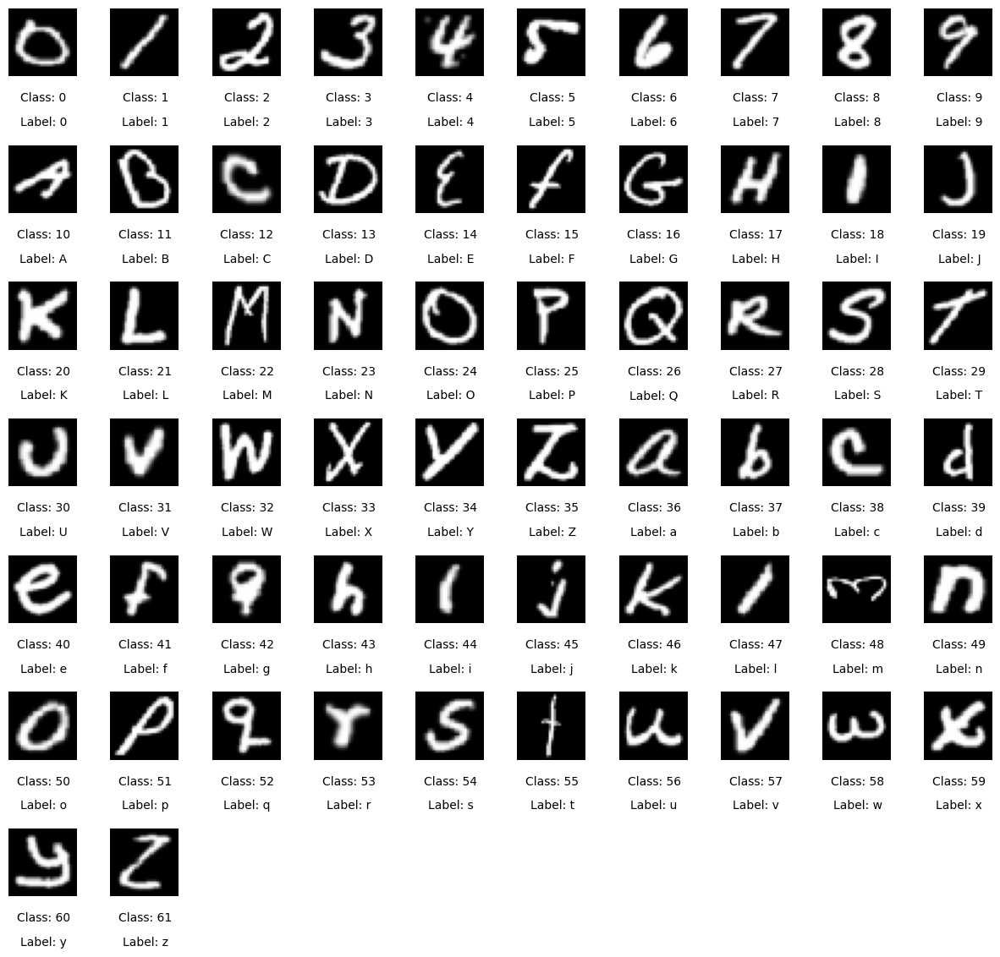

In [ ]:
# 클래스 이름 추출
class_names = sorted(train_y_byclass.unique())

# 클래스별 예시 이미지 출력
plot_class_examples(train_x_byclass, train_y_byclass, class_names, mapp_byclass)

### (b) bymerge

In [ ]:
train_bymerge = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/bymerge/emnist-bymerge-train.csv",delimiter = ',')
test_bymerge = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/bymerge/emnist-bymerge-test.csv", delimiter = ',')
mapp_bymerge = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/bymerge/emnist-bymerge-mapping.txt", delimiter = ' ', \
                   index_col=0, header=None, squeeze=True)
print("Train: %s, Test: %s, Map: %s" %(train_bymerge.shape, test_bymerge.shape, mapp_bymerge.shape))

Train: (697931, 785), Test: (116322, 785), Map: (47,)


In [ ]:
# Split x and y for bymerge dataset
train_x_bymerge = train_bymerge.iloc[:,1:]
train_y_bymerge = train_bymerge.iloc[:,0]
del train_bymerge

test_x_bymerge = test_bymerge.iloc[:,1:]
test_y_bymerge = test_bymerge.iloc[:,0]
del test_bymerge

print(train_x_bymerge.shape, train_y_bymerge.shape, test_x_bymerge.shape, test_y_bymerge.shape)

(697931, 784) (697931,) (116322, 784) (116322,)


In [ ]:
# Flip and rotate image for bymerge dataset
train_x_bymerge = np.asarray(train_x_bymerge)
train_x_bymerge = np.apply_along_axis(rotate, 1, train_x_bymerge)
print("train_x_bymerge:", train_x_bymerge.shape)

test_x_bymerge = np.asarray(test_x_bymerge)
test_x_bymerge = np.apply_along_axis(rotate, 1, test_x_bymerge)
print("test_x_bymerge:", test_x_bymerge.shape)

# Normalize
train_x_bymerge = train_x_bymerge.astype('float32')
train_x_bymerge /= 255
test_x_bymerge = test_x_bymerge.astype('float32')
test_x_bymerge /= 255


train_x_bymerge: (697931, 28, 28)
test_x_bymerge: (116322, 28, 28)


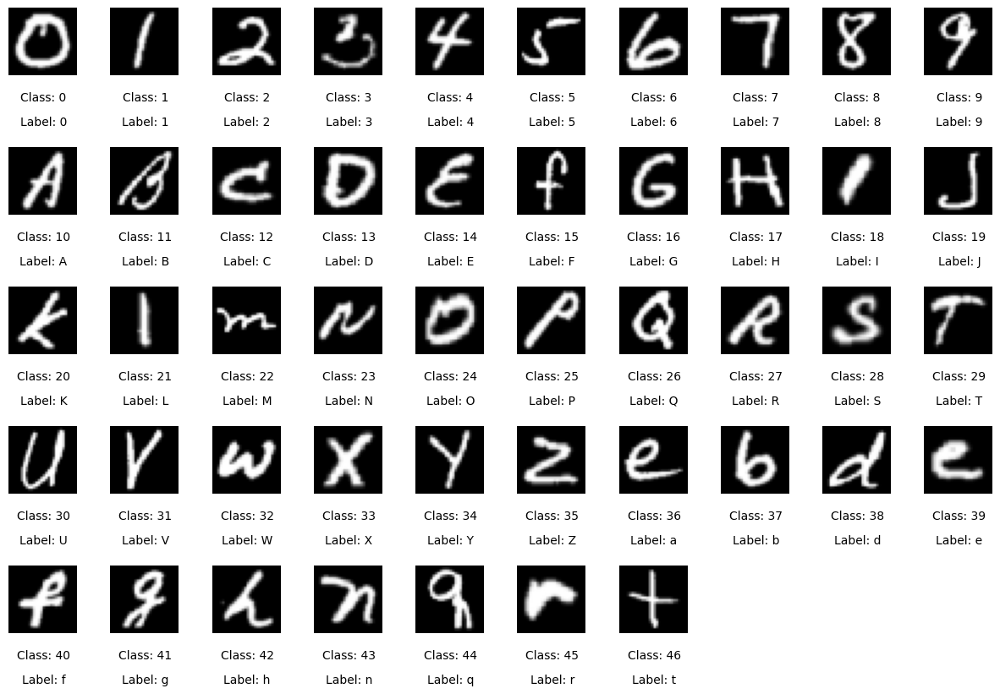

In [ ]:
# 클래스 이름 추출
class_names = sorted(train_y_bymerge.unique())

# 클래스별 예시 이미지 출력
plot_class_examples(train_x_bymerge, train_y_bymerge, class_names, mapp_bymerge)

### (c) balanced

In [ ]:
train_balanced = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/balanced/emnist-balanced-train.csv",delimiter = ',')
test_balanced = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/balanced/emnist-balanced-test.csv", delimiter = ',')
mapp_balanced = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/balanced/emnist-balanced-mapping.txt", delimiter = ' ', \
                   index_col=0, header=None, squeeze=True)
print("Train: %s, Test: %s, Map: %s" %(train_balanced.shape, test_balanced.shape, mapp_balanced.shape))

Train: (112799, 785), Test: (18799, 785), Map: (47,)


In [ ]:
# Split x and y for balanced dataset
train_x_balanced = train_balanced.iloc[:,1:]
train_y_balanced = train_balanced.iloc[:,0]
del train_balanced

test_x_balanced = test_balanced.iloc[:,1:]
test_y_balanced = test_balanced.iloc[:,0]
del test_balanced

print(train_x_balanced.shape, train_y_balanced.shape, test_x_balanced.shape, test_y_balanced.shape)

(112799, 784) (112799,) (18799, 784) (18799,)


In [ ]:
# Flip and rotate image for balanced dataset
train_x_balanced = np.asarray(train_x_balanced)
train_x_balanced = np.apply_along_axis(rotate, 1, train_x_balanced)
print("train_x_balanced:", train_x_balanced.shape)

test_x_balanced = np.asarray(test_x_balanced)
test_x_balanced = np.apply_along_axis(rotate, 1, test_x_balanced)
print("test_x_balanced:", test_x_balanced.shape)

# Normalize
train_x_balanced = train_x_balanced.astype('float32')
train_x_balanced /= 255
test_x_balanced = test_x_balanced.astype('float32')
test_x_balanced /= 255


train_x_balanced: (112799, 28, 28)
test_x_balanced: (18799, 28, 28)


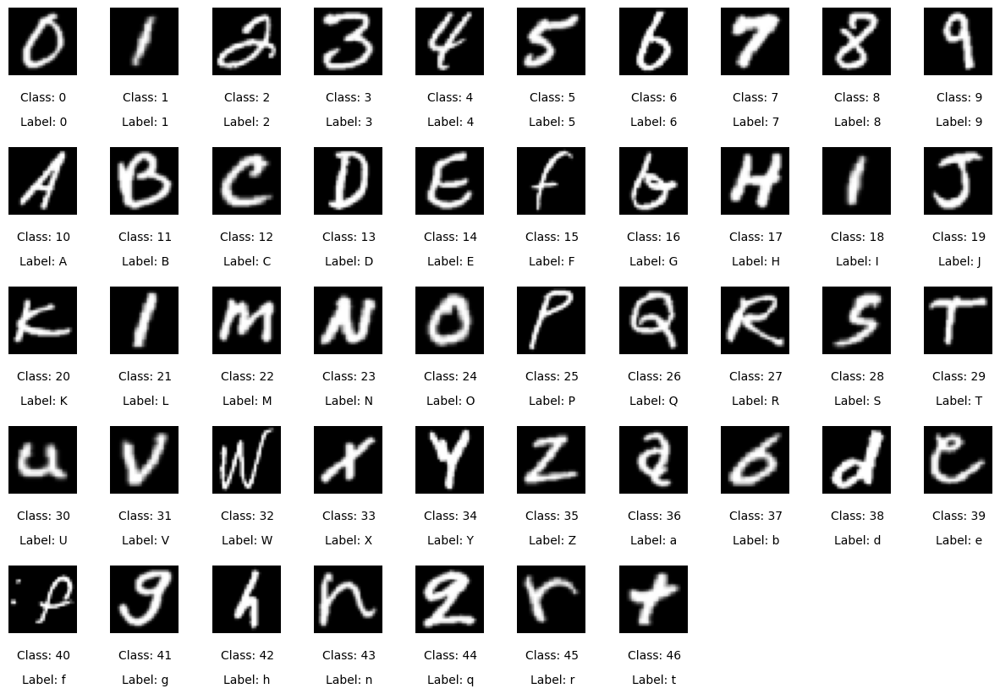

In [ ]:
# 클래스 이름 추출
class_names = sorted(train_y_balanced.unique())

# 클래스별 예시 이미지 출력
plot_class_examples(train_x_balanced, train_y_balanced, class_names, mapp_balanced)

### (d) digits

In [ ]:
train_digits = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/digits/emnist-digits-train.csv",delimiter = ',')
test_digits = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/digits/emnist-digits-test.csv", delimiter = ',')
mapp_digits = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/digits/emnist-digits-mapping.txt", delimiter = ' ', \
                   index_col=0, header=None, squeeze=True)
print("Train: %s, Test: %s, Map: %s" %(train_digits.shape, test_digits.shape, mapp_digits.shape))

Train: (239999, 785), Test: (39999, 785), Map: (10,)


In [ ]:
# Split x and y for digits dataset
train_x_digits = train_digits.iloc[:,1:]
train_y_digits = train_digits.iloc[:,0]
del train_digits

test_x_digits = test_digits.iloc[:,1:]
test_y_digits = test_digits.iloc[:,0]
del test_digits

print(train_x_digits.shape, train_y_digits.shape, test_x_digits.shape, test_y_digits.shape)

(239999, 784) (239999,) (39999, 784) (39999,)


In [ ]:
# Flip and rotate image
train_x_digits = np.asarray(train_x_digits)
train_x_digits = np.apply_along_axis(rotate, 1, train_x_digits)
print("train_x_digits:", train_x_digits.shape)

test_x_digits = np.asarray(test_x_digits)
test_x_digits = np.apply_along_axis(rotate, 1, test_x_digits)
print("test_x_digits:", test_x_digits.shape)

# Normalize
train_x_digits = train_x_digits.astype('float32')
train_x_digits /= 255
test_x_digits = test_x_digits.astype('float32')
test_x_digits /= 255


train_x_digits: (239999, 28, 28)
test_x_digits: (39999, 28, 28)


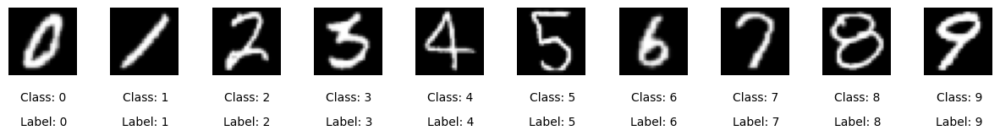

In [ ]:
# 클래스 이름 추출
class_names = sorted(train_y_digits.unique())

# 클래스별 예시 이미지 출력
plot_class_examples(train_x_digits, train_y_digits, class_names, mapp_digits)

### (e) letters

In [ ]:
train_letters = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/letters/emnist-letters-train.csv",delimiter = ',')
test_letters = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/letters/emnist-letters-test.csv", delimiter = ',')
mapp_letters = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/letters/emnist-letters-mapping.txt", delimiter=' ', index_col=0, header=None, squeeze=True)

# 딕셔너리로 변환: 각 클래스 인덱스에 대응하는 대문자와 소문자를 각각 관리
expanded_mapp_letters = {}
for index, row in mapp_letters.items():
    uppercase, lowercase = row[1], row[2]
    expanded_mapp_letters[(index - 1) * 2] = chr(uppercase)  # 대문자
    expanded_mapp_letters[(index - 1) * 2 + 1] = chr(lowercase)  # 소문자
print(mapp_letters)

print("Train: %s, Test: %s, Map: %s" %(train_letters.shape, test_letters.shape, len(mapp_letters)))

     1    2
0          
1   65   97
2   66   98
3   67   99
4   68  100
5   69  101
6   70  102
7   71  103
8   72  104
9   73  105
10  74  106
11  75  107
12  76  108
13  77  109
14  78  110
15  79  111
16  80  112
17  81  113
18  82  114
19  83  115
20  84  116
21  85  117
22  86  118
23  87  119
24  88  120
25  89  121
26  90  122
Train: (88799, 785), Test: (14799, 785), Map: 26


In [ ]:
# Split x and y for letters dataset
train_x_letters = train_letters.iloc[:,1:]
train_y_letters = train_letters.iloc[:,0]
del train_letters

test_x_letters = test_letters.iloc[:,1:]
test_y_letters = test_letters.iloc[:,0]
del test_letters

print(train_x_letters.shape, train_y_letters.shape, test_x_letters.shape, test_y_letters.shape)

(88799, 784) (88799,) (14799, 784) (14799,)


In [ ]:
# Flip and rotate image for letters dataset
train_x_letters = np.asarray(train_x_letters)
train_x_letters = np.apply_along_axis(rotate, 1, train_x_letters)
print("train_x_letters:", train_x_letters.shape)

test_x_letters = np.asarray(test_x_letters)
test_x_letters = np.apply_along_axis(rotate, 1, test_x_letters)
print("test_x_letters:", test_x_letters.shape)

# Normalize
train_x_letters = train_x_letters.astype('float32')
train_x_letters /= 255
test_x_letters = test_x_letters.astype('float32')
test_x_letters /= 255

train_x_letters: (88799, 28, 28)
test_x_letters: (14799, 28, 28)


In [ ]:
# 클래스별로 예시 이미지 출력
def plot_class_examples(images, labels, class_names, mapp):
    num_classes = len(class_names)
    num_rows = (num_classes // 10) + 1  # 최대 10개의 열을 가진 subplot의 행의 개수 계산
    num_cols = min(num_classes, 10)  # 최대 10개의 열을 가진 subplot의 열의 개수는 최대 클래스 개수까지
    
    plt.figure(figsize=(15, 2 * num_rows))
    
    for i, class_name in enumerate(class_names):
        class_indices = np.where(labels == class_name)[0]
        example_index = class_indices[0] if class_indices.size > 0 else None  # 클래스에 속한 이미지가 있는지 확인

        plt.subplot(num_rows, num_cols, i + 1)
        if example_index is not None:
            plt.imshow(images[example_index], cmap='gray')
            plt.axis('off')
            
            # 띄어쓰기 이전과 이후 내용 분리
            first_part, second_part = divmod(class_name, 2)
            print(first_part, second_part)
            
            # 이미지와 텍스트의 좌우 정렬을 위해 text 위치 조정
            image_width = images[example_index].shape[1]
            class_text = 'Class: {}'.format(class_name)
            label_text = 'Label: {}({})'.format(chr(mapp[first_part]), chr(mapp[second_part]))
            plt.text(image_width // 2, images[example_index].shape[0] + 10, class_text, fontsize=10, ha='center')
            plt.text(image_width // 2, images[example_index].shape[0] + 20, label_text, fontsize=10, ha='center')
        else:
            plt.text(0.5, 0.5, 'No image', fontsize=10, ha='center', va='center')
            plt.axis('off')

    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # subplot 간격 조정
    plt.show()

0 1


KeyError: 0

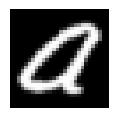

In [ ]:
# 클래스 이름 추출
class_names = sorted(train_y_letters.unique())

# 클래스별 예시 이미지 출력
plot_class_examples(train_x_letters, train_y_letters, class_names, mapp_letters)

### (6) mnist

In [ ]:
train_mnist = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/mnist/emnist-mnist-train.csv",delimiter = ',')
test_mnist = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/mnist/emnist-mnist-test.csv", delimiter = ',')
mapp_mnist = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/mnist/emnist-mnist-mapping.txt", delimiter = ' ', \
                   index_col=0, header=None, squeeze=True)

print("Train: %s, Test: %s, Map: %s" %(train_mnist.shape, test_mnist.shape, mapp_mnist.shape))

Train: (59999, 785), Test: (9999, 785), Map: (10,)


In [ ]:
# Split x and y for mnist dataset
train_x_mnist = train_mnist.iloc[:,1:]
train_y_mnist = train_mnist.iloc[:,0]
del train_mnist

test_x_mnist = test_mnist.iloc[:,1:]
test_y_mnist = test_mnist.iloc[:,0]
del test_mnist

print(train_x_mnist.shape, train_y_mnist.shape, test_x_mnist.shape, test_y_mnist.shape)

(59999, 784) (59999,) (9999, 784) (9999,)


In [ ]:
# Flip and rotate image for mnist dataset
train_x_mnist = np.asarray(train_x_mnist)
train_x_mnist = np.apply_along_axis(rotate, 1, train_x_mnist)
print("train_x_mnist:", train_x_mnist.shape)

test_x_mnist = np.asarray(test_x_mnist)
test_x_mnist = np.apply_along_axis(rotate, 1, test_x_mnist)
print("test_x_mnist:", test_x_mnist.shape)

# Normalize
train_x_mnist = train_x_mnist.astype('float32')
train_x_mnist /= 255
test_x_mnist = test_x_mnist.astype('float32')
test_x_mnist /= 255


train_x_mnist: (59999, 28, 28)
test_x_mnist: (9999, 28, 28)


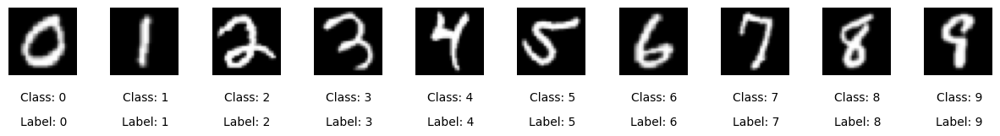

In [ ]:
# 클래스 이름 추출
class_names = sorted(train_y_mnist.unique())

# 클래스별 예시 이미지 출력
plot_class_examples(train_x_mnist, train_y_mnist, class_names, mapp_mnist)

## +) Reference

- https://www.simonwenkel.com/notes/ai/datasets/vision/EMNIST.html
- https://kh-mo.github.io/papers/2020/08/26/emnist/
- EMNIST 논문: https://arxiv.org/pdf/1702.05373v1
- NIST (EMNIST): https://www.nist.gov/itl/products-and-services/emnist-dataset
- Kaggle (EMNIST): https://www.kaggle.com/datasets/crawford/emnist?resource=download
- Visualizing the Data: https://www.kaggle.com/code/ashwani07/emnist-using-keras-cnn

# 2. Prepare the data
- dataset 분류: training/validation/test

## 0) Multi-GPU 할당

In [ ]:
import os
import tensorflow as tf

os.environ["CUDA_VISIBLE_DEVICES"] = "3,4,5"  # 사용할 GPU 번호 지정

# GPU 장치 목록 가져오기
gpus = tf.config.experimental.list_physical_devices('GPU')

# GPU 수 확인
gpu_count = len(gpus)
print("Number of GPUs:", gpu_count)

Number of GPUs: 3


## 1) Import Modules

In [ ]:
# Import modules
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import cv2
from keras.callbacks import EarlyStopping

#keras
from keras.models import Sequential
from keras.layers import Conv2D, AveragePooling2D, Flatten, Dense, Activation
from keras.callbacks import EarlyStopping
from keras.utils import np_utils
import sklearn.metrics as metrics

## 2) Preprocess the datasets

### 2-1) Constants

In [ ]:
HEIGHT = 28
WIDTH = 28

### 2-2) Rotate Function

In [ ]:
def rotate(image):
    image = image.reshape([HEIGHT, WIDTH])
    image = np.fliplr(image)
    image = np.rot90(image)
    return image

### 2-3) get the datasets from .csv files

In [ ]:
train_balanced = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/balanced/emnist-balanced-train.csv",delimiter = ',')
test_balanced = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/balanced/emnist-balanced-test.csv", delimiter = ',')
mapp_balanced = pd.read_csv("/home/hayeon/ann/프로젝트/emnist/balanced/emnist-balanced-mapping.txt", delimiter = ' ', \
                   index_col=0, header=None, squeeze=True)
print("Train: %s, Test: %s, Map: %s" %(train_balanced.shape, test_balanced.shape, mapp_balanced.shape))

Train: (112799, 785), Test: (18799, 785), Map: (47,)


### 2-4) Split datasets into trainset and testset

In [ ]:
train_x_balanced = train_balanced.iloc[:,1:]
train_y_balanced = train_balanced.iloc[:,0]
del train_balanced

test_x_balanced = test_balanced.iloc[:,1:]
test_y_balanced = test_balanced.iloc[:,0]
del test_balanced

print(train_x_balanced.shape, train_y_balanced.shape, test_x_balanced.shape, test_y_balanced.shape)

(112799, 784) (112799,) (18799, 784) (18799,)


### 2-5) Split trainset into trainset and validation set

In [ ]:
# testset의 크기 = validation set의 크기
val_size = len(test_x_balanced)

# Split datasets into trainset and validation set
train_x_balanced = train_x_balanced[:-val_size]
val_x_balanced = train_x_balanced[-val_size:]
train_y_balanced = train_y_balanced[:-val_size]
val_y_balanced = train_y_balanced[-val_size:]

### 2-6) Flip and rotate images

In [ ]:
train_x_balanced = np.asarray(train_x_balanced)
train_x_balanced = np.apply_along_axis(rotate, 1, train_x_balanced)
val_x_balanced = np.asarray(val_x_balanced)
val_x_balanced = np.apply_along_axis(rotate, 1, val_x_balanced)
test_x_balanced = np.asarray(test_x_balanced)
test_x_balanced = np.apply_along_axis(rotate, 1, test_x_balanced)

### 2-7) Normalize the pixel values

In [ ]:
train_x_balanced = train_x_balanced.astype('float32') / 255
val_x_balanced = val_x_balanced.astype('float32') / 255
test_x_balanced = test_x_balanced.astype('float32') / 255

### 2-8) check if preprocessing has done well

In [ ]:
print("train_x_balanced :", train_x_balanced.shape)
print("val_x_balanced :", val_x_balanced.shape)
print("test_x_balanced :", test_x_balanced.shape)

train_x_balanced : (94000, 28, 28)
val_x_balanced : (18799, 28, 28)
test_x_balanced : (18799, 28, 28)


- EMNIST balanced는 Trainset의 마지막 부분에 Testset과 같은 크기의 Validation set이 있다.
- 분류한 후, .shape을 통해 제대로 분리되었는지 확인하였다.

### 2-9) Calculate the number of unique label classes

In [ ]:
num_classes = train_y_balanced.nunique()
print("Number of label classes:", num_classes)

Number of label classes: 47


### 2-10) EMNIST balanced의 각 클래스의 이미지 개수가 같은지 확인

In [ ]:
def count_samples(labels):
    unique_classes, class_counts = np.unique(labels, return_counts=True)
    class_counts_dict = dict(zip(unique_classes, class_counts))
    return class_counts_dict

In [ ]:
# Train set
train_class_counts = count_samples(train_y_balanced)
print("Train set class distribution:")
for class_label, count in train_class_counts.items():
    print(f"{class_label}: {count} samples")

Train set class distribution:
0: 2000 samples
1: 2000 samples
2: 2000 samples
3: 2000 samples
4: 2000 samples
5: 2000 samples
6: 2000 samples
7: 2000 samples
8: 2000 samples
9: 2000 samples
10: 2000 samples
11: 2000 samples
12: 2000 samples
13: 2000 samples
14: 2000 samples
15: 2000 samples
16: 2000 samples
17: 2000 samples
18: 2000 samples
19: 2000 samples
20: 2000 samples
21: 2000 samples
22: 2000 samples
23: 2000 samples
24: 2000 samples
25: 2000 samples
26: 2000 samples
27: 2000 samples
28: 2000 samples
29: 2000 samples
30: 2001 samples
31: 2000 samples
32: 2000 samples
33: 2000 samples
34: 2000 samples
35: 2000 samples
36: 2000 samples
37: 2000 samples
38: 2000 samples
39: 2000 samples
40: 2000 samples
41: 2000 samples
42: 2000 samples
43: 2000 samples
44: 2000 samples
45: 1999 samples
46: 2000 samples


In [ ]:
# Validation set
val_class_counts = count_samples(val_y_balanced)
print("\nValidation set class distribution:")
for class_label, count in val_class_counts.items():
    print(f"{class_label}: {count} samples")


Validation set class distribution:
0: 383 samples
1: 404 samples
2: 422 samples
3: 376 samples
4: 393 samples
5: 420 samples
6: 415 samples
7: 400 samples
8: 360 samples
9: 402 samples
10: 388 samples
11: 366 samples
12: 414 samples
13: 418 samples
14: 410 samples
15: 413 samples
16: 405 samples
17: 403 samples
18: 398 samples
19: 421 samples
20: 383 samples
21: 403 samples
22: 398 samples
23: 411 samples
24: 386 samples
25: 404 samples
26: 396 samples
27: 369 samples
28: 389 samples
29: 400 samples
30: 365 samples
31: 387 samples
32: 400 samples
33: 394 samples
34: 418 samples
35: 395 samples
36: 389 samples
37: 377 samples
38: 433 samples
39: 420 samples
40: 422 samples
41: 384 samples
42: 407 samples
43: 418 samples
44: 439 samples
45: 386 samples
46: 415 samples


- 위 Validation set 결과에서 딱 400개씩이 아닌 이유?

    : Trainset의 각 클래스 별 이미지 개수는 같지만, 그 순서가 일정하지는 않다. 즉, 클래스 간의 균형을 유지하지만, 각 클래스 내의 샘플은 무작위로 섞일 수 있다. (데이터가 순서대로 정렬되지 않기 때문에 모델이 임의의 순서에 대해서도 잘 작동하도록 일반화되는 것이다.)

In [ ]:
# Test set
test_class_counts = count_samples(test_y_balanced)
print("\nTest set class distribution:")
for class_label, count in test_class_counts.items():
    print(f"{class_label}: {count} samples")


Test set class distribution:
0: 400 samples
1: 400 samples
2: 400 samples
3: 400 samples
4: 400 samples
5: 400 samples
6: 400 samples
7: 400 samples
8: 400 samples
9: 400 samples
10: 400 samples
11: 400 samples
12: 400 samples
13: 400 samples
14: 400 samples
15: 400 samples
16: 400 samples
17: 400 samples
18: 400 samples
19: 400 samples
20: 400 samples
21: 400 samples
22: 400 samples
23: 400 samples
24: 400 samples
25: 400 samples
26: 400 samples
27: 400 samples
28: 400 samples
29: 400 samples
30: 400 samples
31: 400 samples
32: 400 samples
33: 400 samples
34: 400 samples
35: 400 samples
36: 400 samples
37: 400 samples
38: 400 samples
39: 400 samples
40: 400 samples
41: 399 samples
42: 400 samples
43: 400 samples
44: 400 samples
45: 400 samples
46: 400 samples


- Train, Val, Test dataset에서 클래스 간 이미지 개수가 동일함을 확인하였다.

### 2-11) 클래스 별로 예시 이미지 출력

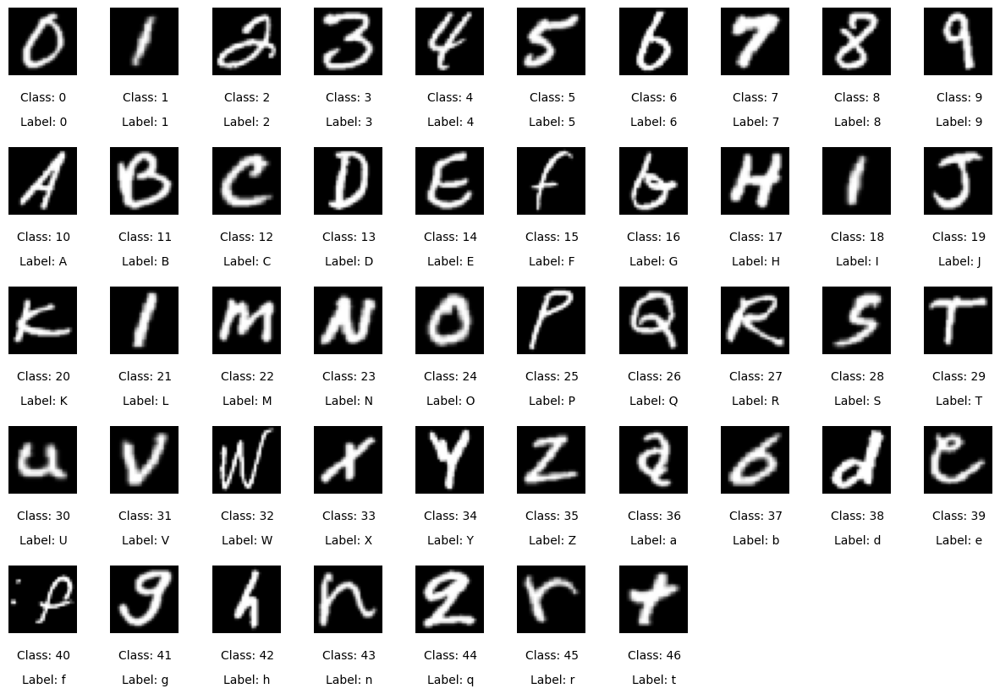

In [ ]:
# 클래스별로 예시 이미지 출력
def plot_class_examples(images, labels, class_names, mapp):
    num_classes = len(class_names)
    num_rows = (num_classes // 10) + 1  # 최대 10개의 열을 가진 subplot의 행의 개수 계산
    num_cols = min(num_classes, 10)  # 최대 10개의 열을 가진 subplot의 열의 개수는 최대 클래스 개수까지
    
    plt.figure(figsize=(15, 2 * num_rows))
    
    for i, class_name in enumerate(class_names):
        class_indices = np.where(labels == class_name)[0]
        example_index = class_indices[0] if class_indices.size > 0 else None  # 클래스에 속한 이미지가 있는지 확인

        plt.subplot(num_rows, num_cols, i + 1)
        if example_index is not None:
            plt.imshow(images[example_index], cmap='gray')
            plt.axis('off')
            
            # 이미지와 텍스트의 좌우 정렬을 위해 text 위치 조정
            image_width = images[example_index].shape[1]
            class_text = 'Class: {}'.format(class_name)
            label_text = 'Label: {}'.format(chr(mapp[class_name]))
            plt.text(image_width // 2, images[example_index].shape[0] + 10, class_text, fontsize=10, ha='center')
            plt.text(image_width // 2, images[example_index].shape[0] + 20, label_text, fontsize=10, ha='center')
        else:
            plt.text(0.5, 0.5, 'No image', fontsize=10, ha='center', va='center')
            plt.axis('off')

    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # subplot 간격 조정
    plt.show()

# 클래스 이름 추출
class_names = sorted(train_y_balanced.unique())

# 클래스별 예시 이미지 출력
plot_class_examples(train_x_balanced, train_y_balanced, class_names, mapp_balanced)

## 3. Prepare for Distributed Training

https://www.tensorflow.org/guide/keras/distributed_training

### 3-1) 분산 학습을 위한 설정 (GPUs)

In [ ]:
from tensorflow.python.client import device_lib

# 로컬 디바이스 목록 가져오기
device_lib.list_local_devices()

# gpu 이름
gpus = tf.config.experimental.list_logical_devices('GPU')

# gpu가 2개 이상이면, MirroredStrategy 인스턴스 생성
if len(gpus) > 1: 
    strategy = tf.distribute.MirroredStrategy([gpu.name for gpu in gpus])
    print('\n\n Running on multiple GPUs ', [gpu.name for gpu in gpus])
    num_gpus = len(gpus)

# gpu가 1개 이하면, 디폴트 전략 설정
else:
    strategy = tf.distribute.get_strategy() # default strategy that works on CPU and single GPU
    print('\n\n Running on single GPU', gpus[0].name)
    print('\n\n #accelerators: ', strategy.num_replicas_in_sync, '\n\n')

2024-05-09 17:10:50.984414: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-09 17:10:52.679775: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 22346 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:22:00.0, compute capability: 8.6
2024-05-09 17:10:52.681572: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 22346 MB memory:  -> device: 1, name: NVIDIA RTX A5000, pci bus id: 0000:23:00.0, compute capability: 8.6
2024-05-09 17:10:52.683111: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 22346 MB memory:  -> device: 2, name: NVIDIA RTX A5000, pci bus id: 0000:24:00.0,

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


 Running on multiple GPUs  ['/device:GPU:0', '/device:GPU:1', '/device:GPU:2']


### 3-2) 분산 데이터셋 설정
- 코드 설명
    - batch_size: **GPU 개수와 배치 사이즈가 지수 관계에 있도록 설정하기 위해, num_gpus를 곱하여 문제가 없도록 하였다.**

    - suffle: 일정한 크기의 데이터가 랜덤 선택되어 버퍼에 임시 저장된 후 섞인다.
        - 너무 작은 버퍼 크기를 사용하면 데이터가 충분히 섞이지 않을 수 있다.
        - 너무 큰 버퍼 크기를 사용하면 메모리를 많이 소비하게 된다.
        - 이 과정에서 **버퍼의 한도를 설정하지 않으면 shuffle하는 시간이 학습 시간보다 오래 걸리는 현상이 발생하여, buffer_size를 10000으로 제한하였다.**

    - 한 에포크에 몇 step이 실행되는지 len(trainset)과 batch_size에 기반하여 계산하였다.
        - np.ceil

    - tf.data.Dataset.from_tensor_slices
        - .shuffle()
        - .cache()
        - .batch(batch_size)
        - .repeat()
        - .prefetch(tf.data.AUTOTUNE)

    - strategy.experimental_distribute_dataset()

- 발생하는 **Warning: AUTO sharding policy will apply DATA sharding policy**
    - Sharding: 데이터를 여러 부분으로 분할하는 프로세스

    - tensorflow에서 자동으로 데이터셋을 sharding하는 정책을 적용한다는 메시지가 출력된 것.
    
    - **tensorflow가 자동으로 데이터를 sharding하여 분산 처리하고 있음을 나타내는 것이므로, 계속 진행함.**

In [ ]:
batch_size = 64 * num_gpus
shuffle_buffer_size = 10000
train_steps_per_epoch = int(np.ceil(len(train_x_balanced) / batch_size))
val_steps_per_epoch = int(np.ceil(len(val_x_balanced) / batch_size))

train_dataset = tf.data.Dataset.from_tensor_slices((train_x_balanced, train_y_balanced)).shuffle(shuffle_buffer_size)
train_dataset = train_dataset.cache().batch(batch_size).repeat().prefetch(tf.data.AUTOTUNE)
train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)

val_dataset = tf.data.Dataset.from_tensor_slices((val_x_balanced, val_y_balanced))
val_dataset = val_dataset.cache().batch(batch_size).repeat().prefetch(tf.data.AUTOTUNE)
val_dist_dataset = strategy.experimental_distribute_dataset(val_dataset)

test_dataset = tf.data.Dataset.from_tensor_slices((test_x_balanced, test_y_balanced))
test_dataset = test_dataset.cache().batch(batch_size).prefetch(tf.data.AUTOTUNE)
test_dist_dataset = strategy.experimental_distribute_dataset(test_dataset)

2024-05-09 17:11:58.371463: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:776] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Found an unshardable source dataset: name: "TensorSliceDataset/_2"
op: "TensorSliceDataset"
input: "Placeholder/_0"
input: "Placeholder/_1"
attr {
  key: "Toutput_types"
  value {
    list {
      type: DT_FLOAT
      type: DT_INT64
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: 94000
  }
}
attr {
  key: "is_files"
  value {
    b: false
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\024TensorSliceDataset:0"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: 28
        }
        dim {
          size: 28
        }
      }
      shape {
      }
    }
  }
}
experimental_type {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_DATASET
    args {
      type_id: TFT_PRODUCT
      args {
        type_id: TFT_TENSO

# 3. Baseline 학습 및 분석

## 0) Import Modules
Custom utilities (프로젝트 진행 시 계속 필요한 내용들을 따로 정의하여 불러옴.)
- num_of_gpu : 사용할 gpu 개수 지정
- distribute_dataset : 분산학습을 위한 데이터셋 전처리
- set_strategy : 분산학습 위한 모델 정의 과정

In [ ]:
# Standard library imports
import os
import time

# Third-party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from tensorflow.python.client import device_lib
import seaborn as sns

# Keras imports
from keras.callbacks import EarlyStopping
from keras.layers import Activation, AveragePooling2D, Conv2D, Dense, Dropout, Flatten, Layer, Input
from keras.models import Sequential
from keras.utils import np_utils
import keras.backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

# Custom utilities (프로젝트 진행 시 계속 필요한 내용들을 따로 정의하여 불러옴.)
from distribution_utils import num_of_gpu, distribute_dataset, set_strategy
from datasets_utils import prepare_datasets, plot_class_examples, class_counts_plot
from train_and_test_utils import set_before_train, test_loss_and_accuracy, plot_learning_curves

## 1) Multi-gpu 할당

In [ ]:
num_gpus = num_of_gpu(num=4)

Number of GPUs: 4


## 2) Prepare the Data

In [ ]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes = prepare_datasets('balanced')

X_train shape: (94000, 32, 32, 3)
X_valid shape: (18799, 32, 32, 3)
X_test shape: (18799, 32, 32, 3)
Number of label classes: 47


- EMNIST balanced는 Trainset의 마지막 부분에 Testset과 같은 크기의 Validation set이 있다.
- 분류한 후, .shape을 통해 제대로 분리되었는지 확인하였다.
- 해당 데이터셋이 몇개의 클래스를 가지고 있는지도 확인하였다.

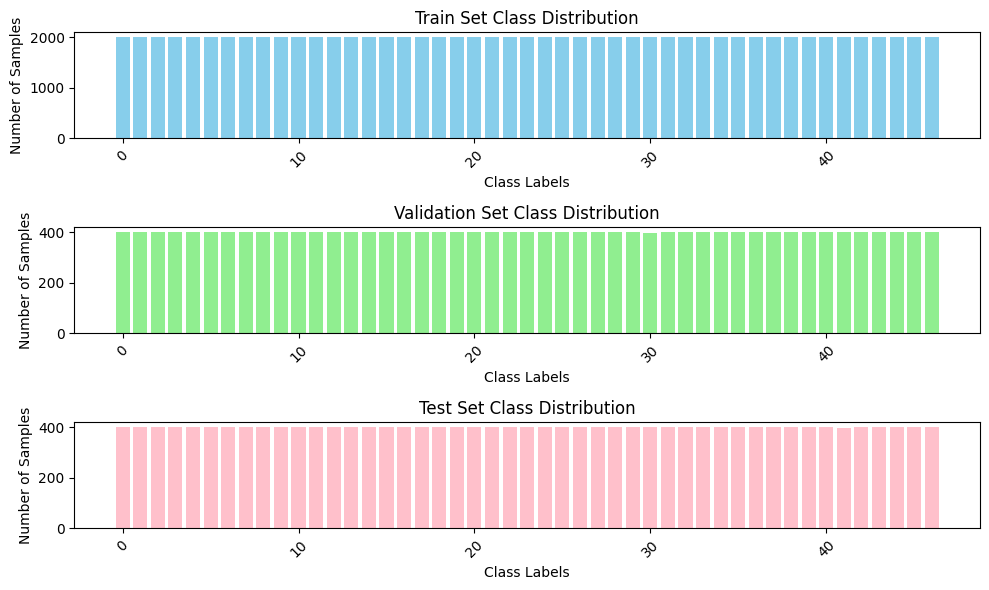

In [ ]:
class_counts_plot(y_train, y_valid, y_test)

- Train, (Val,) Test dataset에서 각각 클래스 간 이미지 개수가 동일함을 확인하였다.

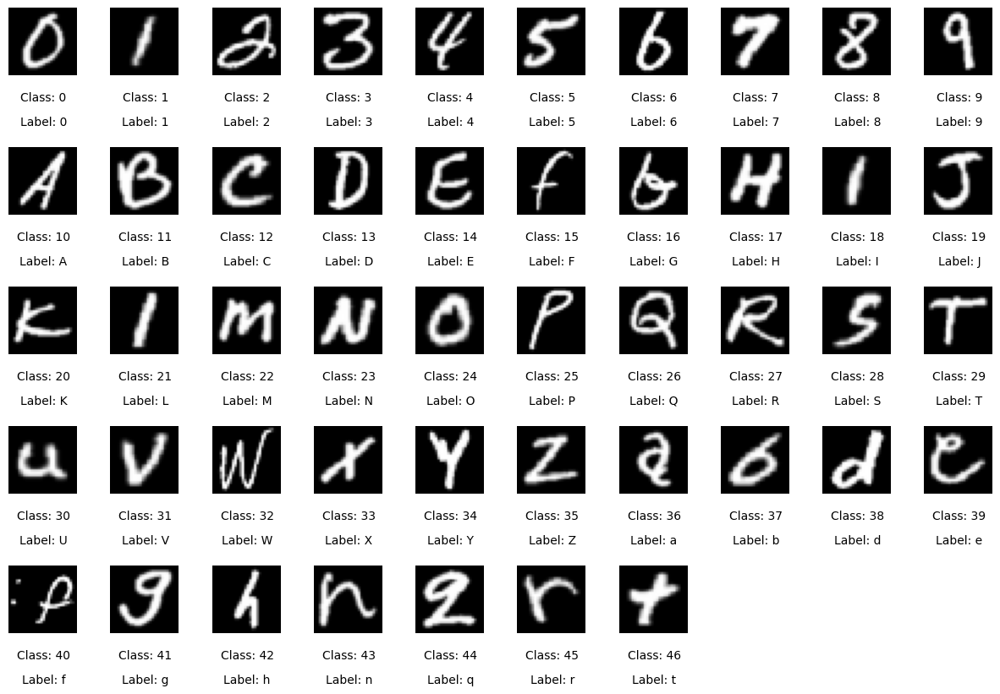

In [ ]:
# 클래스별 예시 이미지 출력
plot_class_examples(X_train, y_train, mapp)

## 3) Prepare for Distributed Training

### 3-1) 분산 학습을 위한 설정

In [ ]:
strategy = set_strategy()

2024-05-19 23:16:06.482548: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-19 23:16:08.659192: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 22346 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:21:00.0, compute capability: 8.6
2024-05-19 23:16:08.660776: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 22346 MB memory:  -> device: 1, name: NVIDIA RTX A5000, pci bus id: 0000:22:00.0, compute capability: 8.6
2024-05-19 23:16:08.662297: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 22346 MB memory:  -> device: 2, name: NVIDIA RTX A5000, pci bus id: 0000:23:00.0,

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


 Running on multiple GPUs  ['/device:GPU:0', '/device:GPU:1', '/device:GPU:2', '/device:GPU:3']


In [ ]:
print(strategy)

### 3-3) 분산 데이터셋 설정
- 코드 설명
    - batch_size: **GPU 개수와 배치 사이즈가 지수 관계에 있도록 설정하기 위해, num_gpus를 곱하여 문제가 없도록 하였다.**

    - suffle: 일정한 크기의 데이터가 랜덤 선택되어 버퍼에 임시 저장된 후 섞인다.
        - 너무 작은 버퍼 크기를 사용하면 데이터가 충분히 섞이지 않을 수 있다.
        - 너무 큰 버퍼 크기를 사용하면 메모리를 많이 소비하게 된다.
        - 이 과정에서 **버퍼의 한도를 설정하지 않으면 shuffle하는 시간이 학습 시간보다 오래 걸리는 현상이 발생하여, buffer_size를 10000으로 제한하였다.**

    - 한 에포크에 몇 step이 실행되는지 len(trainset)과 batch_size에 기반하여 계산하였다.
        - np.ceil: 

    - tf.data.Dataset.from_tensor_slices
        - .shuffle(): 
        - .cache(): 
        - .batch(batch_size): 
        - .repeat(): 
        - .prefetch(tf.data.AUTOTUNE): 

    - strategy.experimental_distribute_dataset()

- 발생하는 **Warning: AUTO sharding policy will apply DATA sharding policy**
    - Sharding: 데이터를 여러 부분으로 분할하는 프로세스

    - tensorflow에서 자동으로 데이터셋을 sharding하는 정책을 적용한다는 메시지가 출력된 것.
    
    - **tensorflow가 자동으로 데이터를 sharding하여 분산 처리하고 있음을 나타내는 것이므로, 계속 진행함.**

In [ ]:
batch_size = 512
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset = distribute_dataset(batch_size, num_gpus, strategy,
                                                                                X_train, y_train,
                                                                                X_valid, y_valid,
                                                                                X_test, y_test)

## 3) LeNet5
- 논문: Gradient-Based Learning Applied to Document Recognition (1998) (https://homl.info/lenet5)

    Layer  | Type            | Maps | Size     | Kernel size | Stride | Activation
    -------|-----------------|------|----------|-------------|--------|-----------
    Out   | Fully connected | –    | 10       | –           | –      | RBF
    F6    | Fully connected | –    | 84       | –           | –      | tanh
    C5    | Convolution     | 120  | 1 × 1    | 5 × 5       | 1      | tanh
    S4    | Avg pooling     | 16   | 5 × 5    | 2 × 2       | 2      | tanh
    C3    | Convolution     | 16   | 10 × 10  | 5 × 5       | 1      | tanh
    S2    | Avg pooling     | 6    | 14 × 14  | 2 × 2       | 2      | tanh
    C1    | Convolution     | 6    | 28 × 28  | 5 × 5       | 1      | tanh
    In    | Input           | 1    | 32 × 32  | –           | –      | –

- LeNet-6는 전체적으로 7개의 레이어로 구성되어있지만, 그 중 Convolution Layer와 Fully Connected Layer만을 고려할 때 5개의 레이어로 구성된다.
    - C1 (1st Layer; Convolution Layer)
    - S2 (2nd Layer; Average Pooling Layer)
    - C3 (3rd Layer; Convolution Layer)
    - S4 (4th Layer; Average Pooling Layer)
    - C5 (5th Layer; Convolution Layer)

    ![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/af3429a7-ade2-47ea-824b-45dc2d7981fb)

- 최근 분류 CNN과 가장 크게 차이나는 점은 '활성화 함수'이다.
    - 요즘은 tanh 대신에 ReLU를 사용하고, RBF 대신에 softmax를 사용한다. (from. 교재)


### 모델 구축

In [ ]:
class RBFActivation(Layer):
    def __init__(self, num_classes, **kwargs):
        super(RBFActivation, self).__init__(**kwargs)
        self.num_classes = num_classes

    def build(self, input_shape):
        # 중심점을 위한 가중치 정의 (학습 가능)
        self.centers = self.add_weight(name='centers',
                                       shape=(self.num_classes, input_shape[-1]),
                                       initializer='uniform',
                                       trainable=True)

    def call(self, inputs):
        # 입력과 각 중심점과의 거리를 계산
        c = K.expand_dims(self.centers, axis=0)  # centers를 배치 차원에 맞게 확장
        x = K.expand_dims(inputs, axis=1)       # 입력을 클래스 차원에 맞게 확장
        distances = K.sum(K.square(x - c), axis=-1)  # 유클리드 거리 제곱 계산
        # 지수 함수 적용
        return K.exp(-distances)

    def get_config(self):
        config = super(RBFActivation, self).get_config()
        config.update({
            "num_classes": self.num_classes
        })
        return config

In [ ]:
with strategy.scope():
    # LeNet-new 모델 정의
    model_LeNet5_old = Sequential(name="LeNet5-old")

    # 첫 번째 합성곱 층 (6개 필터)
    model_LeNet5_old.add(Conv2D(filters=6, kernel_size=5, strides=1, activation='tanh', input_shape=[28, 28, 3], padding='same'))
    model_LeNet5_old.add(AveragePooling2D(pool_size=2, strides=2, padding='valid'))

    # 두 번째 합성곱 층 (16개 필터)
    model_LeNet5_old.add(Conv2D(filters=16, kernel_size=5, strides=1, activation='tanh', padding='valid'))
    model_LeNet5_old.add(AveragePooling2D(pool_size=2, strides=2, padding='valid'))

    # 세 번째 합성곱 층 (120개 필터)
    model_LeNet5_old.add(Conv2D(filters=120, kernel_size=5, strides=1, activation='tanh', padding='valid'))

    # 완전 연결층
    model_LeNet5_old.add(Flatten())
    model_LeNet5_old.add(Dense(84, activation='tanh'))  # 은닉층
    model_LeNet5_old.add(Dropout(0.5))
    model_LeNet5_old.add(RBFActivation(num_classes))  # 출력층 (EMNIST 클래스 수에 맞게 설정)

    # 모델 컴파일
    model_LeNet5_old.compile(optimizer='adam',
                             loss='sparse_categorical_crossentropy',
                             metrics=['accuracy'])

# 모델 구조 확인
model_LeNet5_old.summary()

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Model: "LeNet5-old"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 6)         456       
                                                                 
 average_pooling2d (AverageP  (None, 14, 14, 6)        0         
 ooling2D)                                                       
                        

In [ ]:
with strategy.scope():
    # LeNet-new 모델 정의
    model_LeNet5_new = Sequential(name="LeNet5-new")

    # 첫 번째 합성곱 층 (6개 필터)
    model_LeNet5_new.add(Conv2D(filters=6, kernel_size=5, strides=1, activation='relu', input_shape=[28, 28, 3], padding='same'))
    model_LeNet5_new.add(AveragePooling2D(pool_size=2, strides=2, padding='valid'))

    # 두 번째 합성곱 층 (16개 필터)
    model_LeNet5_new.add(Conv2D(filters=16, kernel_size=5, strides=1, activation='relu', padding='valid'))
    model_LeNet5_new.add(AveragePooling2D(pool_size=2, strides=2, padding='valid'))

    # 세 번째 합성곱 층 (120개 필터)
    model_LeNet5_new.add(Conv2D(filters=120, kernel_size=5, strides=1, activation='relu', padding='valid'))

    # 완전 연결층
    model_LeNet5_new.add(Flatten())
    model_LeNet5_new.add(Dense(84, activation='relu'))  # 은닉층
    model_LeNet5_new.add(Dropout(0.5))
    model_LeNet5_new.add(Dense(num_classes, activation='softmax'))  # 출력층 (EMNIST 클래스 수에 맞게 설정)

    # 모델 컴파일
    model_LeNet5_new.compile(optimizer='adam',
                             loss='sparse_categorical_crossentropy',
                             metrics=['accuracy'])

# 모델 구조 확인
model_LeNet5_new.summary()

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Model: "LeNet5-new"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 28, 28, 6)         456       
                                                                 
 average_pooling2d_2 (Averag  (None, 14, 14, 6)        0         
 ePooling2D)                                                     
                        

### 학습

In [ ]:
def get_model_path(model_name):
    model_path = "trained_models/" + model_name + ".h5"
    return model_path

In [ ]:
model_path_LeNet5_old = get_model_path(model_LeNet5_old.name)
early_stopping, model_checkpoint_cb = set_before_train(10, model_LeNet5_old.name)

with strategy.scope():
    start_time = time.time()
    history_model_LeNet5_old = model_LeNet5_old.fit(train_dist_dataset, 
                               epochs=100, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb])
    end_time = time.time()

model_LeNet5_old.save(model_path_LeNet5_old)
print("Training time : ", end_time - start_time)

Epoch 1/100
INFO:tensorflow:batch_all_reduce: 9 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:batch_all_reduce: 9 all-reduces with algorithm = nccl, num_packs = 1


2024-05-19 21:15:49.779601: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2024-05-19 21:15:51.337896: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2024-05-19 21:15:53.084244: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2024-05-19 21:15:55.401450: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2024-05-19 21:15:57.747196: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


182/184 [============================>.] - ETA: 0s - loss: 2.9224 - accuracy: 0.3899

2024-05-19 21:16:04.655899: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: LeNet5-old/assets
184/184 [==============================] - 21s 30ms/step - loss: 2.9149 - accuracy: 0.3913 - val_loss: 2.1646 - val_accuracy: 0.5642
Epoch 2/100
184/184 [==============================] - 4s 19ms/step - loss: 1.8362 - accuracy: 0.5934 - val_loss: 1.3655 - val_accuracy: 0.6877
Epoch 3/100
184/184 [==============================] - 4s 19ms/step - loss: 1.3529 - accuracy: 0.6751 - val_loss: 1.0917 - val_accuracy: 0.7228
Epoch 4/100
184/184 [==============================] - 4s 20ms/step - loss: 1.1542 - accuracy: 0.7059 - val_loss: 0.9506 - val_accuracy: 0.7409
Epoch 5/100
184/184 [==============================] - 4s 21ms/step - loss: 1.0530 - accuracy: 0.7177 - val_loss: 0.8411 - val_accuracy: 0.7582
Epoch 6/100
184/184 [==============================] - 4s 20ms/step - loss: 0.9780 - accuracy: 0.7321 - val_loss: 0.7708 - val_accuracy: 0.7798
Epoch 7/100
184/184 [==============================] - 4s 19ms/step - loss: 0.9095 - accuracy:

In [ ]:
model_path_LeNet5_new = get_model_path(model_LeNet5_new.name)
early_stopping, model_checkpoint_cb = set_before_train(10, model_LeNet5_new.name)

with strategy.scope():
    start_time = time.time()
    history_model_LeNet5_new = model_LeNet5_new.fit(train_dist_dataset, 
                               epochs=100, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb])
    end_time = time.time()

model_LeNet5_new.save(model_path_LeNet5_new)
print("Training time : ", end_time - start_time)

Epoch 1/100
INFO:tensorflow:batch_all_reduce: 10 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 10 all-reduces with algorithm = nccl, num_packs = 1
184/184 [==============================] - 9s 27ms/step - loss: 2.6495 - accuracy: 0.2900 - val_loss: 1.2784 - val_accuracy: 0.6474
Epoch 2/100
184/184 [==============================] - 4s 20ms/step - loss: 1.4096 - accuracy: 0.5828 - val_loss: 0.8428 - val_accuracy: 0.7329
Epoch 3/100
184/184 [==============================] - 3s 19ms/step - loss: 1.0910 - accuracy: 0.6698 - val_loss: 0.6886 - val_accuracy: 0.7798
Epoch 4/100
184/184 [==============================] - 4s 19ms/step - loss: 0.9438 - accuracy: 0.7089 - val_loss: 0.6516 - val_accuracy: 0.7836
Epoch 5/100
184/184 [==============================] - 3s 19ms/step - loss: 0.8491 - accuracy: 0.7342 - val_loss: 0.5692 - val_accuracy: 0.8104
Epoch 6/100
184/184 [==============================] - 3s 19ms/step - loss: 0.7682 - accuracy: 0.7553 - val_

### Learning Curve 확인

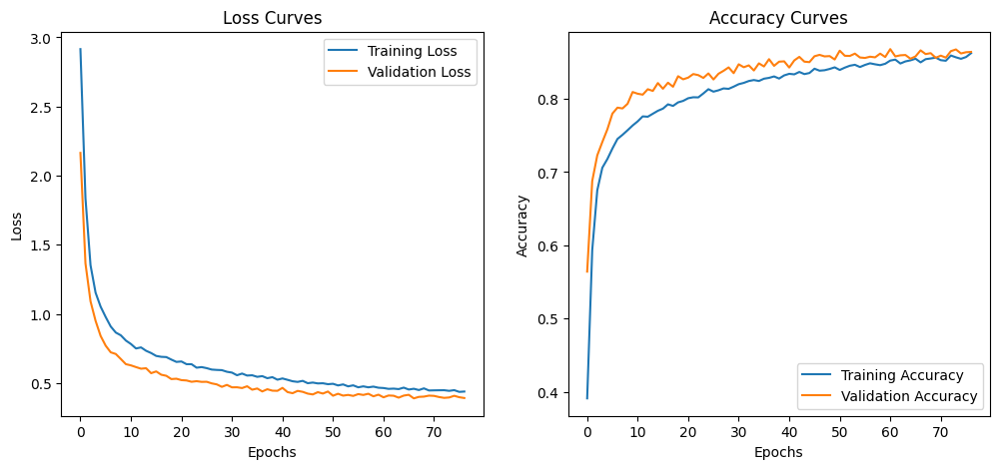

In [ ]:
plot_learning_curves(history_model_LeNet5_old)

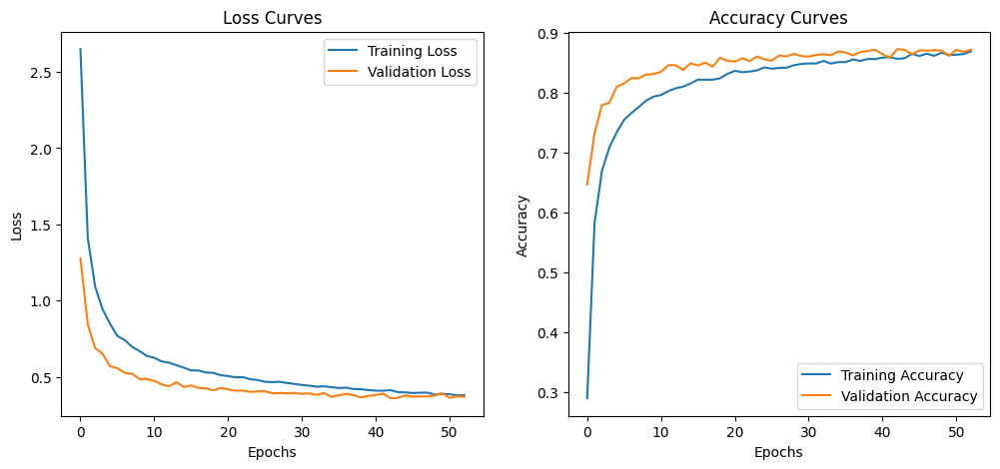

In [ ]:
plot_learning_curves(history_model_LeNet5_new)

### Testset으로 성능 평가

In [ ]:
# 테스트 데이터셋의 샘플 수
test_samples = len(X_test)

# 배치 크기와 GPU 수를 곱하여 총 배치 크기를 계산합니다.
total_batch_size = batch_size * num_gpus

# 단계 수 계산
test_steps = test_samples // total_batch_size

model = tf.keras.models.load_model(model_path_LeNet5_old, custom_objects={"RBFActivation": RBFActivation})

# 테스트 데이터셋을 사용하여 모델 평가
test_loss, test_accuracy = model_LeNet5_old.evaluate(test_dist_dataset, steps=test_steps)

# 소수점 아래 셋째 자리까지 반올림하여 출력
test_loss_rounded = round(test_loss, 3)
test_accuracy_rounded = round(test_accuracy, 3)

# 반올림된 값 출력
print("Model Name: ", model_LeNet5_old.name)
print("Test Loss: {:.3f}".format(test_loss_rounded))
print("Test Accuracy: {:.3f}".format(test_accuracy_rounded))

9/9 [==============================] - 0s 7ms/step - loss: 0.4227 - accuracy: 0.8611
Model Name:  LeNet5-old
Test Loss: 0.423
Test Accuracy: 0.861


In [ ]:
# 테스트 데이터셋의 샘플 수
test_samples = len(X_test)
total_batch_size = batch_size * num_gpus
test_steps = test_samples // total_batch_size
model = tf.keras.models.load_model(model_path_LeNet5_new)
test_loss, test_accuracy = model_LeNet5_new.evaluate(test_dist_dataset, steps=test_steps)
test_loss_rounded = round(test_loss, 3)
test_accuracy_rounded = round(test_accuracy, 3)
print("Model Name: ", model_LeNet5_new.name)
print("Test Loss: {:.3f}".format(test_loss_rounded))
print("Test Accuracy: {:.3f}".format(test_accuracy_rounded))

9/9 [==============================] - 0s 7ms/step - loss: 0.4200 - accuracy: 0.8689
Model Name:  LeNet5-new
Test Loss: 0.420
Test Accuracy: 0.869


In [ ]:
# Perform predictions on X_test using the model
predictions = model_path_LeNet5_old.predict(X_test)

# Get predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Generate confusion matrix based on true and predicted labels
conf_matrix = confusion_matrix(y_test, predicted_labels)

# Visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', annot_kws={"size": 6})  # Adjust text size
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.savefig('Confusion_Matrix/' + str(model_path_LeNet5_old.name) + '.png')  # Save as a file
plt.show()

In [ ]:
# Perform predictions on X_test using the model
predictions = model_path_LeNet5_new.predict(X_test)

# Get predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Generate confusion matrix based on true and predicted labels
conf_matrix = confusion_matrix(y_test, predicted_labels)

# Visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', annot_kws={"size": 6})  # Adjust text size
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.savefig('Confusion_Matrix/' + str(model_path_LeNet5_new.name) + '.png')  # Save as a file
plt.show()

## 2) ResNet-50

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/2a00af02-1cfa-4012-b7f9-00f378fd7b15)

### 2-1) tf.keras.applications.resnet50.ResNet50
### 이미지를 32*32로 upscaling

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# 데이터셋 하나 표시 (크기 변환 확인용)
def display_image(image, title=None):
    print(f"Image shape: {image.shape}")  # 이미지 크기 출력
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes = prepare_datasets('balanced')

X_train shape: (94000, 32, 32, 3)
X_valid shape: (18799, 32, 32, 3)
X_test shape: (18799, 32, 32, 3)
Number of label classes: 47


In [ ]:
X_valid[0][15]

array([[0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.00392157, 0.00392157, 0.00392157],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.17254902, 0.17254902, 0.17254902],
       [0.73333335, 0.73333335, 0.73333335],
       [0.9843137 , 0.9843137 , 0.9843137 ],
       [1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        ],
       [0.8235294 , 0.8235294 , 0.8235294 ],
       [0.6666667 , 0.6666667 , 0.6666667 ],
       [0.84705883, 0.84705883, 0.84705883],
       [0.9372549 , 0.9372549 , 0.9372549 ],
       [0.9882353 , 0.9882353 , 0.9882353 ],
       [1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        ],
       [0.99607843, 0.99607843, 0.99607843],
       [1.        , 1.        , 1.        ],
       [1.

Image shape: (32, 32, 3)


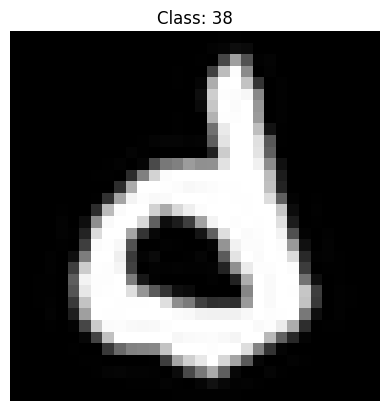

In [ ]:
# Display the first image in X_valid
display_image(X_valid[0], title=f"Class: {y_valid[0]}")

In [ ]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes = prepare_datasets('balanced', resize_shape=(32, 32))

X_train shape: (94000, 32, 32, 3)
X_valid shape: (18799, 32, 32, 3)
X_test shape: (18799, 32, 32, 3)
Number of label classes: 47


In [ ]:
X_valid[0][15]

array([[0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.00392157, 0.00392157, 0.00392157],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.17254902, 0.17254902, 0.17254902],
       [0.73333335, 0.73333335, 0.73333335],
       [0.9843137 , 0.9843137 , 0.9843137 ],
       [1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        ],
       [0.8235294 , 0.8235294 , 0.8235294 ],
       [0.6666667 , 0.6666667 , 0.6666667 ],
       [0.84705883, 0.84705883, 0.84705883],
       [0.9372549 , 0.9372549 , 0.9372549 ],
       [0.9882353 , 0.9882353 , 0.9882353 ],
       [1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        ],
       [0.99607843, 0.99607843, 0.99607843],
       [1.        , 1.        , 1.        ],
       [1.

Image shape: (32, 32, 3)


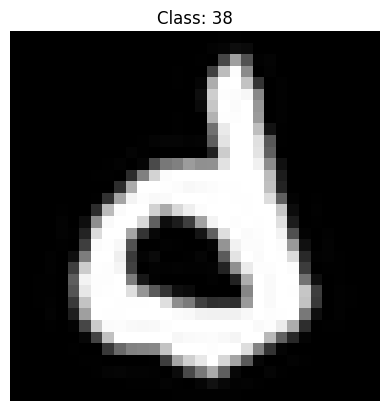

In [ ]:
import matplotlib.pyplot as plt

# Display one image from X_valid
def display_image(image, title=None):
    print(f"Image shape: {image.shape}")  # 이미지 크기 출력
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

# Display the first image in X_valid
display_image(X_valid[0], title=f"Class: {y_valid[0]}")

In [ ]:
# 배치 사이즈
batch_size = 512

# Distribute datasets
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset = distribute_dataset(batch_size, num_gpus, strategy,
                                                                                X_train, y_train,
                                                                                X_valid, y_valid,
                                                                                X_test, y_test)

### tf.keras.applications.resnet50.ResNet50 사용 - 학습

- include_top: 이 매개변수는 네트워크의 최상단에 완전 연결층(fully-connected layer)을 포함할지 여부를 결정합니다. True로 설정하면, 모델의 최상단에 클래스 분류를 위한 완전 연결층이 추가되며, 입력 이미지 크기는 (224, 224, 3)이어야 합니다. False로 설정하면, 이 완전 연결층이 포함되지 않으며, 사용자가 원하는 다양한 크기의 입력을 사용할 수 있습니다(단, 최소 32x32 크기 이상).

- weights: 이 매개변수는 모델의 가중치를 초기화하는 방법을 결정합니다. None을 선택하면 무작위 초기화가 이루어지고, "imagenet"을 선택하면 ImageNet 데이터에 사전 훈련된 가중치를 사용합니다. 가중치 파일의 경로를 문자열로 제공할 수도 있어, 사용자가 특정 파일에서 가중치를 불러올 수 있습니다.

- input_tensor: 이 매개변수는 모델의 입력으로 사용할 선택적 Keras 텐서를 지정합니다. 이는 tf.keras.layers.Input()의 출력 등 다른 레이어의 출력을 직접 모델 입력으로 사용할 때 유용합니다.

- input_shape: include_top이 False일 때만 지정할 수 있는 입력 형태입니다. 이는 모델이 받을 입력의 형태를 정의하며, 채널 수는 반드시 3개여야 하고, 너비와 높이는 최소 32 이상이어야 합니다. 예를 들어, (200, 200, 3)은 유효한 값입니다.

- pooling: include_top이 False일 경우 선택할 수 있는 풀링 모드로, 특징 추출을 위해 사용됩니다. None은 모델의 마지막 컨볼루션 블록 출력을 그대로 사용하며, avg는 글로벌 평균 풀링을 적용하고, max는 글로벌 최대 풀링을 적용합니다. 이는 모델의 출력을 2D 텐서로 변경합니다.

- classes: include_top이 True이고 weights가 지정되지 않았을 때만 지정할 수 있습니다. 이는 이미지를 분류할 클래스의 수를 정의합니다. 예를 들어, 1000개의 다른 카테고리로 이미지를 분류하려면 이 값을 1000으로 설정합니다.

- classifier_activation: 최상단 레이어의 활성화 함수를 설정합니다. include_top=True일 때만 이 매개변수가 의미가 있습니다. None을 설정하면 "로짓"(softmax 전의 출력)을 반환하고, "softmax"를 설정하면 softmax 활성화 함수를 적용합니다. 사전 훈련된 가중치를 사용하는 경우, 이 매개변수는 None 또는 "softmax"로만 설정할 수 있습니다.
    - 학습할 때는 from_logits=True를 사용하여 로짓을 사용하고,
    - 추론할 때는 activation='softmax'를 통해 소프트맥스 활성화 함수를 사용합니다.

In [ ]:
with strategy.scope():
    model_ResNet50 = tf.keras.applications.resnet50.ResNet50(include_top=True,
                                                             weights=None,
                                                             input_shape=(32, 32, 3),
                                                             pooling=max,
                                                             classes=num_classes)

    model_ResNet50.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model_ResNet50.summary()

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Redu

- SavedModel 형식: 기본적으로 TensorFlow Keras의 model.save 메서드는 SavedModel 형식으로 저장됩니다. 이는 디렉토리 구조로 저장되며, 다양한 TensorFlow 서버 및 플랫폼에서 사용할 수 있음.
- HDF5 형식 (.h5): 단일 파일에 모델 구조, 가중치, 학습 구성 등을 저장할 수 있는 형식.
- 체크포인트 형식 (.ckpt): 주로 가중치와 옵티마이저 상태를 저장하는 데 사용.

In [ ]:
#plot_model(model_ResNet50, to_file='model_ResNet50.png', show_shapes=True)

In [ ]:
def plot_learning_curves(history):
    plt.figure(figsize=(12, 5))

    # Plotting loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss Curves')

    # Plotting accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy Curves')

    plt.show()

Epoch 1/200
INFO:tensorflow:batch_all_reduce: 214 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 214 all-reduces with algorithm = nccl, num_packs = 1


2024-05-19 23:18:05.921597: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2024-05-19 23:18:07.438101: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2024-05-19 23:18:09.190665: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2024-05-19 23:18:12.005217: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2024-05-19 23:18:15.122180: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


184/184 [==============================] - ETA: 0s - loss: 2.0721 - accuracy: 0.4979

2024-05-19 23:18:50.399311: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: resnet50/assets
184/184 [==============================] - 121s 266ms/step - loss: 2.0721 - accuracy: 0.4979 - val_loss: 6.3390 - val_accuracy: 0.0230
Epoch 2/200
184/184 [==============================] - 44s 241ms/step - loss: 0.8580 - accuracy: 0.7361 - val_loss: 5.7192 - val_accuracy: 0.1195
Epoch 3/200
184/184 [==============================] - 44s 241ms/step - loss: 0.7271 - accuracy: 0.7774 - val_loss: 0.9177 - val_accuracy: 0.7090
Epoch 4/200
184/184 [==============================] - 22s 119ms/step - loss: 0.7502 - accuracy: 0.7776 - val_loss: 1.5694 - val_accuracy: 0.6362
Epoch 5/200
184/184 [==============================] - 44s 242ms/step - loss: 0.6893 - accuracy: 0.8021 - val_loss: 0.7753 - val_accuracy: 0.7686
Epoch 6/200
184/184 [==============================] - 21s 113ms/step - loss: 0.5824 - accuracy: 0.8215 - val_loss: 1.3323 - val_accuracy: 0.6744
Epoch 7/200
184/184 [==============================] - 44s 242ms/step - loss: 0.5596

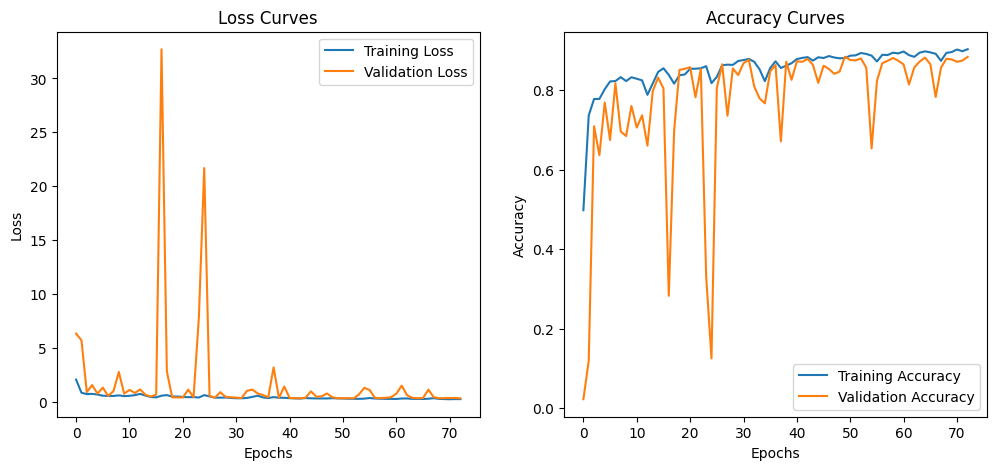

9/9 [==============================] - 1s 34ms/step - loss: 0.3555 - accuracy: 0.8793
Model Name:  resnet50
Test Loss: 0.355
Test Accuracy: 0.879


In [ ]:
# 학습
model_path_model_ResNet50 = get_model_path(model_ResNet50.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_ResNet50.name)

with strategy.scope():
    start_time = time.time()
    history_model_ResNet50 = model_ResNet50.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb])
    end_time = time.time()

model_ResNet50.save(model_path_model_ResNet50)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_ResNet50)

# 테스트셋으로 성능 평가
# test_samples = len(X_test)
# total_batch_size = batch_size * num_gpus
# test_steps = test_samples // total_batch_size
# model = tf.keras.models.load_model(model_path_model_ResNet50)
# test_loss, test_accuracy = model_ResNet50.evaluate(test_dist_dataset, steps=test_steps)
# test_loss_rounded = round(test_loss, 3)
# test_accuracy_rounded = round(test_accuracy, 3)
# print("Model Name: ", model_ResNet50.name)
# print("Test Loss: {:.3f}".format(test_loss_rounded))
# print("Test Accuracy: {:.3f}".format(test_accuracy_rounded))
test_loss_and_accuracy(model_ResNet50, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### tf.keras.applications.resnet50.ResNet50 사용 - 추가 성능 평가

In [ ]:
from sklearn.metrics import classification_report

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    
    print("Classification Report:")
    print(classification_report(y_test, y_pred_classes))

In [ ]:
evaluate_model(model_ResNet50, X_test, y_test)

2024-05-19 23:49:53.180712: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:776] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Did not find a shardable source, walked to a node which is not a dataset: name: "FlatMapDataset/_9"
op: "FlatMapDataset"
input: "PrefetchDataset/_8"
attr {
  key: "Targuments"
  value {
    list {
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: -2
  }
}
attr {
  key: "f"
  value {
    func {
      name: "__inference_Dataset_flat_map_slice_batch_indices_839965"
    }
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\023FlatMapDataset:1163"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: -1
        }
      }
    }
  }
}
attr {
  key: "output_types"
  value {
    list {
      type: DT_INT64
    }
  }
}
experimental_type {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_DATASET
    args {
      type_id: TFT_PR

Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.56      0.61       400
           1       0.55      0.66      0.60       400
           2       0.94      0.88      0.91       400
           3       0.99      0.97      0.98       400
           4       0.92      0.94      0.93       400
           5       0.94      0.91      0.92       400
           6       0.96      0.92      0.94       400
           7       0.98      0.98      0.98       400
           8       0.98      0.84      0.91       400
           9       0.69      0.81      0.75       400
          10       0.96      0.94      0.95       400
          11       0.95      0.95      0.95       400
          12       0.94      0.97      0.95       400
          13       0.93      0.91      0.92       400
          14       0.98      0.97      0.97       400
          15       0.77      0.44      0.56       400
          16       0.94      0.95      0.95       400
    

2024-05-19 23:50:17.254800: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:776] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Did not find a shardable source, walked to a node which is not a dataset: name: "FlatMapDataset/_9"
op: "FlatMapDataset"
input: "PrefetchDataset/_8"
attr {
  key: "Targuments"
  value {
    list {
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: -2
  }
}
attr {
  key: "f"
  value {
    func {
      name: "__inference_Dataset_flat_map_slice_batch_indices_848370"
    }
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\023FlatMapDataset:1196"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: -1
        }
      }
    }
  }
}
attr {
  key: "output_types"
  value {
    list {
      type: DT_INT64
    }
  }
}
experimental_type {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_DATASET
    args {
      type_id: TFT_PR

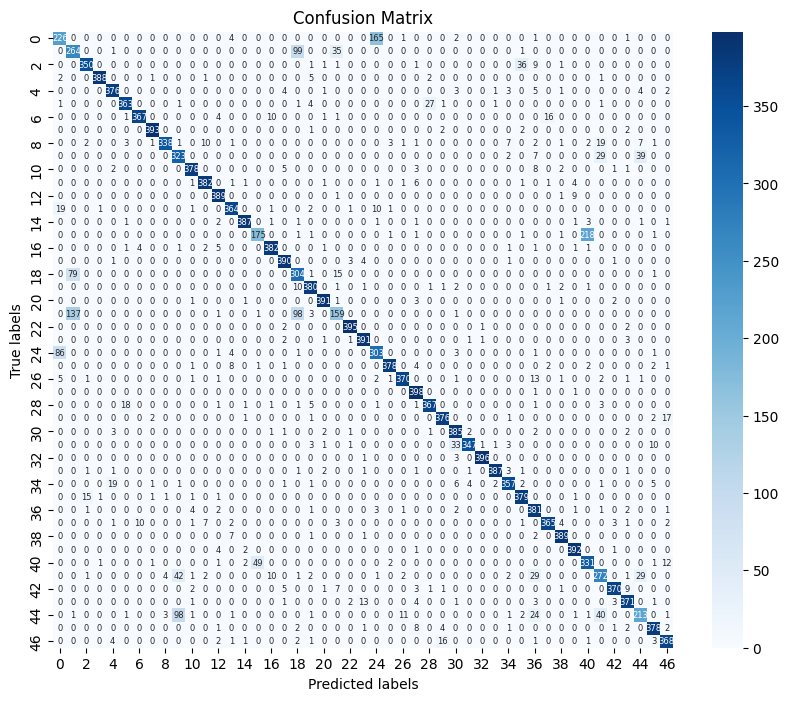

In [ ]:
# Perform predictions on X_test using the model
predictions = model_ResNet50.predict(X_test)

# Get predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Generate confusion matrix based on true and predicted labels
conf_matrix = confusion_matrix(y_test, predicted_labels)

# Visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', annot_kws={"size": 6})  # Adjust text size
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.savefig('Confusion_Matrix/' + str(model_ResNet50.name) + '.png')  # Save as a file
plt.show()

### 2-2) ResNet 모델 구현 및 학습
[ 바꿔볼 수 있는 것들 ]
1. 배치 사이즈 변경

2. 활성화 함수 변경: LeakyReLU, PReLU, ELU 등

3. regularization 추가: dropout, l2 regularization

4. Learning Rate Scheduler: 학습률을 동적으로 조정하기

5. 데이터 증강(data augmentation)
    - confusion matrix 확인 후, 부족한 부분의 데이터셋을 더 보충해보기

6. optimizer 변경: Adam, SGD with momentum, RMSprop

7. batchnormalization 추가

8. 네트워크 깊이 및 폭 변경: resnet의 블록 수 변경, 각 블록의 필터 수 변경

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Activation, Add, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization, Resizing, Dense, LeakyReLU
from tensorflow.keras import layers
import tensorflow as tf

# reference : https://velog.io/@astron8t/ResNet-50-%EB%AA%A8%EB%8D%B8-%EA%B5%AC%ED%98%84

def first_convolution(x):
    x = Conv2D(64, (7, 7), strides=(2, 2), padding='same', name='conv1')(x)
    x = BatchNormalization(name='conv1_bn')(x)
    x = Activation('relu')(x)
    return x

def first_pooling(x):
    return MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

def residual_block(input_tensor, kernel_size, filters, stage, block, use_leaky_relu=False):
    filters1, filters2, filters3 = filters

    conv_name_base = f'res{stage}{block}_branch'
    bn_name_base = f'bn{stage}{block}_branch'

    x = Conv2D(filters1, (1, 1), name=conv_name_base + '2a')(input_tensor)
    x = BatchNormalization(name=bn_name_base + '2a')(x)
    x = LeakyReLU(alpha=0.1)(x) if use_leaky_relu else Activation('relu')(x)

    x = Conv2D(filters2, kernel_size, padding='same', name=conv_name_base + '2b')(x)
    x = BatchNormalization(name=bn_name_base + '2b')(x)
    x = LeakyReLU(alpha=0.1)(x) if use_leaky_relu else Activation('relu')(x)

    x = Conv2D(filters3, (1, 1), name=conv_name_base + '2c')(x)
    x = BatchNormalization(name=bn_name_base + '2c')(x)

    x = Add()([x, input_tensor])
    x = LeakyReLU(alpha=0.1)(x) if use_leaky_relu else Activation('relu')(x)
    return x

def downsize_block(input_tensor, kernel_size, strides, filters, stage, block, use_leaky_relu=False):
    filters1, filters2, filters3 = filters

    conv_name_base = f'res{stage}{block}_branch'
    bn_name_base = f'bn{stage}{block}_branch'

    x = Conv2D(filters1, (1, 1), strides=strides, name=conv_name_base + '2a')(input_tensor)
    x = BatchNormalization(name=bn_name_base + '2a')(x)
    x = LeakyReLU(alpha=0.1)(x) if use_leaky_relu else Activation('relu')(x)

    x = Conv2D(filters2, kernel_size, padding='same', name=conv_name_base + '2b')(x)
    x = BatchNormalization(name=bn_name_base + '2b')(x)
    x = LeakyReLU(alpha=0.1)(x) if use_leaky_relu else Activation('relu')(x)

    x = Conv2D(filters3, (1, 1), name=conv_name_base + '2c')(x)
    x = BatchNormalization(name=bn_name_base + '2c')(x)

    shortcut = Conv2D(filters3, (1, 1), strides=strides, name=conv_name_base + '1')(input_tensor)
    shortcut = BatchNormalization(name=bn_name_base + '1')(shortcut)

    x = Add()([x, shortcut])
    x = LeakyReLU(alpha=0.1)(x) if use_leaky_relu else Activation('relu')(x)
    return x

#### 1. 배치 사이즈 키우기 (256 -> 2048)

In [ ]:
from distribution_utils import num_of_gpu, distribute_dataset, set_strategy

# 배치 사이즈
batch_size = 2048

# Distribute datasets
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset = distribute_dataset(batch_size, num_gpus, strategy,
                                                                                X_train, y_train,
                                                                                X_valid, y_valid,
                                                                                X_test, y_test)

In [ ]:
# 모델 정의
with strategy.scope():
    input_tensor = Input(shape=(32, 32, 3))
    x = Resizing(224, 224, interpolation='bilinear')(input_tensor)  # Resize input images to 224x224x3
    #x = data_augmentation(x)

    # 첫번째 stage, convolution 수행, strides = 2 로 하여 크기를 반으로
    x = first_convolution(x)

    # 두번째 stage, pooling 을 적용하여 크기를 반으로 줄이고 첫번째 downsize block 에서는 strides = 1 로 함.
    x = first_pooling(x)
    x = downsize_block(x, (3, 3), (1, 1), (64, 64, 256), 2, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'c', use_leaky_relu=False)

    # 세번째 stage, block 의 수는 4개
    x = downsize_block(x, (3, 3), (2, 2), (128, 128, 512), 3, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'c', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'd', use_leaky_relu=False)

    # 네번째 stage, block 의 수는 6개
    x = downsize_block(x, (3, 3), (2, 2), (256, 256, 1024), 4, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'c', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'd', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'e', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'f', use_leaky_relu=False)

    # 다섯번째 stage, block 의 수는 3개
    x = downsize_block(x, (3, 3), (2, 2), (512, 512, 2048), 5, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'c', use_leaky_relu=False)

    # Global Average Pooling 으로 사이즈를 1x1x2048 로 만듦.
    x = GlobalAveragePooling2D()(x)
    #x = Dropout(0.5)(x)  # Dropout 추가
    output_tensor = Dense(num_classes, activation='softmax')(x)

    model_ResNet50 = Model(inputs=input_tensor, outputs=output_tensor)

    model_ResNet50.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model_ResNet50.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 resizing_1 (Resizing)          (None, 224, 224, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 112, 112, 64  9472        ['resizing_1[0][0]']             
                                )                                                                 
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 112, 112, 64  256         ['conv1[0][0]']            

Epoch 1/200
INFO:tensorflow:batch_all_reduce: 214 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 214 all-reduces with algorithm = nccl, num_packs = 1
46/46 [==============================] - 111s 1s/step - loss: 1.7907 - accuracy: 0.5360 - val_loss: 15.0622 - val_accuracy: 0.0215
Epoch 2/200
46/46 [==============================] - 43s 937ms/step - loss: 0.5457 - accuracy: 0.8177 - val_loss: 12.4059 - val_accuracy: 0.0225
Epoch 3/200
46/46 [==============================] - 44s 970ms/step - loss: 0.4553 - accuracy: 0.8423 - val_loss: 11.3233 - val_accuracy: 0.0215
Epoch 4/200
46/46 [==============================] - 21s 457ms/step - loss: 0.4192 - accuracy: 0.8540 - val_loss: 12.3653 - val_accuracy: 0.0205
Epoch 5/200
46/46 [==============================] - 20s 430ms/step - loss: 0.4129 - accuracy: 0.8587 - val_loss: 12.9023 - val_accuracy: 0.0354
Epoch 6/200
46/46 [==============================] - 20s 431ms/step - loss: 0.3763 - accuracy: 0.8691 -

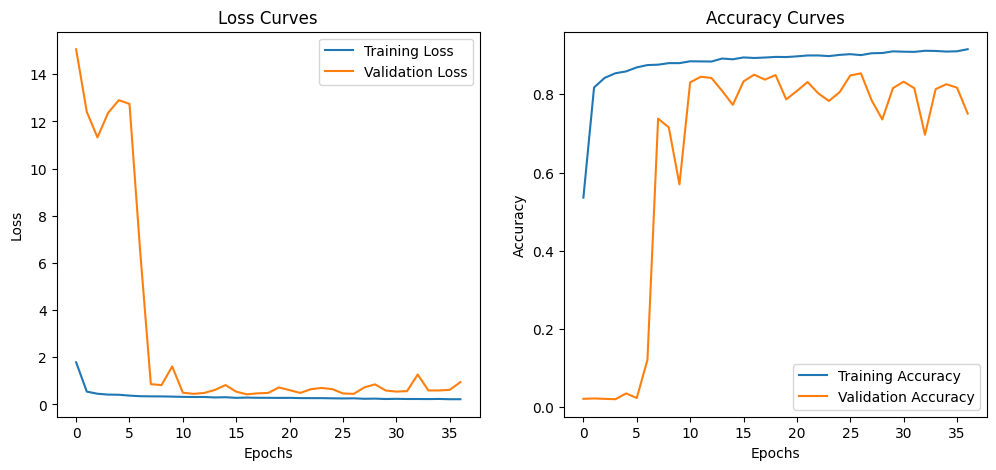

2/2 [==============================] - 1s 112ms/step - loss: 1.0040 - accuracy: 0.7598
Model Name:  model_1
Test Loss: 1.004
Test Accuracy: 0.760


In [ ]:
# 학습
model_path_model_ResNet50 = get_model_path(model_ResNet50.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_ResNet50.name)

with strategy.scope():
    start_time = time.time()
    history_model_ResNet50 = model_ResNet50.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb])
    end_time = time.time()

model_ResNet50.save(model_path_model_ResNet50)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_ResNet50)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_ResNet50, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

#### 2. Learning Rate Scheduler: 학습률을 동적으로 조정하기

In [ ]:
from tensorflow.keras.optimizers import Adam

In [ ]:
# 모델 정의
with strategy.scope():
    input_tensor = Input(shape=(32, 32, 3))
    x = Resizing(224, 224, interpolation='bilinear')(input_tensor)  # Resize input images to 224x224x3
    #x = data_augmentation(x)

    # 첫번째 stage, convolution 수행, strides = 2 로 하여 크기를 반으로
    x = first_convolution(x)

    # 두번째 stage, pooling 을 적용하여 크기를 반으로 줄이고 첫번째 downsize block 에서는 strides = 1 로 함.
    x = first_pooling(x)
    x = downsize_block(x, (3, 3), (1, 1), (64, 64, 256), 2, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'c', use_leaky_relu=False)

    # 세번째 stage, block 의 수는 4개
    x = downsize_block(x, (3, 3), (2, 2), (128, 128, 512), 3, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'c', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'd', use_leaky_relu=False)

    # 네번째 stage, block 의 수는 6개
    x = downsize_block(x, (3, 3), (2, 2), (256, 256, 1024), 4, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'c', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'd', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'e', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'f', use_leaky_relu=False)

    # 다섯번째 stage, block 의 수는 3개
    x = downsize_block(x, (3, 3), (2, 2), (512, 512, 2048), 5, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'c', use_leaky_relu=False)

    # Global Average Pooling 으로 사이즈를 1x1x2048 로 만듦.
    x = GlobalAveragePooling2D()(x)
    #x = Dropout(0.5)(x)  # Dropout 추가
    output_tensor = Dense(num_classes, activation='softmax')(x)

    model_ResNet50 = Model(inputs=input_tensor, outputs=output_tensor)

    # 초기 학습률 설정
    initial_learning_rate = 0.0005
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_ResNet50.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])


model_ResNet50.summary()


Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 resizing_4 (Resizing)          (None, 224, 224, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 112, 112, 64  9472        ['resizing_4[0][0]']             
                                )                                                                 
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 112, 112, 64  256         ['conv1[0][0]']            

일반적으로 ReduceLROnPlateau의 patience 값을 early_stopping의 절반 정도로 설정한다고 하여 patience를 10으로 설정함. 최종 모델 선정 후 변경 필요.

Epoch 1/200
INFO:tensorflow:batch_all_reduce: 214 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 214 all-reduces with algorithm = nccl, num_packs = 1
46/46 [==============================] - 114s 1s/step - loss: 1.6809 - accuracy: 0.5403 - val_loss: 6.4254 - val_accuracy: 0.0201 - lr: 5.0000e-04
Epoch 2/200
46/46 [==============================] - 20s 429ms/step - loss: 0.5251 - accuracy: 0.8232 - val_loss: 8.8709 - val_accuracy: 0.0213 - lr: 5.0000e-04
Epoch 3/200
46/46 [==============================] - 20s 429ms/step - loss: 0.4366 - accuracy: 0.8507 - val_loss: 10.0827 - val_accuracy: 0.0219 - lr: 5.0000e-04
Epoch 4/200
46/46 [==============================] - 20s 428ms/step - loss: 0.3896 - accuracy: 0.8626 - val_loss: 9.6613 - val_accuracy: 0.0270 - lr: 5.0000e-04
Epoch 5/200
46/46 [==============================] - 20s 434ms/step - loss: 0.3939 - accuracy: 0.8621 - val_loss: 10.2014 - val_accuracy: 0.0250 - lr: 5.0000e-04
Epoch 6/200
46/46 [==

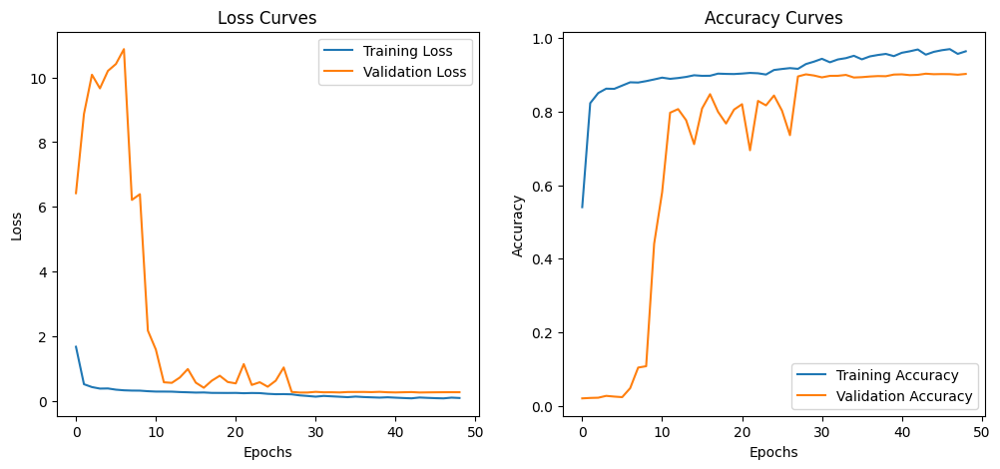

2/2 [==============================] - 1s 113ms/step - loss: 0.3088 - accuracy: 0.9062
Model Name:  model_4
Test Loss: 0.309
Test Accuracy: 0.906


In [ ]:
# 학습
model_path_model_ResNet50 = get_model_path(model_ResNet50.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_ResNet50.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_ResNet50 = model_ResNet50.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_ResNet50.save(model_path_model_ResNet50)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_ResNet50)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_ResNet50, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

#### 3. 활성화 함수 변경: LeakyReLU, PReLU, ELU 등

In [ ]:
# 모델 정의
with strategy.scope():
    input_tensor = Input(shape=(32, 32, 3))
    x = Resizing(224, 224, interpolation='bilinear')(input_tensor)  # Resize input images to 224x224x3
    #x = data_augmentation(x)

    # 첫번째 stage, convolution 수행, strides = 2 로 하여 크기를 반으로
    x = first_convolution(x)

    # 두번째 stage, pooling 을 적용하여 크기를 반으로 줄이고 첫번째 downsize block 에서는 strides = 1 로 함.
    x = first_pooling(x)
    x = downsize_block(x, (3, 3), (1, 1), (64, 64, 256), 2, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'c', use_leaky_relu=True)

    # 세번째 stage, block 의 수는 4개
    x = downsize_block(x, (3, 3), (2, 2), (128, 128, 512), 3, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'c', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'd', use_leaky_relu=True)

    # 네번째 stage, block 의 수는 6개
    x = downsize_block(x, (3, 3), (2, 2), (256, 256, 1024), 4, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'c', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'd', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'e', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'f', use_leaky_relu=True)

    # 다섯번째 stage, block 의 수는 3개
    x = downsize_block(x, (3, 3), (2, 2), (512, 512, 2048), 5, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'c', use_leaky_relu=True)

    # Global Average Pooling 으로 사이즈를 1x1x2048 로 만듦.
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)  # Dropout 추가
    output_tensor = Dense(num_classes, activation='softmax')(x)

    model_ResNet50 = Model(inputs=input_tensor, outputs=output_tensor)

    # 초기 학습률 설정
    initial_learning_rate = 0.0005
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_ResNet50.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_ResNet50.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 resizing_6 (Resizing)          (None, 224, 224, 3)  0           ['input_8[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 112, 112, 64  9472        ['resizing_6[0][0]']             
                                )                                                                 
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 112, 112, 64  256         ['conv1[0][0]']            

Epoch 1/200
INFO:tensorflow:batch_all_reduce: 214 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 214 all-reduces with algorithm = nccl, num_packs = 1
46/46 [==============================] - 115s 1s/step - loss: 2.0169 - accuracy: 0.4766 - val_loss: 6.0897 - val_accuracy: 0.0234 - lr: 5.0000e-04
Epoch 2/200
46/46 [==============================] - 20s 441ms/step - loss: 0.6675 - accuracy: 0.7840 - val_loss: 6.9799 - val_accuracy: 0.0225 - lr: 5.0000e-04
Epoch 3/200
46/46 [==============================] - 20s 444ms/step - loss: 0.5552 - accuracy: 0.8197 - val_loss: 7.9999 - val_accuracy: 0.0209 - lr: 5.0000e-04
Epoch 4/200
46/46 [==============================] - 20s 443ms/step - loss: 0.4715 - accuracy: 0.8393 - val_loss: 9.2349 - val_accuracy: 0.0215 - lr: 5.0000e-04
Epoch 5/200
46/46 [==============================] - 20s 446ms/step - loss: 0.4590 - accuracy: 0.8434 - val_loss: 11.1517 - val_accuracy: 0.0330 - lr: 5.0000e-04
Epoch 6/200
46/46 [===

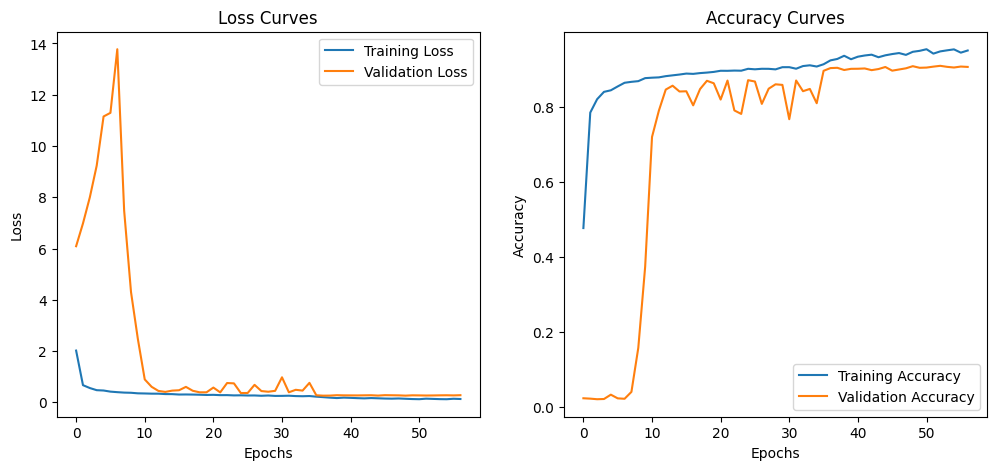

2/2 [==============================] - 1s 136ms/step - loss: 0.3264 - accuracy: 0.9062
Model Name:  model_6
Test Loss: 0.326
Test Accuracy: 0.906


In [ ]:
# 학습
model_path_model_ResNet50 = get_model_path(model_ResNet50.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_ResNet50.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_ResNet50 = model_ResNet50.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_ResNet50.save(model_path_model_ResNet50)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_ResNet50)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_ResNet50, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

#### 4. regularization 추가: **dropout**, l2 regularization

In [ ]:
# 모델 정의
with strategy.scope():
    input_tensor = Input(shape=(32, 32, 3))
    x = Resizing(224, 224, interpolation='bilinear')(input_tensor)  # Resize input images to 224x224x3
    #x = data_augmentation(x)

    # 첫번째 stage, convolution 수행, strides = 2 로 하여 크기를 반으로
    x = first_convolution(x)

    # 두번째 stage, pooling 을 적용하여 크기를 반으로 줄이고 첫번째 downsize block 에서는 strides = 1 로 함.
    x = first_pooling(x)
    x = downsize_block(x, (3, 3), (1, 1), (64, 64, 256), 2, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'c', use_leaky_relu=True)

    # 세번째 stage, block 의 수는 4개
    x = downsize_block(x, (3, 3), (2, 2), (128, 128, 512), 3, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'c', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'd', use_leaky_relu=True)

    # 네번째 stage, block 의 수는 6개
    x = downsize_block(x, (3, 3), (2, 2), (256, 256, 1024), 4, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'c', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'd', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'e', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'f', use_leaky_relu=True)

    # 다섯번째 stage, block 의 수는 3개
    x = downsize_block(x, (3, 3), (2, 2), (512, 512, 2048), 5, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'c', use_leaky_relu=True)

    # Global Average Pooling 으로 사이즈를 1x1x2048 로 만듦.
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)  # Dropout 추가
    output_tensor = Dense(num_classes, activation='softmax')(x)

    model_ResNet50 = Model(inputs=input_tensor, outputs=output_tensor)

    # 초기 학습률 설정
    initial_learning_rate = 0.0005
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_ResNet50.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_ResNet50.summary()


Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 resizing_7 (Resizing)          (None, 224, 224, 3)  0           ['input_9[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 112, 112, 64  9472        ['resizing_7[0][0]']             
                                )                                                                 
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 112, 112, 64  256         ['conv1[0][0]']            

Epoch 1/200
46/46 [==============================] - 117s 1s/step - loss: 2.0322 - accuracy: 0.4691 - val_loss: 6.9619 - val_accuracy: 0.0219 - lr: 5.0000e-04
Epoch 2/200
46/46 [==============================] - 20s 441ms/step - loss: 0.6929 - accuracy: 0.7794 - val_loss: 7.6325 - val_accuracy: 0.0203 - lr: 5.0000e-04
Epoch 3/200
46/46 [==============================] - 44s 969ms/step - loss: 0.5520 - accuracy: 0.8216 - val_loss: 6.8840 - val_accuracy: 0.0223 - lr: 5.0000e-04
Epoch 4/200
46/46 [==============================] - 20s 440ms/step - loss: 0.4927 - accuracy: 0.8341 - val_loss: 8.3935 - val_accuracy: 0.0238 - lr: 5.0000e-04
Epoch 5/200
46/46 [==============================] - 20s 446ms/step - loss: 0.4542 - accuracy: 0.8478 - val_loss: 12.2536 - val_accuracy: 0.0213 - lr: 5.0000e-04
Epoch 6/200
46/46 [==============================] - 21s 449ms/step - loss: 0.4132 - accuracy: 0.8537 - val_loss: 9.7098 - val_accuracy: 0.0209 - lr: 5.0000e-04
Epoch 7/200
46/46 [================

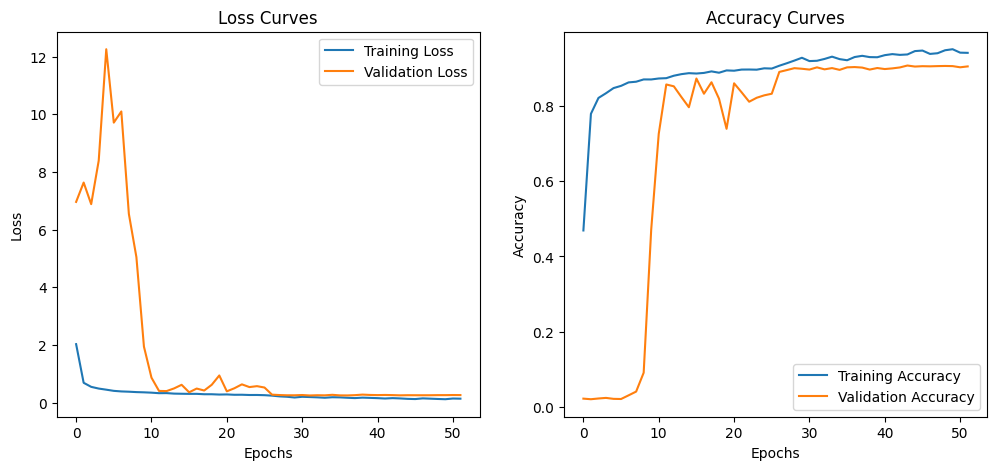

2/2 [==============================] - 1s 136ms/step - loss: 0.3080 - accuracy: 0.9043
Model Name:  model_7
Test Loss: 0.308
Test Accuracy: 0.904


In [ ]:
# 학습
model_path_model_ResNet50 = get_model_path(model_ResNet50.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_ResNet50.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_ResNet50 = model_ResNet50.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_ResNet50.save(model_path_model_ResNet50)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_ResNet50)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_ResNet50, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

#### 5. 데이터 증강(data augmentation)

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])

In [ ]:
# 모델 정의
with strategy.scope():
    input_tensor = Input(shape=(32, 32, 3))
    x = Resizing(224, 224, interpolation='bilinear')(input_tensor)  # Resize input images to 224x224x3
    x = data_augmentation(x)

    # 첫번째 stage, convolution 수행, strides = 2 로 하여 크기를 반으로
    x = first_convolution(x)

    # 두번째 stage, pooling 을 적용하여 크기를 반으로 줄이고 첫번째 downsize block 에서는 strides = 1 로 함.
    x = first_pooling(x)
    x = downsize_block(x, (3, 3), (1, 1), (64, 64, 256), 2, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'c', use_leaky_relu=True)

    # 세번째 stage, block 의 수는 4개
    x = downsize_block(x, (3, 3), (2, 2), (128, 128, 512), 3, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'c', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'd', use_leaky_relu=True)

    # 네번째 stage, block 의 수는 6개
    x = downsize_block(x, (3, 3), (2, 2), (256, 256, 1024), 4, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'c', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'd', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'e', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'f', use_leaky_relu=True)

    # 다섯번째 stage, block 의 수는 3개
    x = downsize_block(x, (3, 3), (2, 2), (512, 512, 2048), 5, 'a', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'b', use_leaky_relu=True)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'c', use_leaky_relu=True)

    # Global Average Pooling 으로 사이즈를 1x1x2048 로 만듦.
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)  # Dropout 추가
    output_tensor = Dense(num_classes, activation='softmax')(x)

    model_ResNet50 = Model(inputs=input_tensor, outputs=output_tensor)

    # 초기 학습률 설정
    initial_learning_rate = 0.0005
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_ResNet50.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_ResNet50.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 resizing_8 (Resizing)          (None, 224, 224, 3)  0           ['input_10[0][0]']               
                                                                                                  
 sequential (Sequential)        (None, 224, 224, 3)  0           ['resizing_8[0][0]']             
                                                                                                  
 conv1 (Conv2D)                 (None, 112, 112, 64  9472        ['sequential[0][0]']             
                                )                                                           

Epoch 1/200
46/46 [==============================] - 124s 1s/step - loss: 3.6461 - accuracy: 0.1392 - val_loss: 9.7772 - val_accuracy: 0.0217 - lr: 5.0000e-04
Epoch 2/200
46/46 [==============================] - 23s 494ms/step - loss: 2.0688 - accuracy: 0.3883 - val_loss: 16.9654 - val_accuracy: 0.0223 - lr: 5.0000e-04
Epoch 3/200
46/46 [==============================] - 23s 496ms/step - loss: 1.5171 - accuracy: 0.5393 - val_loss: 16.8752 - val_accuracy: 0.0227 - lr: 5.0000e-04
Epoch 4/200
46/46 [==============================] - 23s 496ms/step - loss: 1.2485 - accuracy: 0.6054 - val_loss: 9.9437 - val_accuracy: 0.0230 - lr: 5.0000e-04
Epoch 5/200
46/46 [==============================] - 23s 499ms/step - loss: 1.1422 - accuracy: 0.6383 - val_loss: 13.4724 - val_accuracy: 0.0217 - lr: 5.0000e-04
Epoch 6/200
46/46 [==============================] - 23s 500ms/step - loss: 1.0247 - accuracy: 0.6715 - val_loss: 10.2246 - val_accuracy: 0.0311 - lr: 5.0000e-04
Epoch 7/200
46/46 [=============

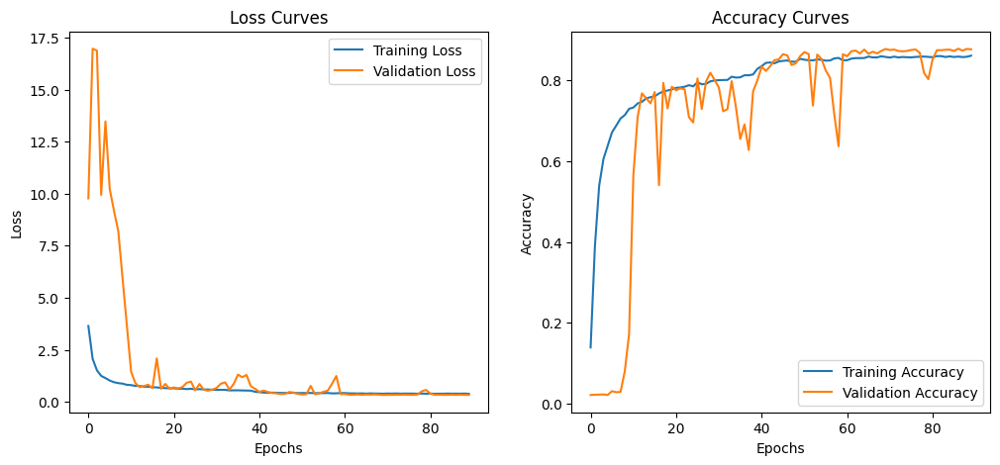

2/2 [==============================] - 1s 135ms/step - loss: 0.3741 - accuracy: 0.8838
Model Name:  model_8
Test Loss: 0.374
Test Accuracy: 0.884


In [ ]:
# 학습
model_path_model_ResNet50 = get_model_path(model_ResNet50.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_ResNet50.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_ResNet50 = model_ResNet50.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_ResNet50.save(model_path_model_ResNet50)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_ResNet50)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_ResNet50, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

#### 6. optimizer 변경: Adam -> SGD with momentum, RMSprop

#### 7. batchnormalization 추가

#### 8. 네트워크 깊이 및 폭 변경: resnet의 블록 수 변경, 각 블록의 필터 수 변경

### 9. 처음에 resize가 아니라 zero padding을 넣어야 tensorflow에서 제공하는 모델과 같아짐.
- 그냥 relu로 사용
- augmentation도 안함. (너무 오래 걸리는 거에 비해 성능 향상이 없음)

In [ ]:
from tensorflow.keras.layers import ZeroPadding2D

# 모델 정의
with strategy.scope():
    input_tensor = Input(shape=(32, 32, 3))
    x = ZeroPadding2D(padding=(3, 3))(input_tensor)  # Zero-padding to make 38x38
    #x = data_augmentation(x)

    # 첫번째 stage, convolution 수행, strides = 2 로 하여 크기를 반으로
    x = first_convolution(x)

    # 두번째 stage, pooling 을 적용하여 크기를 반으로 줄이고 첫번째 downsize block 에서는 strides = 1 로 함.
    x = first_pooling(x)
    x = downsize_block(x, (3, 3), (1, 1), (64, 64, 256), 2, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (64, 64, 256), 2, 'c', use_leaky_relu=False)

    # 세번째 stage, block 의 수는 4개
    x = downsize_block(x, (3, 3), (2, 2), (128, 128, 512), 3, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'c', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (128, 128, 512), 3, 'd', use_leaky_relu=False)

    # 네번째 stage, block 의 수는 6개
    x = downsize_block(x, (3, 3), (2, 2), (256, 256, 1024), 4, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'c', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'd', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'e', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (256, 256, 1024), 4, 'f', use_leaky_relu=False)

    # 다섯번째 stage, block 의 수는 3개
    x = downsize_block(x, (3, 3), (2, 2), (512, 512, 2048), 5, 'a', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'b', use_leaky_relu=False)
    x = residual_block(x, (3, 3), (512, 512, 2048), 5, 'c', use_leaky_relu=False)

    # Global Average Pooling 으로 사이즈를 1x1x2048 로 만듦.
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)  # Dropout 추가
    output_tensor = Dense(num_classes, activation='softmax')(x)

    model_ResNet50 = Model(inputs=input_tensor, outputs=output_tensor)

    # 초기 학습률 설정
    initial_learning_rate = 0.0005
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_ResNet50.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_ResNet50.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 38, 38, 3)   0           ['input_11[0][0]']               
                                                                                                  
 conv1 (Conv2D)                 (None, 19, 19, 64)   9472        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 19, 19, 64)   256         ['conv1[0][0]']                  
                                                                                            

# 이하 VGG16 모델 개선 과정

# 1) Prepare
## 1-1) import

In [ ]:
# Standard library imports
import os
import time

# Third-party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from tensorflow.python.client import device_lib
import seaborn as sns

# Keras imports
from keras.callbacks import EarlyStopping
from keras.layers import Activation, AveragePooling2D, Conv2D, Dense, Dropout, Flatten, Layer, Input
from keras.models import Sequential
from keras.utils import np_utils
import keras.backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

# Custom utilities (프로젝트 진행 시 계속 필요한 내용들을 따로 정의하여 불러옴.)
from distribution_utils import num_of_gpu, distribute_dataset, set_strategy
from datasets_utils import prepare_datasets, plot_class_examples, class_counts_plot
from train_and_test_utils import set_before_train, test_loss_and_accuracy, plot_learning_curves

## 1-2) multi-gpu

In [ ]:
num_gpus = num_of_gpu(num=4)

Number of GPUs: 4


## 1-3) datasets
- 대개 모델들의 default input size가 224\*224길래 우리도 그렇게 진행하고 나중에 경량화를 진행하려고 했으나, gpu 4개를 사용해서 분산학습을 하려고 해도 너무 큰 사이즈라 감당이 안되서 애초부터 32\*32로 진행하기로 결정함.

In [ ]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes = prepare_datasets('balanced', resize_shape=(32, 32))

X_train shape: (94000, 32, 32, 3)
X_valid shape: (18799, 32, 32, 3)
X_test shape: (18799, 32, 32, 3)
Number of label classes: 47


Image shape: (32, 32, 3)


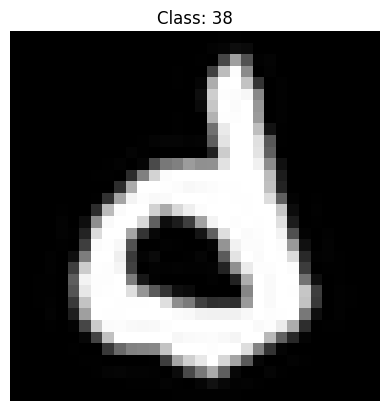

In [ ]:
import matplotlib.pyplot as plt

# Display one image from X_valid
def display_image(image, title=None):
    print(f"Image shape: {image.shape}")  # 이미지 크기 출력
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

# Display the first image in X_valid
display_image(X_valid[0], title=f"Class: {y_valid[0]}")

In [ ]:
y_train.shape

(94000,)

: 

## 1-4) distribution settings

In [ ]:
strategy = set_strategy()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


 Running on multiple GPUs  ['/device:GPU:0', '/device:GPU:1', '/device:GPU:2', '/device:GPU:3']


2024-05-29 13:26:47.121597: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-29 13:26:49.325664: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 205 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:21:00.0, compute capability: 8.6
2024-05-29 13:26:49.326771: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 201 MB memory:  -> device: 1, name: NVIDIA RTX A5000, pci bus id: 0000:22:00.0, compute capability: 8.6
2024-05-29 13:26:49.327740: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 201 MB memory:  -> device: 2, name: NVIDIA RTX A5000, pci bus id: 0000:23:00.0, compu

### batch_size

메모리 단편화는 메모리 사용 중에 발생하는 문제로, 메모리의 작은 조각들이 흩어져 있어 큰 연속적인 메모리 블록을 할당할 수 없는 상황을 말합니다. 메모리 단편화는 두 가지 형태로 나타날 수 있습니다: 내부 단편화와 외부 단편화.

### 내부 단편화
- 메모리 블록의 할당 요청보다 큰 블록이 할당될 때 발생합니다. 예를 들어, 1000바이트를 요청했는데 1024바이트 블록이 할당되면, 사용되지 않는 24바이트가 내부 단편화가 됩니다.

### 외부 단편화
- 메모리 블록들이 흩어져 있어 큰 연속적인 메모리 블록을 할당할 수 없는 상황입니다. 예를 들어, 메모리 전체 용량은 충분하지만, 할당된 블록들 사이에 작은 빈 공간들이 흩어져 있어 큰 블록을 할당할 수 없는 경우입니다.

### 메모리 단편화 줄이기
메모리 단편화를 줄이기 위해 다음과 같은 방법들을 사용할 수 있습니다:

1. **적응형 메모리 할당기 사용**:
   - TensorFlow에서는 `cuda_malloc_async`와 같은 적응형 메모리 할당기를 사용할 수 있습니다. 이는 메모리 할당과 해제를 더 효율적으로 처리하여 단편화를 줄이는 데 도움이 됩니다.

   ```python
   import os
   os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'
   ```

2. **메모리 재사용**:
   - 모델 훈련 중에 사용하지 않는 메모리를 재사용하여 단편화를 줄일 수 있습니다.

3. **메모리 초기화**:
   - 훈련 세션 전후에 GPU 메모리를 초기화하여 단편화를 줄일 수 있습니다.

   ```python
   import tensorflow as tf

   # GPU 메모리 초기화
   tf.keras.backend.clear_session()
   ```

4. **메모리 압축 및 통합**:
   - 가능한 경우 메모리를 압축하여 연속적인 큰 메모리 블록을 확보할 수 있습니다. 이는 메모리 할당기를 개선하여 메모리 블록들을 더 효율적으로 관리하는 것을 의미합니다.

5. **배치 크기 및 모델 구조 조정**:
   - 배치 크기를 줄이거나 모델의 복잡도를 줄여 메모리 사용량을 줄일 수 있습니다. 이는 메모리 단편화를 완화하는 데 도움이 됩니다.

### 요약
메모리 단편화는 메모리 블록들이 흩어져 있어 큰 연속적인 메모리 블록을 할당할 수 없는 상황입니다. 이를 줄이기 위해 적응형 메모리 할당기를 사용하거나 메모리 초기화 및 재사용 전략을 사용할 수 있습니다. 배치 크기와 모델 구조를 조정하는 것도 메모리 사용을 최적화하는 데 도움이 됩니다.

In [ ]:
# 훈련 전 GPU 메모리 클리어링
tf.keras.backend.clear_session()

# 메모리 단편화를 줄이고 큰 메모리 할당 문제를 완화할 수 있음.
os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'

In [ ]:
batch_size = 64
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset = distribute_dataset(batch_size, num_gpus, strategy,
                                                                                X_train, y_train,
                                                                                X_valid, y_valid,
                                                                                X_test, y_test)

2024-05-29 13:28:33.698703: W tensorflow/core/common_runtime/bfc_allocator.cc:462] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.08GiB (rounded to 1155072000)requested by op _EagerConst
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2024-05-29 13:28:33.698766: I tensorflow/core/common_runtime/bfc_allocator.cc:1010] BFCAllocator dump for GPU_0_bfc
2024-05-29 13:28:33.698789: I tensorflow/core/common_runtime/bfc_allocator.cc:1017] Bin (256): 	Total Chunks: 1, Chunks in use: 1. 256B allocated for chunks. 256B in use in bin. 4B client-requested in use in bin.
2024-05-29 13:28:33.698806: I tensorflow/core/common_runtime/bfc_allocator.cc:1017] Bin (512): 	Total Chunks: 0, Chunks in use: 0. 0B allocated for chunks. 0B in use in bin. 0B client-requested in use in bin.
2024-05-29 13:28:33.698824: I tensorflow/core/common_ru

InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.

# 2) Train VGG-16
- [Very Deep Convolutional Networks for Large-Scale Image Recognition](https://arxiv.org/abs/1409.1556) (ICLR 2015)

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/a0bafe2f-6d88-4f60-b4a1-f44aa0c6268b)

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/bac9f969-27f4-4e43-a77f-761f9f82fff4)

- VGG-16은 모든 컨볼루션 레이어에서 3x3 필터를 사용하고, 층을 깊게 쌓아 높은 표현력을 유지.

- EMNIST 데이터셋에서는 다각도 추출보다는 높은 정확도가 중요하므로, 깊은 네트워크 구조를 통해 높은 정확도를 달성할 수 있음.

In [ ]:
def get_model_path(model_name):
    model_path = "trained_models/" + model_name + ".h5"
    return model_path

In [ ]:
with strategy.scope():
    model_VGG16 = tf.keras.applications.VGG16(include_top=True,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                pooling='max',
                                                classes=num_classes,
                                                classifier_activation=None)

    # 초기 학습률 설정
    initial_learning_rate = 0.001
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    model_VGG16.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])

model_VGG16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0     

In [ ]:
# 학습
model_path_model_VGG16 = get_model_path(model_VGG16.name)
early_stopping, model_checkpoint_cb = set_before_train(50, model_VGG16.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_VGG16 = model_VGG16.fit(train_dist_dataset, 
                               epochs=500, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_VGG16.save(model_path_model_VGG16)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_VGG16)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_VGG16, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

Epoch 1/500
INFO:tensorflow:batch_all_reduce: 32 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 32 all-reduces with algorithm = nccl, num_packs = 1
1469/1469 [==============================] - 82s 51ms/step - loss: 3.8823 - accuracy: 0.0219 - val_loss: 3.8501 - val_accuracy: 0.0208 - lr: 0.0010
Epoch 2/500
1469/1469 [==============================] - 70s 47ms/step - loss: 3.8501 - accuracy: 0.0224 - val_loss: 3.8501 - val_accuracy: 0.0208 - lr: 0.0010
Epoch 3/500
1469/1469 [==============================] - 69s 47ms/step - loss: 3.8501 - accuracy: 0.0207 - val_loss: 3.8501 - val_accuracy: 0.0200 - lr: 0.0010
Epoch 4/500
1469/1469 [==============================] - 69s 47ms/step - loss: 3.8501 - accuracy: 0.0202 - val_loss: 3.8501 - val_accuracy: 0.0217 - lr: 0.0010
Epoch 5/500
 451/1469 [========>.....................] - ETA: 45s - loss: 3.8501 - accuracy: 0.0208

KeyboardInterrupt: 

: 

### VGG-16 학습 중 문제 발생
- loss가 수렴하지 않고, accuracy가 상승하지 않는 문제가 발생.
    - 배치 사이즈가 너무 커서 loss가 안줄어드나? ---> 2048에서 128까지 실험해보았지만 비슷한 결과.
    - initial_learning_rate를 0.0005로 줄인게 영향이 컸나? --> initial_learning_rate를 다시 default=0.001로 복구해도 비슷함.

- 상위층에서 4096으로 너무 키우기 때문에 정보가 분산되어서 loss가 줄어들지 않는다는 것을 발견함.
- 논문에서 input size를 224\*224로 사용하는데, 인풋 사이즈와 비교해서 왜 최상위 층에서 1000개의 이미지넷 클래스로 분류하기 전에 4096이라는 뉴런 수로 키웠는지 명확한 설명이 없음.
- 우리가 32\*32 인풋을 사용하는데, 인풋에 비해 너무 키워서 발생하는 문제라고 가정함.
- 그래서 그 적정선에 대한 실험을 진행함.

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/0a75cecf-6827-48c6-b577-8abd717afa1b)

1. `include_top=True`를 사용하는 경우 VGG16 모델은 32x32 이미지 입력에 적합하지 않기 때문에 문제 발생.

    - 일반적으로 VGG16 모델은 224x224 크기의 이미지를 기대하기 때문.

    - `pooling='max'`는 `include_top=True`와 함께 사용할 필요 없음.

2. ResNet 모델은 다양한 입력 이미지 크기를 처리할 수 있도록 설계되었습니다. 이는 ResNet의 구조가 더 깊고, 잔차 연결(residual connections)을 통해 정보 손실을 줄이고, 더 효과적으로 학습할 수 있게 하기 때문입니다. 반면, VGG 모델은 원래 224x224 크기의 이미지를 처리하도록 설계되었습니다.

3. VGG16 vs. ResNet50
    1. VGG16
        1. Dense 레이어의 고정된 크기:

            - VGG 네트워크의 최상단에는 고정된 크기의 Dense 레이어(예: 4096 노드)가 있습니다. 이러한 레이어는 입력 크기가 줄어들 경우 너무 많은 파라미터를 포함하게 되어 과적합(overfitting)의 위험이 높아집니다.

            - Dense 레이어는 입력 크기가 작아질수록 비효율적이 됩니다. 예를 들어, 32x32 크기의 이미지를 224x224 크기로 리사이즈하지 않는다면, VGG의 Dense 레이어는 너무 많은 파라미터를 학습하게 됩니다.

        2. 풀링 레이어의 사용:

            - VGG 네트워크는 여러 Max Pooling 레이어를 사용하여 특성 맵의 크기를 줄입니다. 이 과정에서 정보 손실이 발생할 수 있으며, 특히 작은 입력 크기에서는 더 두드러집니다.

    2. ResNet50
        1. Global Average Pooling:

            - ResNet 모델은 일반적으로 최종 분류 레이어 전에 Global Average Pooling 레이어를 사용합니다. 이 레이어는 입력 크기에 관계없이 각 채널에 대해 평균값을 계산하여 고정된 크기의 출력을 생성합니다. 이는 입력 이미지 크기에 대한 유연성을 제공합니다.

        2. Residual Connections:

            - Residual connections는 네트워크의 각 층이 이전 층의 출력을 더 쉽게 학습할 수 있도록 합니다. 이는 특히 깊은 네트워크에서 중요한데, 입력 크기에 상관없이 학습 안정성을 높입니다.

### 시도 1) 4096 --> 2048

In [ ]:
with strategy.scope():
    model_VGG16 = tf.keras.applications.VGG16(include_top=False,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                classes=num_classes,
                                                classifier_activation=None)

    # 최상위 층 추가
    x = model_VGG16.output
    x = Flatten()(x)
    x = Dense(2048, activation='relu')(x)
    x = Dense(2048, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)

    # 모델 정의
    model_VGG16 = Model(inputs=model_VGG16.input, outputs=x)

    # 초기 학습률 설정
    initial_learning_rate = 0.0005
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_VGG16.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_VGG16.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0   

Epoch 1/200
INFO:tensorflow:batch_all_reduce: 32 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 32 all-reduces with algorithm = nccl, num_packs = 1
92/92 [==============================] - 15s 86ms/step - loss: 3.8504 - accuracy: 0.0201 - val_loss: 3.8499 - val_accuracy: 0.0218 - lr: 5.0000e-04
Epoch 2/200
92/92 [==============================] - 4s 44ms/step - loss: 3.8504 - accuracy: 0.0217 - val_loss: 3.8500 - val_accuracy: 0.0216 - lr: 5.0000e-04
Epoch 3/200
92/92 [==============================] - 4s 44ms/step - loss: 3.8503 - accuracy: 0.0188 - val_loss: 3.8501 - val_accuracy: 0.0232 - lr: 5.0000e-04
Epoch 4/200
92/92 [==============================] - 4s 44ms/step - loss: 3.8503 - accuracy: 0.0183 - val_loss: 3.8502 - val_accuracy: 0.0218 - lr: 5.0000e-04
Epoch 5/200
92/92 [==============================] - 4s 44ms/step - loss: 3.8503 - accuracy: 0.0207 - val_loss: 3.8501 - val_accuracy: 0.0214 - lr: 5.0000e-04
Epoch 6/200
92/92 [=============

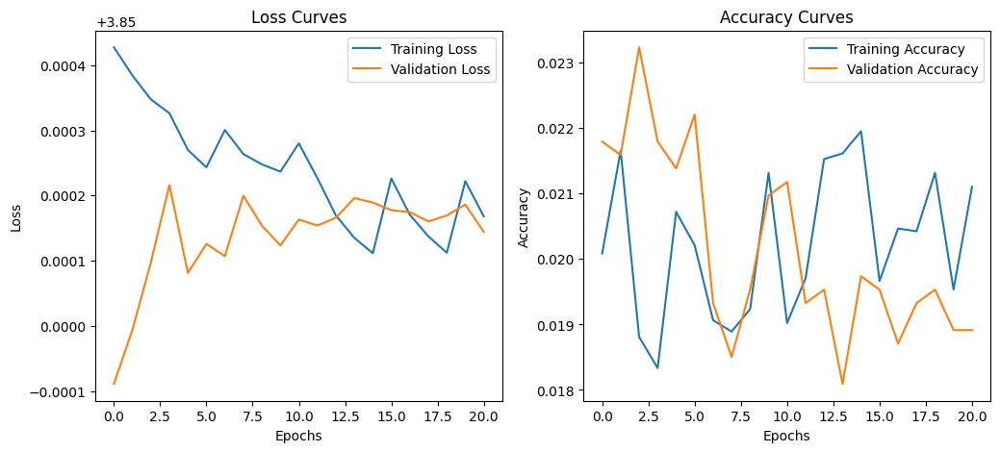

4/4 [==============================] - 0s 13ms/step - loss: 3.8501 - accuracy: 0.0176
Model Name:  model_2
Test Loss: 3.850
Test Accuracy: 0.018


In [ ]:
# 학습
model_path_model_VGG16 = get_model_path(model_VGG16.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_VGG16.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_VGG16 = model_VGG16.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_VGG16.save(model_path_model_VGG16)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_VGG16)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_VGG16, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### 시도 2) 2048 --> 1024

In [ ]:
with strategy.scope():
    model_VGG16 = tf.keras.applications.VGG16(include_top=False,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                classes=num_classes,
                                                classifier_activation=None)

    # 최상위 층 추가
    x = model_VGG16.output
    x = Flatten()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dense(1024, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)

    # 모델 정의
    model_VGG16 = Model(inputs=model_VGG16.input, outputs=x)

    # 초기 학습률 설정
    initial_learning_rate = 0.0005
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_VGG16.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_VGG16.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0   

Epoch 1/200
92/92 [==============================] - 15s 89ms/step - loss: 3.8510 - accuracy: 0.0197 - val_loss: 3.8500 - val_accuracy: 0.0224 - lr: 5.0000e-04
Epoch 2/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8504 - accuracy: 0.0217 - val_loss: 3.8501 - val_accuracy: 0.0212 - lr: 5.0000e-04
Epoch 3/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8504 - accuracy: 0.0189 - val_loss: 3.8501 - val_accuracy: 0.0193 - lr: 5.0000e-04
Epoch 4/200
92/92 [==============================] - 4s 42ms/step - loss: 3.8503 - accuracy: 0.0188 - val_loss: 3.8502 - val_accuracy: 0.0191 - lr: 5.0000e-04
Epoch 5/200
92/92 [==============================] - 4s 42ms/step - loss: 3.8503 - accuracy: 0.0191 - val_loss: 3.8500 - val_accuracy: 0.0251 - lr: 5.0000e-04
Epoch 6/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8503 - accuracy: 0.0195 - val_loss: 3.8500 - val_accuracy: 0.0218 - lr: 5.0000e-04
Epoch 7/200
92/92 [==========================

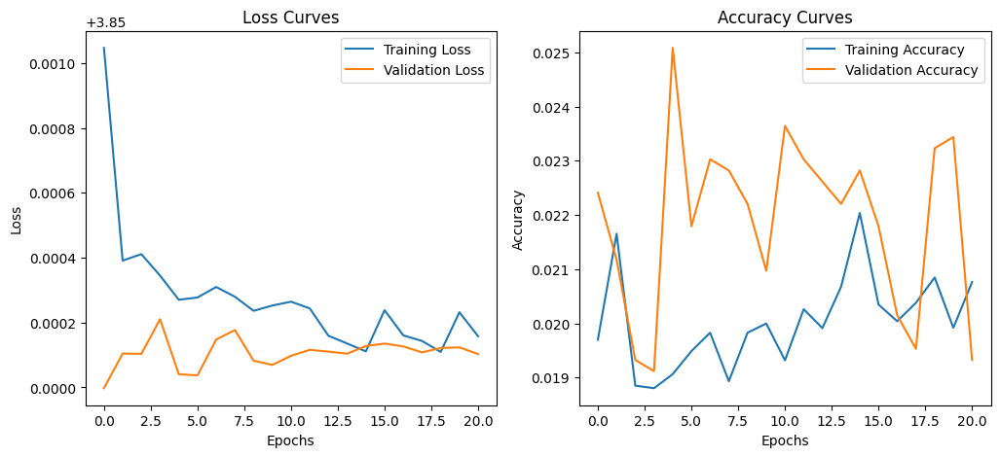

4/4 [==============================] - 0s 12ms/step - loss: 3.8502 - accuracy: 0.0176
Model Name:  model_3
Test Loss: 3.850
Test Accuracy: 0.018


In [ ]:
# 학습
model_path_model_VGG16 = get_model_path(model_VGG16.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_VGG16.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_VGG16 = model_VGG16.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_VGG16.save(model_path_model_VGG16)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_VGG16)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_VGG16, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### 시도 3) 1024 --> 512

In [ ]:
with strategy.scope():
    model_VGG16 = tf.keras.applications.VGG16(include_top=False,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                classes=num_classes,
                                                classifier_activation=None)

    # 최상위 층 추가
    x = model_VGG16.output
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    x = Dense(512, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)

    # 모델 정의
    model_VGG16 = Model(inputs=model_VGG16.input, outputs=x)

    # 초기 학습률 설정
    initial_learning_rate = 0.0005
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_VGG16.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_VGG16.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0   

Epoch 1/200
92/92 [==============================] - 15s 90ms/step - loss: 3.8503 - accuracy: 0.0204 - val_loss: 3.8501 - val_accuracy: 0.0214 - lr: 5.0000e-04
Epoch 2/200
92/92 [==============================] - 6s 64ms/step - loss: 3.8571 - accuracy: 0.0208 - val_loss: 3.8485 - val_accuracy: 0.0210 - lr: 5.0000e-04
Epoch 3/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8492 - accuracy: 0.0193 - val_loss: 3.8501 - val_accuracy: 0.0230 - lr: 5.0000e-04
Epoch 4/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8504 - accuracy: 0.0188 - val_loss: 3.8502 - val_accuracy: 0.0210 - lr: 5.0000e-04
Epoch 5/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8503 - accuracy: 0.0209 - val_loss: 3.8501 - val_accuracy: 0.0236 - lr: 5.0000e-04
Epoch 6/200
92/92 [==============================] - 4s 42ms/step - loss: 3.8503 - accuracy: 0.0208 - val_loss: 3.8500 - val_accuracy: 0.0238 - lr: 5.0000e-04
Epoch 7/200
92/92 [==========================

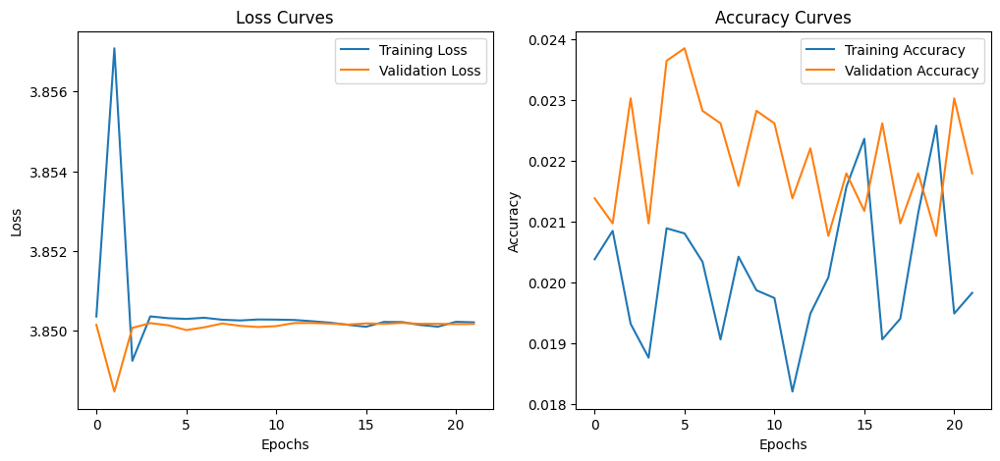

4/4 [==============================] - 0s 13ms/step - loss: 3.8501 - accuracy: 0.0293
Model Name:  model_4
Test Loss: 3.850
Test Accuracy: 0.029


In [ ]:
# 학습
model_path_model_VGG16 = get_model_path(model_VGG16.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_VGG16.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_VGG16 = model_VGG16.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_VGG16.save(model_path_model_VGG16)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_VGG16)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_VGG16, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### 시도 4) 512, default initial_learning_rate

In [ ]:
with strategy.scope():
    model_VGG16 = tf.keras.applications.VGG16(include_top=False,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                classes=num_classes,
                                                classifier_activation=None)

    # 최상위 층 추가
    x = model_VGG16.output
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    x = Dense(512, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)

    # 모델 정의
    model_VGG16 = Model(inputs=model_VGG16.input, outputs=x)

    # 초기 학습률 설정
    initial_learning_rate = 0.001
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_VGG16.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_VGG16.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0   

Epoch 1/200
92/92 [==============================] - 15s 81ms/step - loss: 3.8506 - accuracy: 0.0206 - val_loss: 3.8499 - val_accuracy: 0.0224 - lr: 0.0010
Epoch 2/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8505 - accuracy: 0.0204 - val_loss: 3.8501 - val_accuracy: 0.0218 - lr: 0.0010
Epoch 3/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8504 - accuracy: 0.0187 - val_loss: 3.8501 - val_accuracy: 0.0181 - lr: 0.0010
Epoch 4/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8504 - accuracy: 0.0197 - val_loss: 3.8503 - val_accuracy: 0.0212 - lr: 0.0010
Epoch 5/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8503 - accuracy: 0.0193 - val_loss: 3.8500 - val_accuracy: 0.0220 - lr: 0.0010
Epoch 6/200
92/92 [==============================] - 4s 41ms/step - loss: 3.8503 - accuracy: 0.0197 - val_loss: 3.8500 - val_accuracy: 0.0216 - lr: 0.0010
Epoch 7/200
92/92 [==============================] - 4s 41ms/step - l

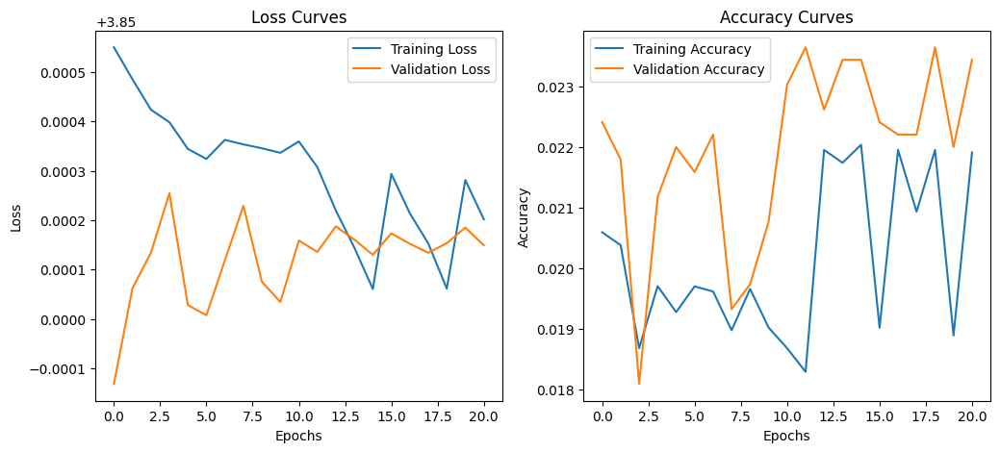

4/4 [==============================] - 0s 13ms/step - loss: 3.8502 - accuracy: 0.0205
Model Name:  model_5
Test Loss: 3.850
Test Accuracy: 0.021


In [ ]:
# 학습
model_path_model_VGG16 = get_model_path(model_VGG16.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_VGG16.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_VGG16 = model_VGG16.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_VGG16.save(model_path_model_VGG16)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_VGG16)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_VGG16, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### 시도 5) batch_size: 1024 --> 256

In [ ]:
batch_size = 256
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset = distribute_dataset(batch_size, num_gpus, strategy,
                                                                                X_train, y_train,
                                                                                X_valid, y_valid,
                                                                                X_test, y_test)

In [ ]:
with strategy.scope():
    model_VGG16 = tf.keras.applications.VGG16(include_top=False,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                classes=num_classes,
                                                classifier_activation=None)

    # 최상위 층 추가
    x = model_VGG16.output
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    x = Dense(512, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)

    # 모델 정의
    model_VGG16 = Model(inputs=model_VGG16.input, outputs=x)

    # 초기 학습률 설정
    initial_learning_rate = 0.001
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_VGG16.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_VGG16.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0   

Epoch 1/200
368/368 [==============================] - 25s 48ms/step - loss: 3.8506 - accuracy: 0.0213 - val_loss: 3.8501 - val_accuracy: 0.0188 - lr: 0.0010
Epoch 2/200
368/368 [==============================] - 14s 38ms/step - loss: 3.8505 - accuracy: 0.0214 - val_loss: 3.8501 - val_accuracy: 0.0220 - lr: 0.0010
Epoch 3/200
368/368 [==============================] - 14s 38ms/step - loss: 3.8506 - accuracy: 0.0202 - val_loss: 3.8502 - val_accuracy: 0.0228 - lr: 0.0010
Epoch 4/200
368/368 [==============================] - 14s 37ms/step - loss: 3.8506 - accuracy: 0.0197 - val_loss: 3.8503 - val_accuracy: 0.0211 - lr: 0.0010
Epoch 5/200
368/368 [==============================] - 16s 44ms/step - loss: 3.8505 - accuracy: 0.0191 - val_loss: 3.8500 - val_accuracy: 0.0211 - lr: 0.0010
Epoch 6/200
368/368 [==============================] - 14s 38ms/step - loss: 3.8505 - accuracy: 0.0207 - val_loss: 3.8501 - val_accuracy: 0.0217 - lr: 0.0010
Epoch 7/200
368/368 [==============================]

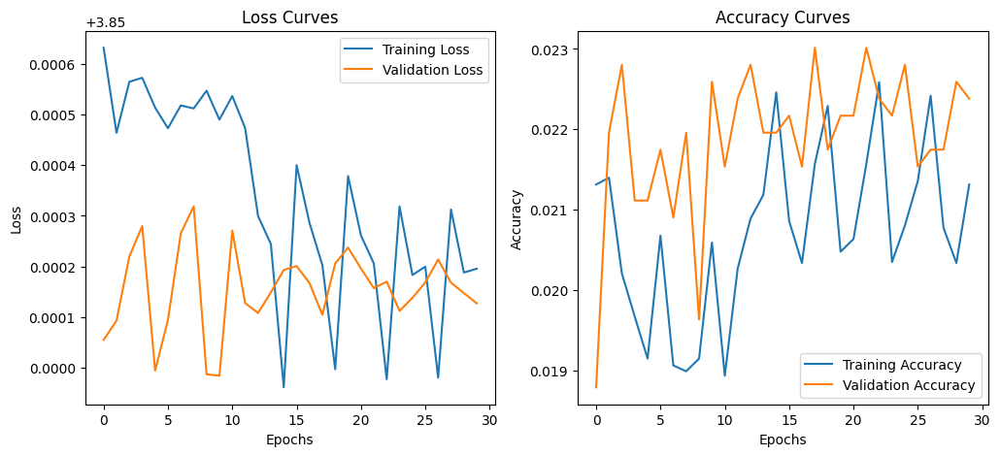

18/18 [==============================] - 0s 13ms/step - loss: 3.8503 - accuracy: 0.0182
Model Name:  model_6
Test Loss: 3.850
Test Accuracy: 0.018


In [ ]:
# 학습
model_path_model_VGG16 = get_model_path(model_VGG16.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_VGG16.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_VGG16 = model_VGG16.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_VGG16.save(model_path_model_VGG16)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_VGG16)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_VGG16, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### 시도 6) 원래 구조를 유지하나, 4096 레이어 다음에 Dropout을 추가.

In [ ]:
with strategy.scope():
    base_model = tf.keras.applications.VGG16(include_top=False,
                                             weights=None,
                                             input_shape=(32, 32, 3),
                                             classes=num_classes)
    
    x = base_model.output

    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    predictions = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
    model_VGG16 = tf.keras.models.Model(inputs=base_model.input, outputs=predictions)

    # 초기 학습률 설정
    initial_learning_rate = 0.001
    model_VGG16.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])
model_VGG16.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0   

In [ ]:
# 학습
model_path_model_VGG16 = get_model_path(model_VGG16.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_VGG16.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_VGG16 = model_VGG16.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_VGG16.save(model_path_model_VGG16)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_VGG16)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_VGG16, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### 시도 7) 원래 구조에서 4096 2개 레이어를 512 하나로 바꾸고 dropout도 하나 넣음.

In [ ]:
with strategy.scope():
    base_model_VGG16 = tf.keras.applications.VGG16(include_top=False,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                classes=num_classes)

    x = base_model_VGG16.output
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    predictions = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
    model_VGG16 = tf.keras.models.Model(inputs=base_model_VGG16.input, outputs=predictions)
    
    # 초기 학습률 설정
    initial_learning_rate = 0.001
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    model_VGG16.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])

model_VGG16.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 8, 8, 128)         0   

Epoch 1/200
INFO:tensorflow:batch_all_reduce: 30 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 30 all-reduces with algorithm = nccl, num_packs = 1
184/184 [==============================] - 18s 65ms/step - loss: 3.8506 - accuracy: 0.0207 - val_loss: 3.8500 - val_accuracy: 0.0201 - lr: 0.0010
Epoch 2/200
184/184 [==============================] - 7s 39ms/step - loss: 3.8506 - accuracy: 0.0218 - val_loss: 3.8501 - val_accuracy: 0.0211 - lr: 0.0010
Epoch 3/200
184/184 [==============================] - 7s 40ms/step - loss: 3.8506 - accuracy: 0.0205 - val_loss: 3.8503 - val_accuracy: 0.0198 - lr: 0.0010
Epoch 4/200
184/184 [==============================] - 7s 40ms/step - loss: 3.8505 - accuracy: 0.0193 - val_loss: 3.8504 - val_accuracy: 0.0213 - lr: 0.0010
Epoch 5/200
184/184 [==============================] - 7s 40ms/step - loss: 3.8505 - accuracy: 0.0192 - val_loss: 3.8500 - val_accuracy: 0.0198 - lr: 0.0010
Epoch 6/200
184/184 [=====================

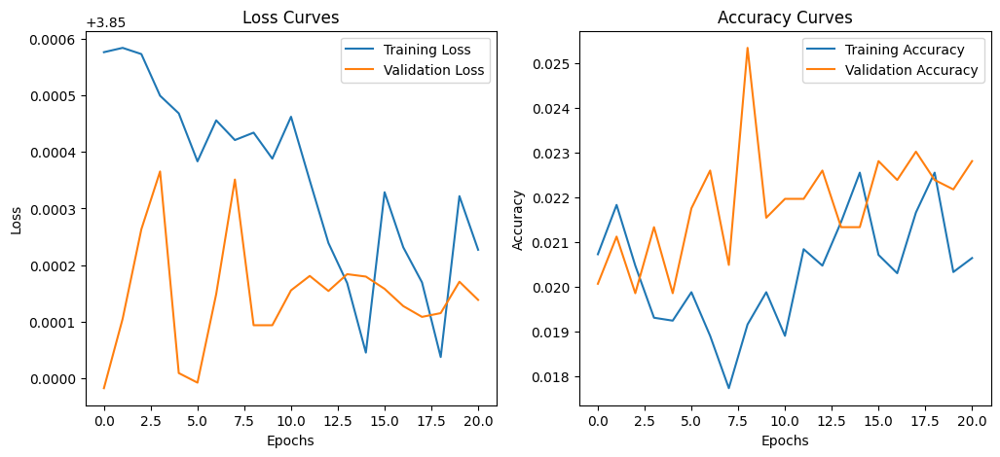

9/9 [==============================] - 0s 12ms/step - loss: 3.8502 - accuracy: 0.0182
Model Name:  model_3
Test Loss: 3.850
Test Accuracy: 0.018


In [ ]:
# 학습
model_path_model_VGG16 = get_model_path(model_VGG16.name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_VGG16.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_VGG16 = model_VGG16.fit(train_dist_dataset, 
                               epochs=200, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_VGG16.save(model_path_model_VGG16)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_VGG16)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_VGG16, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

# 이하 MobileNet 개선 과정

# 1) Prepare
## 1-1) import

In [ ]:
# Standard library imports
import os
import time

# Third-party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from tensorflow.python.client import device_lib
import seaborn as sns

# Keras imports
from keras.callbacks import EarlyStopping
from keras.layers import Activation, AveragePooling2D, Conv2D, Dense, Dropout, Flatten, Layer, Input
from keras.models import Sequential
from keras.utils import np_utils
import keras.backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

# Custom utilities (프로젝트 진행 시 계속 필요한 내용들을 따로 정의하여 불러옴.)
from distribution_utils import num_of_gpu, distribute_dataset, set_strategy
from datasets_utils import prepare_datasets, plot_class_examples, class_counts_plot
from train_and_test_utils import set_before_train, test_loss_and_accuracy, plot_learning_curves

## 1-2) multi-gpu

In [ ]:
num_gpus = num_of_gpu(num=4)

Number of GPUs: 4


## 1-3) datasets
- 대개 모델들의 default input size가 224\*224길래 우리도 그렇게 진행하고 나중에 경량화를 진행하려고 했으나, gpu 4개를 사용해서 분산학습을 하려고 해도 너무 큰 사이즈라 감당이 안되서 애초부터 32\*32로 진행하기로 결정함.

In [ ]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes = prepare_datasets('balanced', resize_shape=(32, 32))

X_train shape: (94000, 32, 32, 3)
X_valid shape: (18799, 32, 32, 3)
X_test shape: (18799, 32, 32, 3)
Number of label classes: 47


## 1-4) distribution settings

In [ ]:
strategy = set_strategy()

2024-05-28 12:13:45.727203: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-28 12:13:47.988157: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 22346 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:21:00.0, compute capability: 8.6
2024-05-28 12:13:47.989951: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 22346 MB memory:  -> device: 1, name: NVIDIA RTX A5000, pci bus id: 0000:22:00.0, compute capability: 8.6
2024-05-28 12:13:47.991518: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 22346 MB memory:  -> device: 2, name: NVIDIA RTX A5000, pci bus id: 0000:23:00.0,

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


 Running on multiple GPUs  ['/device:GPU:0', '/device:GPU:1', '/device:GPU:2', '/device:GPU:3']


### batch_size

In [ ]:
# 훈련 전 GPU 메모리 클리어링
tf.keras.backend.clear_session()

# 메모리 단편화를 줄이고 큰 메모리 할당 문제를 완화할 수 있음.
os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'

In [ ]:
batch_size = 1024
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset = distribute_dataset(batch_size, num_gpus, strategy,
                                                                                X_train, y_train,
                                                                                X_valid, y_valid,
                                                                                X_test, y_test)

# 2) Train MobileNet

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/cf9fc373-5096-4b77-9f4e-6ddbbc2e2078)

- Depth-wise와 Point-wise 컨볼루션을 사용하여 매개변수와 연산 요구량을 크게 줄임.

- EMNIST 데이터셋에 많은 매개변수를 가진 모델을 적용하는 것이 비효율적이므로, 경량화된 모델이 적합함.

## 2-1) Default Settings
- batch_size: 1024

- `tf.keras.applications.MobileNet`

- Early Stopping: 20 epochs 동안 val_accuracy 안오르면 stop. 최대 200 epochs

- initial_learning_rate: 0.0005

- `lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-6)`

- optimizer: Adam

- loss: sparse_categorical_crossentropy

In [ ]:
def get_model_path(model_name):
    model_path = "trained_models/" + model_name + ".h5"
    return model_path

In [ ]:
with strategy.scope():
    model_MobileNet = tf.keras.applications.MobileNet(include_top=True,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                classes=num_classes,
                                                classifier_activation=None)

    # 초기 학습률 설정
    initial_learning_rate = 0.001
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_MobileNet.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_MobileNet.summary()

Model: "mobilenet_1.00_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv1 (Conv2D)              (None, 16, 16, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 16, 16, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 16, 16, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 16, 16, 32)       288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 16, 16, 32)       128       
 ation)                                          

Epoch 1/500
INFO:tensorflow:batch_all_reduce: 83 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 83 all-reduces with algorithm = nccl, num_packs = 1
92/92 [==============================] - 50s 217ms/step - loss: 12.0565 - accuracy: 0.0263 - val_loss: 10.2433 - val_accuracy: 0.0216 - lr: 0.0010
Epoch 2/500
92/92 [==============================] - 16s 172ms/step - loss: 10.3708 - accuracy: 0.0298 - val_loss: 9.5389 - val_accuracy: 0.0228 - lr: 0.0010
Epoch 3/500
92/92 [==============================] - 15s 162ms/step - loss: 9.7442 - accuracy: 0.0289 - val_loss: 9.4546 - val_accuracy: 0.0208 - lr: 0.0010
Epoch 4/500
92/92 [==============================] - 16s 176ms/step - loss: 9.6204 - accuracy: 0.0274 - val_loss: 9.4510 - val_accuracy: 0.0220 - lr: 0.0010
Epoch 5/500
92/92 [==============================] - 5s 58ms/step - loss: 9.6431 - accuracy: 0.0275 - val_loss: 9.5007 - val_accuracy: 0.0206 - lr: 0.0010
Epoch 6/500
92/92 [=======================

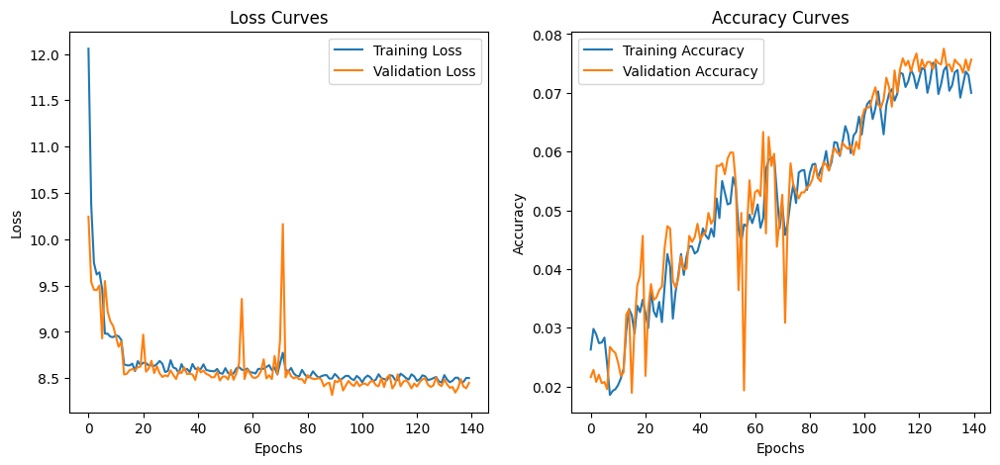

4/4 [==============================] - 0s 13ms/step - loss: 8.2687 - accuracy: 0.0684
Model Name:  mobilenet_1.00_32
Test Loss: 8.269
Test Accuracy: 0.068


In [ ]:
# 학습
model_path_model_EfficientNetB1 = get_model_path(model_MobileNet.name)
early_stopping, model_checkpoint_cb = set_before_train(50, model_MobileNet.name)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=25,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_MobileNet = model_MobileNet.fit(train_dist_dataset, 
                               epochs=500, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler])
    end_time = time.time()

model_MobileNet.save(model_path_model_EfficientNetB1)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_MobileNet)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_MobileNet, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### learning_rate_scheduler 없이 고정으로

In [ ]:
with strategy.scope():
    model_MobileNet = tf.keras.applications.MobileNet(include_top=True,
                                                weights=None,
                                                input_shape=(32, 32, 3),
                                                classes=num_classes,
                                                classifier_activation=None)

    # 초기 학습률 설정
    initial_learning_rate = 0.01
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    with strategy.scope():
        model_MobileNet.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])

model_MobileNet.summary()

Model: "mobilenet_1.00_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv1 (Conv2D)              (None, 16, 16, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 16, 16, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 16, 16, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 16, 16, 32)       288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 16, 16, 32)       128       
 ation)                                          

Epoch 1/500
INFO:tensorflow:batch_all_reduce: 83 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 83 all-reduces with algorithm = nccl, num_packs = 1
92/92 [==============================] - 38s 90ms/step - loss: 15.5524 - accuracy: 0.0274 - val_loss: 15.8033 - val_accuracy: 0.0195
Epoch 2/500
92/92 [==============================] - 5s 58ms/step - loss: 15.7662 - accuracy: 0.0212 - val_loss: 15.7934 - val_accuracy: 0.0201
Epoch 3/500
92/92 [==============================] - 5s 59ms/step - loss: 15.7882 - accuracy: 0.0205 - val_loss: 15.7635 - val_accuracy: 0.0220
Epoch 4/500
92/92 [==============================] - 5s 57ms/step - loss: 15.7604 - accuracy: 0.0222 - val_loss: 15.7867 - val_accuracy: 0.0206
Epoch 5/500
92/92 [==============================] - 5s 57ms/step - loss: 15.7814 - accuracy: 0.0209 - val_loss: 15.8033 - val_accuracy: 0.0195
Epoch 6/500
92/92 [==============================] - 5s 56ms/step - loss: 15.7684 - accuracy: 0.0217 - val_

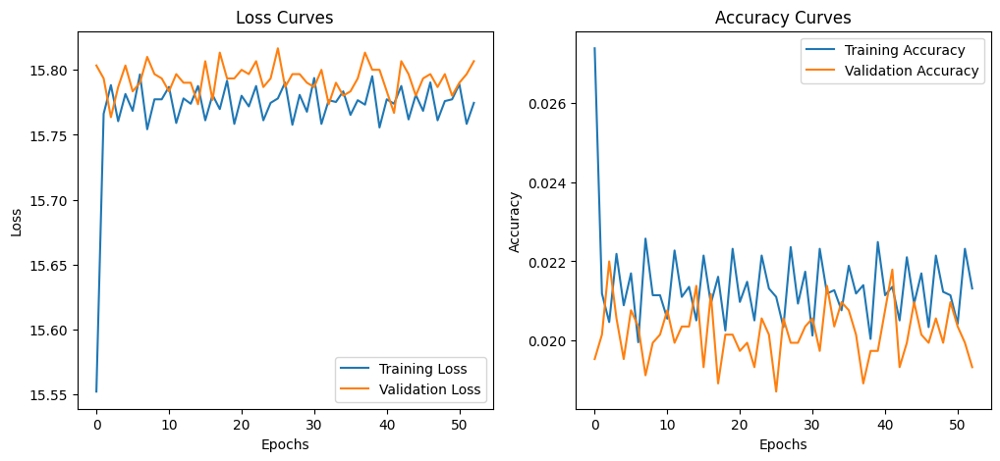

4/4 [==============================] - 0s 16ms/step - loss: 15.6774 - accuracy: 0.0273
Model Name:  mobilenet_1.00_32
Test Loss: 15.677
Test Accuracy: 0.027


In [ ]:
with strategy.scope():
    start_time = time.time()
    history_model_MobileNet = model_MobileNet.fit(train_dist_dataset, 
                               epochs=500, 
                               steps_per_epoch=train_steps_per_epoch,
                               validation_data=val_dist_dataset, 
                               validation_steps=val_steps_per_epoch,
                               callbacks=[early_stopping, model_checkpoint_cb])
    end_time = time.time()

model_MobileNet.save(model_path_model_EfficientNetB1)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_MobileNet)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(model_MobileNet, X_test, batch_size, num_gpus, test_dist_dataset, custom_objects=None)

### 베이즈 최적화

INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
val acc:0.015213815495371819 | lr:0.001425090873393531
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
val acc:0.02199835516512394 | lr:0.0032624182216568634
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
INFO:tensorflow:Assets written to: mobilenet_1.00_32/assets
val acc:0.025493420660495758 | lr:0.00012065803069

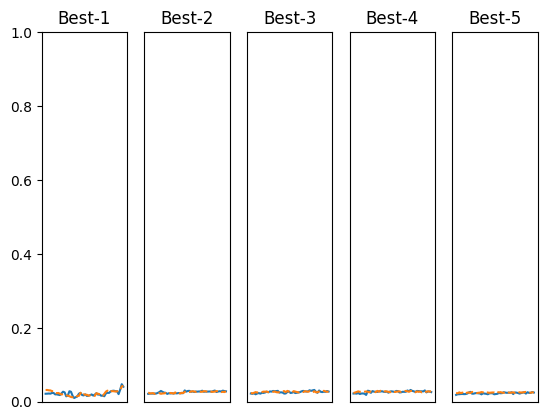

: 

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import time
from tensorflow.keras.regularizers import l2

# 학습 함수 정의
def __train(lr, epochs=50):
    # MobileNet 모델 정의 및 weight decay 적용
    with strategy.scope():
        model = tf.keras.applications.MobileNet(
            include_top=True,
            weights=None,
            input_shape=(32, 32, 3),
            classes=num_classes,
            classifier_activation=None
        )


        # 모델 컴파일
        optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

    early_stopping, model_checkpoint_cb = set_before_train(50, model.name)
    lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=25,
        min_lr=1e-6
    )

    with strategy.scope():
        history = model.fit(train_dist_dataset, 
                            epochs=epochs, 
                            steps_per_epoch=train_steps_per_epoch,
                            validation_data=val_dist_dataset, 
                            validation_steps=val_steps_per_epoch,
                            callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler],
                            verbose=0)

    return history.history['val_accuracy'], history.history['accuracy']

# 하이퍼파라미터 무작위 탐색
optimization_trial = 10
results_val = {}
results_train = {}

for _ in range(optimization_trial):
    lr = 10 ** np.random.uniform(-6, -2)
    
    val_acc_list, train_acc_list = __train(lr)
    print("val acc:" + str(val_acc_list[-1]) + " | lr:" + str(lr))
    key = "lr:" + str(lr)
    results_val[key] = val_acc_list
    results_train[key] = train_acc_list

# 그래프 그리기
print("=========== Hyper-Parameter Optimization Result ===========")
graph_draw_num = 5
col_num = 5
row_num = int(np.ceil(graph_draw_num / col_num))
i = 0


for key, val_acc_list in sorted(results_val.items(), key=lambda x: x[1][-1], reverse=True):
    print("Best-" + str(i+1) + "(val acc:" + str(val_acc_list[-1]) + ") | " + key)

    plt.subplot(row_num, col_num, i + 1)
    plt.title("Best-" + str(i + 1))
    plt.ylim(0.0, 1.0)
    if i % 5: plt.yticks([])
    plt.xticks([])
    x = np.arange(len(val_acc_list))
    plt.plot(x, val_acc_list)
    plt.plot(x, results_train[key], "--")
    i += 1

    if i >= graph_draw_num:
        break

plt.show()

# 모델 재탐색

1. **ResNet (Residual Network):**

    - 출시 연도: 2015년
    
    - 논문: "Deep Residual Learning for Image Recognition" (He et al.)

    - ResNet-18, ResNet-34, ResNet-50, ResNet-101, ResNet-152 등 다양한 깊이를 가진 변형들이 있습니다. 이 모델들은 이미지 분류와 같은 다양한 컴퓨터 비전 작업에서 사용됩니다.
    
    - ResNet의 주요 특징은 skip connection (또는 shortcut connection)을 통해 gradient vanishing 문제를 완화시키는 것입니다.

2. **Wide ResNet (WRN):**

    - 출시 연도: 2016년

    - 논문: "Wide Residual Networks" (Zagoruyko and Komodakis)

    - ResNet의 변형으로, 네트워크의 깊이를 증가시키는 대신 너비를 늘린 모델입니다. 더 넓은 레이어를 통해 학습을 용이하게 하며, 다양한 이미지 분류 작업에서 성능이 뛰어납니다.

3. **ResNeXt:**

    - 출시 연도: 2017년

    - 논문: "Aggregated Residual Transformations for Deep Neural Networks" (Xie et al.)

    - ResNet의 아이디어를 기반으로, 여러 병렬 경로를 사용하는 grouped convolution을 도입한 모델입니다. ResNeXt는 성능을 향상시키면서도 파라미터 수와 연산량을 효율적으로 조절합니다.

4. **DenseNet (Densely Connected Convolutional Networks):**
    - 출시 연도: 2016년

    - 논문: "Densely Connected Convolutional Networks" (Huang et al.)

    - 각 레이어가 모든 이전 레이어로부터 입력을 받는 구조를 가지고 있습니다. ResNet의 skip connection을 확장한 개념으로, gradient 흐름을 원활하게 하고 특징 재사용을 극대화합니다.

5. **Dual Path Networks (DPN):**
    - 출시 연도: 2017년

    - 논문: "Dual Path Networks" (Chen et al.)

    - ResNet과 DenseNet의 장점을 결합한 모델로, 병렬 경로를 통해 두 가지 특징 추출 방식을 동시에 사용합니다.

6. **Squeeze-and-Excitation Networks (SENet):**
    - 출시 연도: 2018년

    - 논문: "Squeeze-and-Excitation Networks" (Hu et al.)

    - ResNet 구조에 SE 모듈을 추가하여 채널 중요도를 학습하는 방식입니다. 각 채널의 중요도를 조정함으로써 모델 성능을 향상시킵니다.

7. **Residual Attention Network:**
    - 출시 연도: 2017년
    
    - 논문: "Residual Attention Network for Image Classification" (Wang et al.)

    - ResNet에 attention 메커니즘을 결합한 모델로, 중요한 특징을 강조하고 불필요한 특징을 억제하여 성능을 향상시킵니다.

8. **Res2Net:**

    - 출시 연도: 2019년

    - 논문: "Res2Net: A New Multi-Scale Backbone Architecture" (Gao et al.)

    - ResNet 블록 내부에 multi-scale feature extraction을 추가한 구조입니다. 하나의 레지듀얼 블록 내에서 다양한 크기의 특징을 추출할 수 있어 성능 향상에 기여합니다.

# 최종 모델 선정

EMNIST(Extended MNIST) 데이터셋은 손글씨 숫자와 문자로 구성되어 있으며, 이미지 크기가 28x28인 흑백 이미지로 이루어져 있습니다. 이 데이터셋을 효과적으로 훈련하기 위해 적합한 모델을 선정할 때, 다음과 같은 요소들을 고려해야 합니다:

1. **모델의 효율성**: 작은 이미지 크기에 맞는 적절한 네트워크 구조

2. **학습 속도와 성능**: 적절한 학습 시간과 높은 정확도

3. **정보 보존 능력**: 작은 이미지에서도 유용한 특징을 잘 추출할 수 있는 능력

위의 모델들 중에서 EMNIST 데이터셋에 적합한 모델을 선정할 때, 다음 두 가지 모델이 특히 유리할 수 있습니다:

### 1. **Wide ResNet (WRN)**

   - **이유**:

     - **넓은 레이어**: Wide ResNet은 깊이를 증가시키기보다는 네트워크의 너비를 확장하여 더 많은 정보를 효율적으로 학습할 수 있습니다. 이는 작은 이미지에서도 중요한 특징을 잘 추출할 수 있게 합니다.

     - **성능**: 여러 연구에서 Wide ResNet은 작은 데이터셋에서도 우수한 성능을 보여줬습니다. 이는 EMNIST와 같은 작은 크기의 이미지 데이터셋에 특히 유리합니다.

     - **구현 및 최적화**: Wide ResNet은 상대적으로 구현이 간단하고 다양한 변형을 통해 최적화할 수 있습니다.

### 2. **DenseNet**

   - **이유**:

     - **특징 재사용**: DenseNet은 각 레이어가 모든 이전 레이어의 출력을 입력으로 받기 때문에 특징 재사용이 극대화됩니다. 이는 작은 이미지에서도 유용한 특징을 효과적으로 학습하고 보존할 수 있습니다.

     - **Gradient 흐름**: DenseNet의 구조는 gradient vanishing 문제를 효과적으로 해결하여, 깊은 네트워크에서도 안정적인 학습을 가능하게 합니다.

     - **성능 및 효율성**: DenseNet은 작은 데이터셋에서도 매우 높은 성능을 보이며, 효율적인 학습이 가능합니다.

### 최종 추천

**Wide ResNet (WRN)** 과 **DenseNet** 중에서 **DenseNet**을 최종적으로 추천합니다. 이는 DenseNet의 특징 재사용과 안정적인 gradient 흐름 덕분에, 작은 이미지 크기에서도 효과적인 학습이 가능하기 때문입니다.

DenseNet의 주요 장점은 EMNIST와 같은 데이터셋에 특히 유리한 구조적 특성을 가지고 있어, 높은 성능을 기대할 수 있습니다. DenseNet을 사용하는 경우, 데이터셋의 특성에 맞게 네트워크의 깊이와 성장률(Growth Rate)을 조정하여 최적의 성능을 얻을 수 있습니다. 

따라서, **DenseNet**을 선택하여 EMNIST 데이터셋을 훈련하는 것이 가장 적합할 것으로 판단됩니다.

# 8개 모델 보다 DenseNet을 사용해야하는 이유.

1. **ResNet vs. DenseNet**:
   - ResNet: Skip connection을 사용하여 gradient vanishing 문제를 해결하고, 네트워크를 깊게 쌓을 수 있습니다.
   - DenseNet: 모든 이전 레이어로부터 입력을 받아 특징 재사용을 극대화하고, gradient 흐름을 향상시켜 안정적인 학습을 가능하게 합니다.
   - 이유: DenseNet은 ResNet과 비슷한 문제 해결 기능을 가지면서도 특징 재사용을 통해 더 효율적인 학습이 가능하므로, 작은 데이터셋에 더 적합합니다.

2. **Wide ResNet (WRN) vs. DenseNet**:
   - WRN: 넓은 레이어를 통해 네트워크의 학습 용이성을 증가시키고, 다양한 이미지 분류 작업에서 뛰어난 성능을 보입니다.
   - 이유: DenseNet은 작은 이미지에서도 효율적인 특징 재사용을 통해 학습을 강화할 수 있으며, 파라미터 및 메모리 효율성 측면에서 WRN보다 우수합니다.

3. **ResNeXt vs. DenseNet**:
   - ResNeXt: 병렬 경로를 사용하여 파라미터 수와 연산량을 효율적으로 관리하며, 다양한 이미지 분류 작업에서 성능을 높입니다.
   - 이유: DenseNet은 특징 재사용을 통해 파라미터 효율성을 높이고, 네트워크의 안정적인 학습을 가능하게 합니다. 작은 이미지에서도 유용한 특징을 추출하므로 EMNIST에 더 적합합니다.

4. **Dual Path Networks (DPN) vs. DenseNet**:
   - DPN: ResNet과 DenseNet의 장점을 결합한 병렬 경로를 사용하여 성능을 극대화합니다.
   - 이유: DenseNet은 단순한 구조와 높은 성능으로 검증되어 있으며, 작은 이미지 데이터셋에서도 효율적인 학습이 가능합니다. 또한 구현이 비교적 간단하고 효율적입니다.

5. **Squeeze-and-Excitation Networks (SENet) vs. DenseNet**:
   - SENet: 채널 중요도를 학습하여 모델의 성능을 향상시킵니다.
   - 이유: DenseNet은 모든 이전 레이어의 특징을 재사용하여 효율적인 학습이 가능하며, 작은 이미지에서도 유용한 특징을 추출합니다. SENet과 비슷한 효과를 얻을 수 있지만, DenseNet의 구현과 자원 효율성이 더 뛰어나다고 볼 수 있습니다.

6. **Residual Attention Network vs. DenseNet**:
   - Residual Attention Network: Attention 메커니즘을 사용하여 중요한 특징을 강조하고 학습합니다.
   - 이유: DenseNet은 모든 이전 레이어의 특징을 재사용하여 효율적인 학습이 가능하며, 깊은 네트워크에서도 안정적인 학습을 지원합니다. 따라서, Attention 메커니즘과 유사한 효과를 얻을 수 있습니다.

7. **Res2Net vs. DenseNet**:
   - Res2Net: 하나의 레지듀얼 블록 내에서 multi-scale feature extraction을 지원하여 성능을 향상시킵니다.
   - 이유: DenseNet은 각 레이어가 모든 이전 레이어로부터 입력을 받아 특징 재사용을 극대화하므로, Res2Net과 유사한 효과를 얻을 수 있습니다. 또한 DenseNet은 구현이 간단하고 효율적입니다.

요약하면, DenseNet은 효율적인 특징 재사용을 통해 작은 이미지 데이터셋에서 뛰어난 성능을 발휘하며, 구현의 용이성과 자원 효율성 측면에서 다른 모델들보다 우수합니다. 따라서 EMNIST와 같은 작은 이미지 데이터셋에 적합한 모델로서 DenseNet을 추천합니다.


# 모델 파라미터 수, 레이어 수 - 학습에 미치는 영향 차이

1. 모델 파라미터 수와 학습 시간
    - 파라미터 수와 학습 시간: 일반적으로 모델의 파라미터 수가 많을수록 학습 시간도 증가합니다. 이는 더 많은 파라미터를 업데이트하고 최적화하는 데 더 많은 계산 자원이 필요하기 때문입니다. 따라서, WRN 모델이 ResNet보다 파라미터 수가 많다면 학습 시간도 더 길어질 가능성이 큽니다.
    
    - 학습 시간에 영향을 미치는 요소:
        - 파라미터 수: 파라미터 수가 많을수록 계산량이 증가합니다.
        - 데이터 양: 학습에 사용하는 데이터의 양이 많을수록 학습 시간이 길어집니다.
        - 하드웨어 성능: GPU나 TPU와 같은 하드웨어 가속기를 사용할 경우 학습 시간이 단축될 수 있습니다.
        - 최적화 알고리즘: 사용되는 최적화 알고리즘의 효율성도 학습 시간에 영향을 미칩니다.

2. 레이어 수와 모델 파라미터 수의 차이
    - 레이어 수: 모델의 깊이를 나타내며, 레이어 수가 많을수록 모델이 더 깊다는 의미입니다. 더 깊은 모델은 더 복잡한 특징을 학습할 수 있지만, 너무 깊어지면 학습이 어려워지는 문제(예: 그래디언트 소실 문제)가 발생할 수 있습니다.
    - 파라미터 수: 모델의 전체 파라미터 개수를 나타냅니다. 이는 각 레이어의 필터 수와 레이어 간의 연결 방식에 따라 결정됩니다.

3. 모델 간의 차이

    - 레이어 수에 따른 차이:

        - ResNet: 더 깊은 네트워크를 사용하여 성능을 향상시키는 모델입니다. 잔차 연결(residual connection)을 통해 더 깊은 네트워크에서도 학습이 가능하도록 합니다.
        - WRN: 레이어 수를 크게 늘리지 않고, 대신 각 레이어의 폭(채널 수)을 늘려 성능을 향상시킵니다. 이는 네트워크가 더 많은 특징을 학습할 수 있게 하며, 상대적으로 얕지만 넓은 구조를 가집니다.

    - 파라미터 수에 따른 차이:

        - 모델의 용량: 파라미터 수가 많을수록 모델의 용량이 커져서 더 많은 정보를 저장하고 학습할 수 있습니다.
        - 오버피팅: 파라미터 수가 지나치게 많으면 학습 데이터에 과적합(overfitting)될 위험이 있습니다.
        - 계산 비용: 파라미터 수가 많을수록 계산 비용이 증가하며, 이는 더 많은 메모리와 더 긴 학습 시간을 요구합니다.

# 1. 모델 파라미터 비교

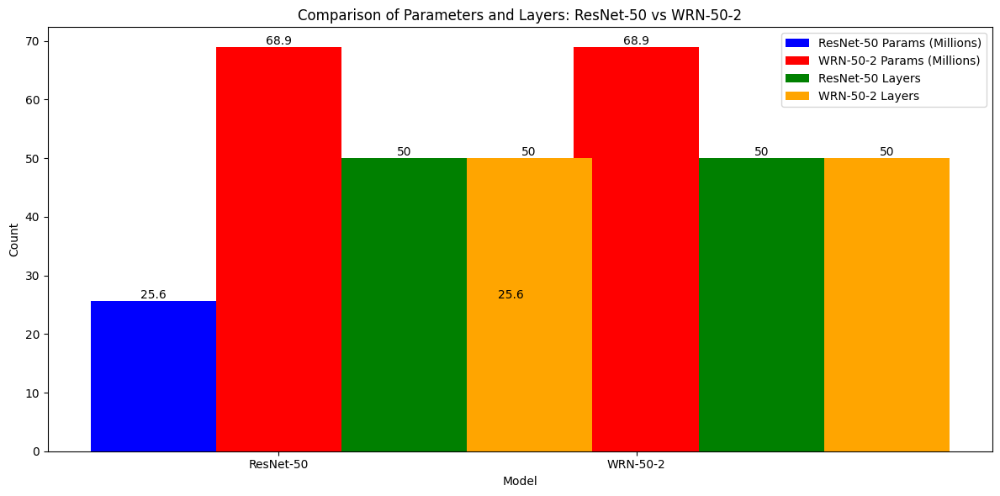

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 데이터 설정: 파라미터 수와 레이어 수 예시
models = ["ResNet-50", "WRN-50-2"]
layer_counts = [50, 50]
resnet_params = [25.6]  # Million parameters for ResNet-50
wrn_params = [68.9]  # Million parameters for WRN-50-2

# 파라미터 수 막대 그래프 생성
bar_width = 0.35
index = np.arange(len(models))

fig, ax = plt.subplots(figsize=(12, 6))

bars_resnet_params = plt.bar(index, resnet_params, bar_width, label='ResNet-50 Params (Millions)', color='b')
bars_wrn_params = plt.bar(index + bar_width, wrn_params, bar_width, label='WRN-50-2 Params (Millions)', color='r')

# 레이어 수 막대 그래프 생성
layer_counts_offset = 2 * bar_width
bars_resnet_layers = plt.bar(index + layer_counts_offset, layer_counts, bar_width, label='ResNet-50 Layers', color='g')
bars_wrn_layers = plt.bar(index + layer_counts_offset + bar_width, layer_counts, bar_width, label='WRN-50-2 Layers', color='orange')

# 레이블 추가
plt.xlabel('Model')
plt.ylabel('Count')
plt.title('Comparison of Parameters and Layers: ResNet-50 vs WRN-50-2')
plt.xticks(index + bar_width, models)
plt.legend()

# 값 레이블 추가
def add_value_labels(bars):
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2.0, height,
                 f'{height}', ha='center', va='bottom')

add_value_labels(bars_resnet_params)
add_value_labels(bars_wrn_params)
add_value_labels(bars_resnet_layers)
add_value_labels(bars_wrn_layers)

# 그래프 출력
plt.tight_layout()
plt.show()


# 2. 모델 구조 비교

일반적으로 Wide Residual Networks (WRNs)는 동일한 깊이의 ResNet보다 더 많은 파라미터를 가집니다. 이는 WRNs가 네트워크의 각 레이어에서 더 많은 채널(폭)을 사용하기 때문입니다. 폭을 늘리면 각 레이어의 필터 수가 증가하여 파라미터 수가 크게 증가합니다.

### 이유
- **ResNet**: 각 레이어의 채널 수가 비교적 작으며, 깊이를 통해 성능을 향상시킵니다.
- **WRN**: 각 레이어의 채널 수를 늘려(폭을 늘려) 성능을 향상시킵니다. 이를 통해 더 많은 특성을 학습할 수 있으며, 동일한 깊이의 ResNet보다 더 많은 파라미터를 갖게 됩니다.

### 예시 비교
- **ResNet-50**: 기본 채널 수(필터 수)를 사용.
- **WRN-50-2**: 기본 ResNet-50의 채널 수를 2배로 증가시킨 모델.

### 계산 예시
- **ResNet-50**:
  - 초기 컨볼루션 레이어: 7x7 필터, 64채널.
  - 각 스테이지: 깊이에 따라 다양한 채널 수(예: 64, 128, 256, 512).

- **WRN-50-2**:
  - 초기 컨볼루션 레이어: 3x3 필터, 64채널(이전 예제에서는 32x32 입력에 맞게 변경됨).
  - 각 스테이지: 기본 ResNet의 채널 수를 2배로 증가(예: 128, 256, 512, 1024).

### 파라미터 수 증가
- WRN에서 각 레이어의 채널 수를 두 배로 늘리면, 파라미터 수는 네트워크의 각 컨볼루션 레이어에서 대략 네 배로 증가합니다. 이는 필터의 개수가 두 배로 늘어남과 동시에 각 필터의 입력 채널 수도 두 배로 늘어나기 때문입니다.

### 실험 결과
- 다양한 실험 결과에 따르면, 동일한 깊이에서 WRNs는 ResNet보다 더 나은 성능을 보이는 경향이 있습니다. 이는 폭을 늘리면서 더 많은 특징을 학습할 수 있기 때문입니다.

따라서, 동일한 깊이에서 WRNs는 더 많은 파라미터를 가지며, 이는 일반적으로 더 나은 성능으로 이어집니다. 다만, 더 많은 파라미터는 더 많은 메모리와 계산 자원을 요구합니다.


# 3. 모델 구조 출력

## 1) ResNet-50
```python
Input Image: 32 x 32 x 3

Conv1: 32 x 32 x 64 (3x3 conv, stride 1)
MaxPool: 32 x 32 x 64 (3x3 max pool, stride 1)

Stage 1:
    Block 1: 32 x 32 x 64 -> 32 x 32 x 256
    Block 2: 32 x 32 x 256
    Block 3: 32 x 32 x 256

Stage 2:
    Block 1: 16 x 16 x 128 -> 16 x 16 x 512 (stride 2)
    Block 2: 16 x 16 x 512
    Block 3: 16 x 16 x 512
    Block 4: 16 x 16 x 512

Stage 3:
    Block 1: 8 x 8 x 256 -> 8 x 8 x 1024 (stride 2)
    Block 2: 8 x 8 x 1024
    Block 3: 8 x 8 x 1024
    Block 4: 8 x 8 x 1024
    Block 5: 8 x 8 x 1024
    Block 6: 8 x 8 x 1024

Stage 4:
    Block 1: 4 x 4 x 512 -> 4 x 4 x 2048 (stride 2)
    Block 2: 4 x 4 x 2048
    Block 3: 4 x 4 x 2048

Global Average Pooling: 1 x 1 x 2048

Fully Connected: 47 (classes)

Total Parameters: ~23.5 Million

```

## 2) Our ResNet-50 (zero_padding, dropout 사용)

EMNIST 데이터셋은 숫자와 문자로 구성된 이미지 데이터셋으로, 경계선 부분이 다른 이미지 분류 작업에 비해 상대적으로 덜 중요할 수 있습니다. 하지만 제로 패딩은 여전히 유용한 기술입니다. 제로 패딩의 주요 장점은 컨볼루션 연산 후 이미지의 공간적 차원을 유지하는 데 도움이 된다는 것입니다. 이를 통해 네트워크가 입력 데이터의 가장자리에 있는 중요한 특징을 잃지 않도록 할 수 있습니다.

### zero_padding의 장점

    1. 경계 효과 감소: 입력 이미지의 가장자리에서 특징을 더 잘 추출할 수 있습니다.
    
    2. 크기 유지: 컨볼루션 연산 후에도 이미지의 공간적 차원을 유지하여 네트워크의 출력 크기를 일정하게 유지할 수 있습니다.

    3. 효율적인 구현: 제로 패딩은 파라미터 수에 큰 영향을 미치지 않으며, 학습 시간에도 미미한 영향을 줍니다. 이는 네트워크의 성능을 향상시키는 데 도움이 될 수 있습니다.

### zero_padding 사용에 따른 영향

    1. 파라미터 수: 제로 패딩 자체는 파라미터 수에 영향을 미치지 않습니다. 이는 단지 입력 데이터의 가장자리에 0을 추가하여 크기를 변경하는 작업입니다.
    
    2. 학습 시간: 제로 패딩은 약간의 추가 연산을 요구하지만, 이는 전체 학습 시간에 큰 영향을 미치지 않습니다.

    3. 특징 추출: 경계 부분의 특징을 더 잘 추출할 수 있어 성능 향상에 도움이 될 수 있습니다.
    
따라서, EMNIST 데이터셋의 경우에도 제로 패딩을 사용하는 것이 일반적으로 좋은 접근입니다. 경계 부분이 상대적으로 덜 중요하더라도, 제로 패딩을 통해 네트워크가 더 나은 성능을 발휘할 수 있습니다.

```python
Input Image: 32 x 32 x 3
ZeroPadding: 38 x 38 x 3 (padding=(3, 3))

Conv1: 19 x 19 x 64 (7x7 conv, stride 2)
MaxPool: 10 x 10 x 64 (3x3 max pool, stride 2)

Stage 1:
    Block 1: 10 x 10 x 64 -> 10 x 10 x 256
    Block 2: 10 x 10 x 256
    Block 3: 10 x 10 x 256

Stage 2:
    Block 1: 5 x 5 x 128 -> 5 x 5 x 512 (stride 2)
    Block 2: 5 x 5 x 512
    Block 3: 5 x 5 x 512
    Block 4: 5 x 5 x 512

Stage 3:
    Block 1: 3 x 3 x 256 -> 3 x 3 x 1024 (stride 2)
    Block 2: 3 x 3 x 1024
    Block 3: 3 x 3 x 1024
    Block 4: 3 x 3 x 1024
    Block 5: 3 x 3 x 1024
    Block 6: 3 x 3 x 1024

Stage 4:
    Block 1: 2 x 2 x 512 -> 2 x 2 x 2048 (stride 2)
    Block 2: 2 x 2 x 2048
    Block 3: 2 x 2 x 2048

Global Average Pooling: 1 x 1 x 2048

Dropout: 1 x 1 x 2048 (Dropout 0.5)

Fully Connected: 47 (classes)

Total Parameters: ~23.5 Million
```

## 2) WRN-50-2
```python
Input Image: 32 x 32 x 3

Conv1: 32 x 32 x 64 (3x3 conv, stride 1)
MaxPool: 32 x 32 x 64 (3x3 max pool, stride 1)

Stage 1:
    Block 1: 32 x 32 x 128 -> 32 x 32 x 512 (채널 수 2배)
    Block 2: 32 x 32 x 512
    Block 3: 32 x 32 x 512

Stage 2:
    Block 1: 16 x 16 x 256 -> 16 x 16 x 1024 (채널 수 2배, stride 2)
    Block 2: 16 x 16 x 1024
    Block 3: 16 x 16 x 1024
    Block 4: 16 x 16 x 1024

Stage 3:
    Block 1: 8 x 8 x 512 -> 8 x 8 x 2048 (채널 수 2배, stride 2)
    Block 2: 8 x 8 x 2048
    Block 3: 8 x 8 x 2048
    Block 4: 8 x 8 x 2048
    Block 5: 8 x 8 x 2048
    Block 6: 8 x 8 x 2048

Stage 4:
    Block 1: 4 x 4 x 1024 -> 4 x 4 x 4096 (채널 수 2배, stride 2)
    Block 2: 4 x 4 x 4096
    Block 3: 4 x 4 x 4096

Global Average Pooling: 1 x 1 x 4096

Fully Connected: 47 (classes)

Total Parameters: ~66.3 Million


```

# 4. WRN 모델 코드

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, initializers

########################################################################################################
# ResNet과 WRN은 동일한 깊이(레이어 수)를 가짐.
# 예를 들어, ResNet-50과 WRN-50-2는 모두 50개의 레이어를 가지지만 WRN-50-2는 폭을 두 배로 늘려 더 많은 파라미터를 가짐.
# 즉, 동일한 레이어 수를 가지지만 레이어의 폭이 달라 파라미터 수에 차이가 나는 것.
########################################################################################################

class WRNConv(tf.keras.layers.Layer):
    def __init__(self, out_channels, kernel_size, stride, padding, activate, name=None):
        super(WRNConv, self).__init__(name=name)
        self.activate = activate
        self.conv = layers.Conv2D(
            filters=out_channels,
            kernel_size=kernel_size,
            strides=stride,
            padding=padding,
            kernel_initializer=initializers.HeUniform(),
            name=f"{name}_conv")
        if self.activate:
            self.activ = layers.ReLU(name=f"{name}_relu")

    def call(self, x):
        x = self.conv(x)
        if self.activate:
            x = self.activ(x)
        return x

def wrn_conv1x1(out_channels, stride, activate, name=None):
    return WRNConv(
        out_channels=out_channels,
        kernel_size=1,
        stride=stride,
        padding='valid',
        activate=activate,
        name=name)

def wrn_conv3x3(out_channels, stride, activate, name=None):
    return WRNConv(
        out_channels=out_channels,
        kernel_size=3,
        stride=stride,
        padding='same',
        activate=activate,
        name=name)

class WRNBottleneck(tf.keras.layers.Layer):
    def __init__(self, in_channels, out_channels, stride, width_factor, name=None):
        super(WRNBottleneck, self).__init__(name=name)
        mid_channels = int(round(out_channels // 4 * width_factor))
        self.conv1 = wrn_conv1x1(mid_channels, 1, True, name=f"{name}_conv1")
        self.conv2 = wrn_conv3x3(mid_channels, stride, True, name=f"{name}_conv2")
        self.conv3 = wrn_conv1x1(out_channels, 1, False, name=f"{name}_conv3")

    def call(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        return x

class WRNUnit(tf.keras.layers.Layer):
    def __init__(self, in_channels, out_channels, stride, width_factor, name=None):
        super(WRNUnit, self).__init__(name=name)
        self.resize_identity = (in_channels != out_channels) or (stride != 1)
        self.body = WRNBottleneck(in_channels, out_channels, stride, width_factor, name=f"{name}_body")
        if self.resize_identity:
            self.identity_conv = wrn_conv1x1(out_channels, stride, False, name=f"{name}_identity_conv")
        self.activ = layers.ReLU(name=f"{name}_relu")

    def call(self, x):
        identity = self.identity_conv(x) if self.resize_identity else x
        x = self.body(x)
        x = layers.add([x, identity], name=f"{self.name}_add")
        x = self.activ(x)
        return x

class WRNInitBlock(tf.keras.layers.Layer):
    def __init__(self, out_channels, name=None):
        super(WRNInitBlock, self).__init__(name=name)
        self.conv = WRNConv(
            out_channels=out_channels,
            kernel_size=3,  # 변경: 7x7 -> 3x3
            stride=1,       # 변경: 2 -> 1
            padding='same',
            activate=True,
            name=f"{name}_conv")
        self.pool = layers.MaxPool2D(
            pool_size=3,
            strides=1,      # 변경: 2 -> 1
            padding='same',
            name=f"{name}_pool")

    def call(self, x):
        x = self.conv(x)
        x = self.pool(x)
        return x

class WRN(tf.keras.Model):
    def __init__(self, channels, init_block_channels, width_factor, num_classes=47):
        super(WRN, self).__init__()
        self.init_block = WRNInitBlock(init_block_channels, name="init_block")
        self.stages = []
        in_channels = init_block_channels
        for i, channels_per_stage in enumerate(channels):
            stage = []
            for j, out_channels in enumerate(channels_per_stage):
                stride = 2 if (j == 0) and (i != 0) else 1
                unit_name = f"stage_{i + 1}_unit_{j + 1}"
                stage.append(WRNUnit(in_channels, out_channels, stride, width_factor, name=unit_name))
                in_channels = out_channels
            self.stages.append(stage)
        self.global_avg_pool = layers.GlobalAvgPool2D(name="global_avg_pool")
        self.output_layer = layers.Dense(
            units=num_classes,
            kernel_initializer=initializers.HeUniform(),
            name="output_layer")

    def call(self, x):
        x = self.init_block(x)
        for stage in self.stages:
            for unit in stage:
                x = unit(x)
        x = self.global_avg_pool(x)
        x = self.output_layer(x)
        return x

    def build_graph(self, input_shape):
        x = tf.keras.layers.Input(shape=input_shape)
        return tf.keras.Model(inputs=[x], outputs=self.call(x))

def wrn50_2(num_classes=47):
    def get_wrn(blocks, width_factor, num_classes=47):
        if blocks == 50:
            layers = [3, 4, 6, 3]
        elif blocks == 101:
            layers = [3, 4, 23, 3]
        elif blocks == 152:
            layers = [3, 8, 36, 3]
        elif blocks == 200:
            layers = [3, 24, 36, 3]
        else:
            raise ValueError("Unsupported WRN with number of blocks: {}".format(blocks))

        init_block_channels = 64
        channels_per_layers = [256, 512, 1024, 2048]
        channels = [[ci] * li for (ci, li) in zip(channels_per_layers, layers)]

        return WRN(channels, init_block_channels, width_factor, num_classes=num_classes)

    return get_wrn(blocks=50, width_factor=2.0, num_classes=num_classes)

##############################################
# # Instantiate the model
# model = wrn50_2(num_classes=47)

# # Build the model with input shape (32, 32, 3)
# model.build(input_shape=(None, 32, 32, 3))

# # Get the graph model
# graph_model = model.build_graph((32, 32, 3))

# # Print the summary
# graph_model.summary()
##############################################


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 init_block (WRNInitBlock)   (None, 32, 32, 64)        1792      
                                                                 
 stage_1_unit_1 (WRNUnit)    (None, 32, 32, 256)       205568    
                                                                 
 stage_1_unit_2 (WRNUnit)    (None, 32, 32, 256)       213504    
                                                                 
 stage_1_unit_3 (WRNUnit)    (None, 32, 32, 256)       213504    
                                                                 
 stage_2_unit_1 (WRNUnit)    (None, 16, 16, 512)       919040    
                                                                 
 stage_2_unit_2 (WRNUnit)    (None, 16, 16, 512)       8529

# 5. WRN 학습 (default model)

In [ ]:
###################################
# IMPORT
###################################

# Standard library imports
import os
import time

# Third-party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from tensorflow.python.client import device_lib
import seaborn as sns

# Keras imports
from keras.callbacks import EarlyStopping
from keras.layers import Activation, AveragePooling2D, Conv2D, Dense, Dropout, Flatten, Layer, Input
from keras.models import Sequential
from keras.utils import np_utils
import keras.backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

# Custom utilities (프로젝트 진행 시 계속 필요한 내용들을 따로 정의하여 불러옴.)
from distribution_utils import num_of_gpu, distribute_dataset, set_strategy
from datasets_utils import prepare_datasets, plot_class_examples, class_counts_plot
from train_and_test_utils import set_before_train, test_loss_and_accuracy, plot_learning_curves

###################################
# mutl-gpu
###################################

num_gpus = num_of_gpu(num=4)

###################################
# datasets
###################################

X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets('balanced', resize_shape=(32, 32))

###################################
# distribution settings
###################################

strategy = set_strategy()

###################################
# batch_size
###################################

batch_size = 2048
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset(batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

###################################
# model_path
###################################

def get_model_path(model_name):
    model_path = "trained_models/" + model_name + ".h5"
    return model_path

Number of GPUs: 4


X_train shape: (94000, 32, 32, 3)
X_valid shape: (18799, 32, 32, 3)
X_test shape: (18799, 32, 32, 3)


Number of label classes: 47



2024-05-30 16:46:31.725778: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-30 16:46:33.986021: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 22346 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:21:00.0, compute capability: 8.6
2024-05-30 16:46:33.987868: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 22346 MB memory:  -> device: 1, name: NVIDIA RTX A5000, pci bus id: 0000:22:00.0, compute capability: 8.6
2024-05-30 16:46:33.989498: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 22346 MB memory:  -> device: 2, name: NVIDIA RTX A5000, pci bus id: 0000:23:00.0,

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


 Running on multiple GPUs  ['/device:GPU:0', '/device:GPU:1', '/device:GPU:2', '/device:GPU:3']


In [ ]:
class WRNUnit(tf.keras.layers.Layer):
    def __init__(self, in_channels, out_channels, stride, width_factor, name=None):
        super(WRNUnit, self).__init__(name=name)
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.stride = stride
        self.width_factor = width_factor

        self.body = WRNBottleneck(in_channels, out_channels, stride, width_factor, name=f"{name}_bottleneck")

        if in_channels != out_channels or stride != 1:
            self.resize_identity = wrn_conv1x1(out_channels, stride, False, name=f"{name}_identity_conv")
        else:
            self.resize_identity = None

        self.relu = layers.ReLU()

    def call(self, inputs):
        identity = inputs

        if self.resize_identity is not None:
            identity = self.resize_identity(inputs)

        x = self.body(inputs)
        x = layers.add([x, identity])
        x = self.relu(x)
        return x

    def get_config(self):
        config = super(WRNUnit, self).get_config()
        config.update({
            'in_channels': self.in_channels,
            'out_channels': self.out_channels,
            'stride': self.stride,
            'width_factor': self.width_factor,
        })
        return config

class WRN(tf.keras.Model):
    def __init__(self, channels, init_block_channels, width_factor, num_classes=47):
        super(WRN, self).__init__()
        self.init_block = WRNInitBlock(init_block_channels, name="init_block")
        self.stages = []
        in_channels = init_block_channels
        for i, channels_per_stage in enumerate(channels):
            stage = []
            for j, out_channels in enumerate(channels_per_stage):
                stride = 2 if (j == 0) and (i != 0) else 1
                unit_name = f"stage_{i + 1}_unit_{j + 1}"
                stage.append(WRNUnit(in_channels, out_channels, stride, width_factor, name=unit_name))
                in_channels = out_channels
            self.stages.append(stage)
        self.global_avg_pool = layers.GlobalAvgPool2D(name="global_avg_pool")
        self.output_layer = layers.Dense(
            units=num_classes,
            kernel_initializer=initializers.HeUniform(),
            name="output_layer")

    def call(self, x):
        x = self.init_block(x)
        for stage in self.stages:
            for unit in stage:
                x = unit(x)
        x = self.global_avg_pool(x)
        x = self.output_layer(x)
        return x

    def build_graph(self, input_shape):
        x = tf.keras.layers.Input(shape=input_shape)
        return tf.keras.Model(inputs=[x], outputs=self.call(x))

def wrn50_2(num_classes=47):
    def get_wrn(blocks, width_factor, num_classes=47):
        if blocks == 50:
            layers = [3, 4, 6, 3]
        elif blocks == 101:
            layers = [3, 4, 23, 3]
        elif blocks == 152:
            layers = [3, 8, 36, 3]
        elif blocks == 200:
            layers = [3, 24, 36, 3]
        else:
            raise ValueError("Unsupported WRN with number of blocks: {}".format(blocks))

        init_block_channels = 64
        channels_per_layers = [256, 512, 1024, 2048]
        channels = [[ci] * li for (ci, li) in zip(channels_per_layers, layers)]

        return WRN(channels, init_block_channels, width_factor, num_classes=num_classes)

    return get_wrn(blocks=50, width_factor=2.0, num_classes=num_classes)

In [ ]:
model_name = "WRN_lr_0.001_Adam"

with strategy.scope():
    # Instantiate the model
    model = wrn50_2(num_classes=47)

    # Build the model with input shape (32, 32, 3)
    model.build(input_shape=(None, 32, 32, 3))

    # Get the graph model
    model_WRN = model.build_graph((32, 32, 3))

    # 초기 학습률 설정
    initial_learning_rate = 0.001
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    model_WRN.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])
    
model_WRN.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 init_block (WRNInitBlock)   (None, 32, 32, 64)        1792      
                                                                 
 stage_1_unit_1 (WRNUnit)    (None, 32, 32, 256)       205568    
                                                                 
 stage_1_unit_2 (WRNUnit)    (None, 32, 32, 256)       213504    
                                                                 
 stage_1_unit_3 (WRNUnit)    (None, 32, 32, 256)       213504    
                                                                 
 stage_2_unit_1 (WRNUnit)    (None, 16, 16, 512)       919040    
                                                                 
 stage_2_unit_2 (WRNUnit)    (None, 16, 16, 512)       8529

Epoch 1/200
INFO:tensorflow:batch_all_reduce: 108 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 108 all-reduces with algorithm = nccl, num_packs = 1
46/46 [==============================] - 39s 402ms/step - loss: 13.8865 - accuracy: 0.0217 - val_loss: 13.9595 - val_accuracy: 0.0229 - lr: 0.0010
Epoch 2/200
46/46 [==============================] - 12s 253ms/step - loss: 13.8975 - accuracy: 0.0220 - val_loss: 13.9721 - val_accuracy: 0.0227 - lr: 0.0010
Epoch 3/200
46/46 [==============================] - 12s 252ms/step - loss: 13.9728 - accuracy: 0.0216 - val_loss: 13.9721 - val_accuracy: 0.0225 - lr: 0.0010
Epoch 4/200
46/46 [==============================] - 16s 346ms/step - loss: 13.9840 - accuracy: 0.0194 - val_loss: 13.8745 - val_accuracy: 0.0240 - lr: 0.0010
Epoch 5/200
46/46 [==============================] - 12s 251ms/step - loss: 13.9646 - accuracy: 0.0218 - val_loss: 13.9469 - val_accuracy: 0.0234 - lr: 0.0010
Epoch 6/200
46/46 [============

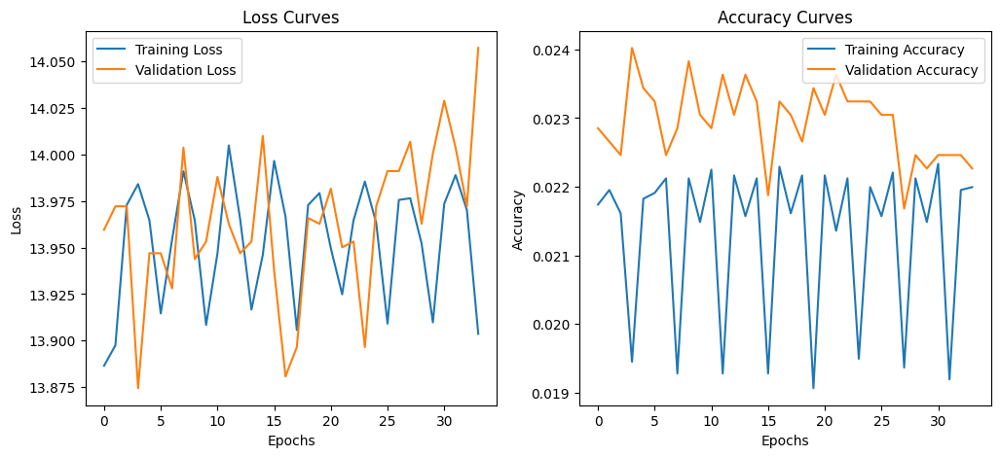

2/2 [==============================] - 1s 70ms/step - loss: 13.9091 - accuracy: 0.0205
Model Name:  model_4
Test Loss: 13.909
Test Accuracy: 0.021


: 

In [ ]:
# 학습
model_path_model_WRN = get_model_path(model_name)
early_stopping, model_checkpoint_cb = set_before_train(30, model_path_model_WRN)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=15,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)

with strategy.scope():
    start_time = time.time()
    history_model_WRN = model_WRN.fit(
        train_dist_dataset, 
        epochs=200, 
        steps_per_epoch=train_steps_per_epoch,
        validation_data=val_dist_dataset, 
        validation_steps=val_steps_per_epoch,
        callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler]
    )
    end_time = time.time()

model_WRN.save(model_path_model_WRN)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_WRN)

# 테스트셋으로 성능 평가
test_loss_and_accuracy(
    model_WRN, 
    X_test, 
    batch_size, 
    num_gpus, 
    test_dist_dataset, 
    custom_objects=None
)

# DenseNet

# 1. 모델 설명

https://arxiv.org/pdf/1608.06993

## 1) DenseNet의 다양한 종류
DenseNet 모델에는 여러 변형이 있습니다. 주요 변형들은 다음과 같습니다:

    - DenseNet-121: 121 레이어로 구성된 DenseNet 모델.
    - DenseNet-169: 169 레이어로 구성된 DenseNet 모델.
    - DenseNet-201: 201 레이어로 구성된 DenseNet 모델.
    - DenseNet-264: 264 레이어로 구성된 DenseNet 모델.

이들 모델은 레이어 수가 증가함에 따라 더 깊은 네트워크를 형성합니다. 더 많은 레이어는 더 복잡한 특징을 학습할 수 있게 하지만, 더 많은 계산 자원을 요구합니다.

## 2) 32x32 크기의 입력에 적합한 DenseNet 모델

32x32 크기의 입력에 적합한 DenseNet 모델을 선택할 때는 모델의 깊이와 계산 비용을 고려해야 합니다. DenseNet-121은 비교적 가벼운 모델로, CIFAR-10과 같은 작은 이미지 데이터셋에서 잘 작동합니다. 따라서 32x32 크기의 입력 이미지에 DenseNet-121을 사용하는 것이 적합할 수 있습니다.

## 3) 모델 블록들 설명
- Conv1: 첫 번째 컨볼루션 레이어는 7x7 필터와 stride 2를 사용하여 이미지를 다운샘플링합니다.
- Dense Block: 각 Dense Block은 여러 개의 Conv Block으로 구성되어 있습니다. 각 레이어는 이전 모든 레이어의 출력을 입력으로 받습니다.
- Transition Layer: 각 Dense Block 사이에 위치하며, 채널 수를 줄이고, 평균 풀링을 통해 공간 크기를 줄입니다.
- Global Average Pooling: 마지막 레이어의 출력을 1x1 크기로 줄입니다.
- Fully Connected: 최종 출력 레이어로, 클래스 수에 맞춰 출력합니다

## 4) 주요 특징

### 4-1) Dense connectivity

DenseNet의 가장 큰 특징은 Dense Connectivity입니다. 이를 통해 DenseNet은 이전 레이어의 출력을 다음 모든 레이어의 입력으로 사용하는 구조를 가지고 있습니다.

1. Dense Connectivity (밀집 연결)

    - DenseNet에서 각 레이어는 이전 모든 레이어로부터의 출력을 자신의 입력으로 사용합니다. 즉, 레이어 𝑙에서의 입력은 𝑙−1개의 레이어 출력과 자신의 출력이 결합된 것입니다.

    - 이 구조는 정보와 그라디언트의 흐름을 촉진하여 학습을 더 효율적으로 만듭니다.

2. Feature Reuse

    - 각 레이어는 이전 레이어들의 출력을 다시 사용하므로, 특성 재사용이 일어나며, 더 적은 파라미터로도 높은 성능을 달성할 수 있습니다.  
    
    - 이는 네트워크의 각 레이어가 새로운 특성을 학습하는 것보다 이전 특성을 재사용함으로써 더 효율적으로 학습하는 것을 의미합니다.

3. Reduced Vanishing Gradient Problem

    - Dense Connectivity는 그라디언트가 네트워크를 통해 더 쉽게 전달될 수 있도록 하여, 깊은 네트워크에서도 소멸하는 그라디언트 문제를 완화합니다.

4. Parameter Efficiency

    - 특성 재사용 덕분에, DenseNet은 동일한 성능을 가진 다른 네트워크에 비해 적은 파라미터를 필요로 합니다. 이는 DenseNet이 더 효율적인 모델임을 의미합니다.

### 4-2) Transition Layer
Transition Layer는 DenseNet의 또 다른 중요한 요소입니다. 각 Dense Block 사이에 위치하며, 다음과 같은 기능을 수행합니다:

1. Downsampling

    - Transition Layer는 네트워크의 해상도를 줄이기 위해 1×1 컨볼루션과 평균 풀링을 사용합니다.
    
    - 이는 네트워크가 점점 더 추상적인 특성을 학습할 수 있도록 합니다.

2. Compression

    - Transition Layer는 채널 수를 줄여 네트워크의 계산 비용을 줄이고, 모델이 과적합되지 않도록 도와줍니다.

    - 이는 네트워크의 파라미터 수를 줄이는 데에도 도움이 됩니다.

### 5) ResNet vs. DenseNet

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/a90dbaf1-c104-4dfa-8fd8-7d30f5f33bdb)

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/0fb1aa8b-77a0-4174-ae3b-bac1d082dc23)


## 2. DenseNet121 모델 구조 (default)
```python
Input Image: 32 x 32 x 3

# ZeroPadding2D: 입력 이미지를 38x38로 확장하여 경계 부분에서 정보 손실을 방지
ZeroPadding: 38 x 38 x 3 (padding=(3, 3))

# Conv1: 첫 번째 컨볼루션 레이어는 7x7 필터와 stride 2를 사용하여 이미지를 다운샘플링
Conv1: 16 x 16 x 64 (7x7 conv, stride 2)
BatchNorm + ReLU
# ZeroPadding2D: 경계 효과를 줄이기 위해 추가 패딩을 적용
ZeroPadding: 18 x 18 x 64 (padding=(1, 1))
# AveragePooling2D: 평균 풀링을 사용하여 공간 해상도를 줄임.
AveragePooling: 8 x 8 x 64 (3x3 pool, stride 2)

Dense Block 1 (6 layers):
    Layer 1: 8 x 8 x 32 -> 8 x 8 x 96 (conv block)
    Layer 2: 8 x 8 x 32 -> 8 x 8 x 128 (conv block)
    Layer 3: 8 x 8 x 32 -> 8 x 8 x 160 (conv block)
    Layer 4: 8 x 8 x 32 -> 8 x 8 x 192 (conv block)
    Layer 5: 8 x 8 x 32 -> 8 x 8 x 224 (conv block)
    Layer 6: 8 x 8 x 32 -> 8 x 8 x 256 (conv block)

Transition Layer 1:
    BatchNorm + ReLU
    Conv: 8 x 8 x 128 (1x1 conv)
    AveragePooling: 4 x 4 x 128 (2x2 pool, stride 2)

Dense Block 2 (12 layers):
    Layer 1: 4 x 4 x 32 -> 4 x 4 x 160 (conv block)
    Layer 2: 4 x 4 x 32 -> 4 x 4 x 192 (conv block)
    Layer 3: 4 x 4 x 32 -> 4 x 4 x 224 (conv block)
    Layer 4: 4 x 4 x 32 -> 4 x 4 x 256 (conv block)
    Layer 5: 4 x 4 x 32 -> 4 x 4 x 288 (conv block)
    Layer 6: 4 x 4 x 32 -> 4 x 4 x 320 (conv block)
    Layer 7: 4 x 4 x 32 -> 4 x 4 x 352 (conv block)
    Layer 8: 4 x 4 x 32 -> 4 x 4 x 384 (conv block)
    Layer 9: 4 x 4 x 32 -> 4 x 4 x 416 (conv block)
    Layer 10: 4 x 4 x 32 -> 4 x 4 x 448 (conv block)
    Layer 11: 4 x 4 x 32 -> 4 x 4 x 480 (conv block)
    Layer 12: 4 x 4 x 32 -> 4 x 4 x 512 (conv block)

Transition Layer 2:
    BatchNorm + ReLU
    Conv: 4 x 4 x 256 (1x1 conv)
    AveragePooling: 2 x 2 x 256 (2x2 pool, stride 2)

Dense Block 3 (24 layers):
    Layer 1: 2 x 2 x 32 -> 2 x 2 x 288 (conv block)
    Layer 2: 2 x 2 x 32 -> 2 x 2 x 320 (conv block)
    Layer 3: 2 x 2 x 32 -> 2 x 2 x 352 (conv block)
    Layer 4: 2 x 2 x 32 -> 2 x 2 x 384 (conv block)
    Layer 5: 2 x 2 x 32 -> 2 x 2 x 416 (conv block)
    Layer 6: 2 x 2 x 32 -> 2 x 2 x 448 (conv block)
    Layer 7: 2 x 2 x 32 -> 2 x 2 x 480 (conv block)
    Layer 8: 2 x 2 x 32 -> 2 x 2 x 512 (conv block)
    Layer 9: 2 x 2 x 32 -> 2 x 2 x 544 (conv block)
    Layer 10: 2 x 2 x 32 -> 2 x 2 x 576 (conv block)
    Layer 11: 2 x 2 x 32 -> 2 x 2 x 608 (conv block)
    Layer 12: 2 x 2 x 32 -> 2 x 2 x 640 (conv block)
    Layer 13: 2 x 2 x 32 -> 2 x 2 x 672 (conv block)
    Layer 14: 2 x 2 x 32 -> 2 x 2 x 704 (conv block)
    Layer 15: 2 x 2 x 32 -> 2 x 2 x 736 (conv block)
    Layer 16: 2 x 2 x 32 -> 2 x 2 x 768 (conv block)
    Layer 17: 2 x 2 x 32 -> 2 x 2 x 800 (conv block)
    Layer 18: 2 x 2 x 32 -> 2 x 2 x 832 (conv block)
    Layer 19: 2 x 2 x 32 -> 2 x 2 x 864 (conv block)
    Layer 20: 2 x 2 x 32 -> 2 x 2 x 896 (conv block)
    Layer 21: 2 x 2 x 32 -> 2 x 2 x 928 (conv block)
    Layer 22: 2 x 2 x 32 -> 2 x 2 x 960 (conv block)
    Layer 23: 2 x 2 x 32 -> 2 x 2 x 992 (conv block)
    Layer 24: 2 x 2 x 32 -> 2 x 2 x 1024 (conv block)

Transition Layer 3:
    BatchNorm + ReLU
    Conv: 2 x 2 x 512 (1x1 conv)
    AveragePooling: 1 x 1 x 512 (2x2 pool, stride 2)

Dense Block 4 (16 layers):
    Layer 1: 1 x 1 x 32 -> 1 x 1 x 544 (conv block)
    Layer 2: 1 x 1 x 32 -> 1 x 1 x 576 (conv block)
    Layer 3: 1 x 1 x 32 -> 1 x 1 x 608 (conv block)
    Layer 4: 1 x 1 x 32 -> 1 x 1 x 640 (conv block)
    Layer 5: 1 x 1 x 32 -> 1 x 1 x 672 (conv block)
    Layer 6: 1 x 1 x 32 -> 1 x 1 x 704 (conv block)
    Layer 7: 1 x 1 x 32 -> 1 x 1 x 736 (conv block)
    Layer 8: 1 x 1 x 32 -> 1 x 1 x 768 (conv block)
    Layer 9: 1 x 1 x 32 -> 1 x 1 x 800 (conv block)
    Layer 10: 1 x 1 x 32 -> 1 x 1 x 832 (conv block)
    Layer 11: 1 x 1 x 32 -> 1 x 1 x 864 (conv block)
    Layer 12: 1 x 1 x 32 -> 1 x 1 x 896 (conv block)
    Layer 13: 1 x 1 x 32 -> 1 x 1 x 928 (conv block)
    Layer 14: 1 x 1 x 32 -> 1 x 1 x 960 (conv block)
    Layer 15: 1 x 1 x 32 -> 1 x 1 x 992 (conv block)
    Layer 16: 1 x 1 x 32 -> 1 x 1 x 1024 (conv block)

BatchNorm + ReLU
Global Average Pooling: 1 x 1 x 1024

Fully Connected: 47 (classes)

Total Parameters: ~7,979,887

```

In [117]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model

# DenseNet-121 모델 정의
num_classes = 47

model_DenseNet121 = tf.keras.applications.DenseNet121(include_top=True,
                                                      weights=None,
                                                      input_shape=(32, 32, 3),
                                                      pooling='max',
                                                      classes=num_classes)

# 모델 컴파일
initial_learning_rate = 0.001
model_DenseNet121.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=initial_learning_rate),
                          loss='sparse_categorical_crossentropy',
                          metrics=['accuracy'])

# 모델 요약 정보
model_DenseNet121.summary()

# 모델 구조를 이미지로 저장
# plot_model(model_DenseNet121, to_file='densenet121_model.png', show_shapes=True, show_layer_names=True)


Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_36 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 zero_padding2d_66 (ZeroPadding  (None, 38, 38, 3)   0           ['input_36[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   9408        ['zero_padding2d_66[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1/conv[0][0]']   

## 3. 모델 코드

### 1) tensorflow.keras.applications.DenseNet121

In [1]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D

# 하이퍼파라미터 설정
input_shape = (32, 32, 3)
num_classes = 47
initial_learning_rate = 0.001

# 모델 정의
with tf.distribute.get_strategy().scope():
    base_model = DenseNet121(
        include_top=False,  # DenseNet121의 top을 포함하지 않음
        weights=None,       # 사전 학습된 가중치 사용하지 않음
        input_shape=input_shape
    )
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    output_tensor = Dense(num_classes, activation='softmax')(x)
    
    model_DenseNet121 = Model(inputs=base_model.input, outputs=output_tensor)

    # 모델 컴파일
    model_DenseNet121.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                              loss='sparse_categorical_crossentropy',
                              metrics=['accuracy'])

# 모델 요약 정보 출력
model_DenseNet121.summary()


2024-05-30 18:07:18.726212: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-30 18:07:22.322608: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22346 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:1d:00.0, compute capability: 8.6
2024-05-30 18:07:22.324133: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22346 MB memory:  -> device: 1, name: NVIDIA RTX A5000, pci bus id: 0000:1f:00.0, compute capability: 8.6
2024-05-30 18:07:22.325588: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 38, 38, 3)   0           ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1/conv[0][0]']             
                                                                                              

### 2) Ours (keras 모델과 동일 구현)

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, ReLU, Concatenate, AveragePooling2D, GlobalAveragePooling2D, Dense, ZeroPadding2D
from tensorflow.keras.models import Model


def conv_block(x, growth_rate, name):
    x1 = BatchNormalization(name=name+'_0_bn')(x)
    x1 = ReLU(name=name+'_0_relu')(x1)
    x1 = Conv2D(4 * growth_rate, 1, use_bias=False, name=name+'_1_conv')(x1)
    x1 = BatchNormalization(name=name+'_1_bn')(x1)
    x1 = ReLU(name=name+'_1_relu')(x1)
    x1 = Conv2D(growth_rate, 3, padding='same', use_bias=False, name=name+'_2_conv')(x1)
    x = Concatenate(name=name+'_concat')([x, x1])
    return x

def dense_block(x, blocks, name):
    for i in range(blocks):
        x = conv_block(x, 32, name=name+'_block'+str(i + 1))
    return x

def transition_block(x, reduction, name):
    x = BatchNormalization(name=name+'_bn')(x)
    x = ReLU(name=name+'_relu')(x)
    x = Conv2D(int(tf.keras.backend.int_shape(x)[-1] * reduction), 1, use_bias=False, name=name+'_conv')(x)
    x = AveragePooling2D(2, strides=2, name=name+'_pool')(x)
    return x

def DenseNet(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 12, name='conv3')
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 24, name='conv4')
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121')
    return model


## 4. 학습

In [1]:
###################################
# IMPORT
###################################

# Standard library imports
import os
import time

# Third-party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from tensorflow.python.client import device_lib
import seaborn as sns
import itertools

# Keras imports
from keras.callbacks import EarlyStopping
from keras.layers import Activation, AveragePooling2D, Conv2D, Dense, Dropout, Flatten, Layer, Input
from keras.models import Sequential
from keras.utils import np_utils
import keras.backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import SGD, Adam, Adagrad, RMSprop, Adamax, Nadam
from tensorflow.keras.models import Model
from tensorflow.keras.models import Model

# Custom utilities (프로젝트 진행 시 계속 필요한 내용들을 따로 정의하여 불러옴.)
from distribution_utils import num_of_gpu, distribute_dataset, set_strategy
from datasets_utils import prepare_datasets, plot_class_examples, class_counts_plot
from train_and_test_utils import set_before_train, plot_learning_curves, test_loss_and_accuracy
from train_and_test_utils import test_combinations, test_activation

###################################
# mutl-gpu
###################################

num_gpus = num_of_gpu(num=4)

###################################
# datasets
###################################

X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets('balanced', resize_shape=(32, 32))

###################################
# distribution settings
###################################

strategy = set_strategy()

###################################
# batch_size
###################################

batch_size = 2048
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset(batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

###################################
# model_path
###################################

def get_model_path(model_name):
    model_path = "trained_models/" + model_name + ".h5"
    return model_path

###################################
# 불필요한 로그 안나오게.
# ERROR 수준만 출력되도록 함.
###################################

# 환경 변수 설정
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# TensorFlow 로거 설정
tf.get_logger().setLevel('ERROR')

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/tensorflow_addons/utils/ensure_tf_install.py:67: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.9.0 and strictly below 2.12.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  UserWarning,


Number of GPUs: 4

X_train shape: (94000, 32, 32, 3)
X_valid shape: (18799, 32, 32, 3)
X_test shape: (18799, 32, 32, 3)

Number of label classes: 47



2024-06-04 15:27:03.246347: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-04 15:27:05.443558: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 22346 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:21:00.0, compute capability: 8.6
2024-06-04 15:27:05.445212: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 22346 MB memory:  -> device: 1, name: NVIDIA RTX A5000, pci bus id: 0000:22:00.0, compute capability: 8.6
2024-06-04 15:27:05.446759: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 22346 MB memory:  -> device: 2, name: NVIDIA RTX A5000, pci bus id: 0000:23:00.0,

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


 Running on multiple GPUs  ['/device:GPU:0', '/device:GPU:1', '/device:GPU:2', '/device:GPU:3']


## 4-1) Default Model Structure

In [9]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, ReLU, Concatenate, AveragePooling2D, GlobalAveragePooling2D, Dense, ZeroPadding2D
from tensorflow.keras.models import Model

def conv_block(x, growth_rate, name):
    x1 = BatchNormalization(name=name+'_0_bn')(x)
    x1 = ReLU(name=name+'_0_relu')(x1)
    x1 = Conv2D(4 * growth_rate, 1, use_bias=False, name=name+'_1_conv')(x1)
    x1 = BatchNormalization(name=name+'_1_bn')(x1)
    x1 = ReLU(name=name+'_1_relu')(x1)
    x1 = Conv2D(growth_rate, 3, padding='same', use_bias=False, name=name+'_2_conv')(x1)
    x = Concatenate(name=name+'_concat')([x, x1])
    return x

def dense_block(x, blocks, name):
    for i in range(blocks):
        x = conv_block(x, 32, name=name+'_block'+str(i + 1))
    return x

def transition_block(x, reduction, name):
    x = BatchNormalization(name=name+'_bn')(x)
    x = ReLU(name=name+'_relu')(x)
    x = Conv2D(int(tf.keras.backend.int_shape(x)[-1] * reduction), 1, use_bias=False, name=name+'_conv')(x)
    x = AveragePooling2D(2, strides=2, name=name+'_pool')(x)
    return x

def DenseNet(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 12, name='conv3')
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 24, name='conv4')
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121')
    return model


In [3]:
input_shape = (32, 32, 3)
num_classes = 47

model_name = "DenseNet121_lr_0.001_Adam"

with strategy.scope():
    model_DenseNet = DenseNet(input_shape, num_classes)

    # 초기 학습률 설정
    initial_learning_rate = 0.001
    # 모델 컴파일 시 옵티마이저에 학습률 설정
    model_DenseNet.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                            loss='sparse_categorical_crossentropy',
                            metrics=['accuracy'])
    
model_DenseNet.summary()

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []              

Epoch 1/200
INFO:tensorflow:batch_all_reduce: 364 all-reduces with algorithm = nccl, num_packs = 1
INFO:tensorflow:batch_all_reduce: 364 all-reduces with algorithm = nccl, num_packs = 1
46/46 [==============================] - 237s 583ms/step - loss: 1.5817 - accuracy: 0.5658 - val_loss: 3.8762 - val_accuracy: 0.0226 - lr: 0.0010
Epoch 2/200
46/46 [==============================] - 9s 190ms/step - loss: 0.6199 - accuracy: 0.7929 - val_loss: 3.9197 - val_accuracy: 0.0208 - lr: 0.0010
Epoch 3/200
46/46 [==============================] - 9s 192ms/step - loss: 0.5156 - accuracy: 0.8259 - val_loss: 4.2197 - val_accuracy: 0.0214 - lr: 0.0010
Epoch 4/200
46/46 [==============================] - 9s 190ms/step - loss: 0.4766 - accuracy: 0.8345 - val_loss: 4.0767 - val_accuracy: 0.0560 - lr: 0.0010
Epoch 5/200
46/46 [==============================] - 11s 245ms/step - loss: 0.4640 - accuracy: 0.8358 - val_loss: 3.3157 - val_accuracy: 0.1680 - lr: 0.0010
Epoch 6/200
46/46 [========================

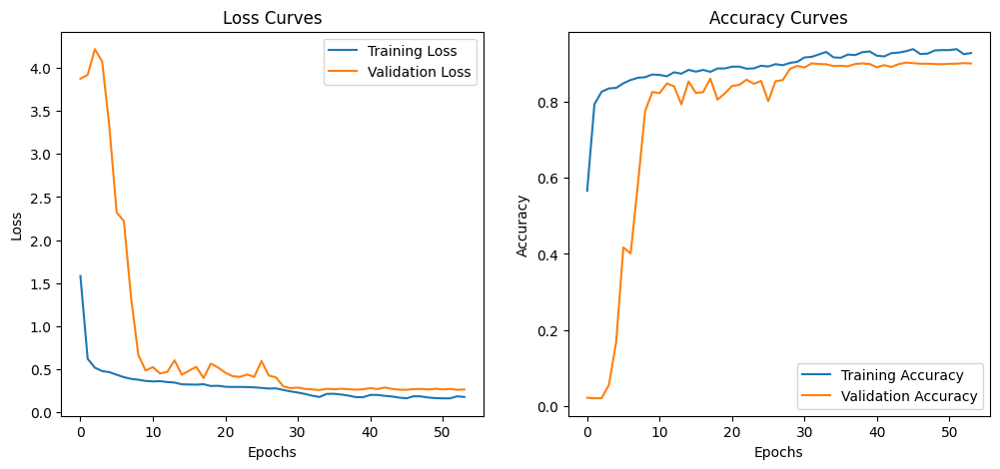

1/1 [==============================] - 16s 16s/step - loss: 0.2994 - accuracy: 0.8944
Model Path:  trained_models/DenseNet121_lr_0.001_Adam.h5
Test Loss: 0.299
Test Accuracy: 0.894


In [7]:
# 학습
model_path_model_DenseNet = get_model_path(model_name)
early_stopping, model_checkpoint_cb = set_before_train(20, model_path_model_DenseNet)
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',  # 성능을 모니터링할 지표
    factor=0.1,  # 학습률 감소 비율
    patience=10,  # 성능 향상이 없는 에포크 수
    min_lr=1e-6  # 학습률의 최소 값
)


with strategy.scope():
    start_time = time.time()
    history_model_DenseNet = model_DenseNet.fit(
        train_dist_dataset, 
        epochs=200, 
        steps_per_epoch=train_steps_per_epoch,
        validation_data=val_dist_dataset, 
        validation_steps=val_steps_per_epoch,
        callbacks=[early_stopping, model_checkpoint_cb, lr_scheduler]
    )
    end_time = time.time()

model_DenseNet.save(model_path_model_DenseNet)
print("Training time : ", end_time - start_time)

# learning curve
plot_learning_curves(history_model_DenseNet)

# 테스트셋으로 성능 평가
model_path_model_WRN = get_model_path(model_name)

test_loss_and_accuracy(
    model_path_model_WRN,
    strategy, 
    X_test, 
    batch_size, 
    num_gpus, 
    test_dist_dataset
)

# 5. 파인튜닝
## 5-1) learning_rate, optimizer 조합 찾기

- lr_scheduler 사용하지 않음.
- early_stopping 사용하지 않음.
- epoch 50으로 일관적이게 설정함.

### 학습률 - optimizer의 조합을 같이 보고, 활성화함수를 비교한 이유
- 학습률과 옵티마이저는 모델의 외부 하이퍼파라미터와 관련이 있으며,
- 활성화 함수는 모델의 내부 구조와 관련이 있으므로 각각 따로 비교하는 것이 더 일관적이고 체계적이다.

### keras.tuner
- 튜너를 사용할까 했지만, 각각의 모델도 저장하고 구체적으로 살펴보고 싶어 직접 구현함.
- 총 21개의 조합을 테스트함.
- keras.tuner

In [3]:
# 학습률과 옵티마이저 설정
learning_rates = [0.01,
                  0.001,
                  0.0001]
optimizers = ["Adam",       # 모멘텀 최적화 + RMSprop
              "AdaMax",     # Adam 변형 1
              "Nadam",      # Adam 변형 2
              "AdamW",      # Adam 변형 3
              "RMSprop",    # Exponential Decay(지수 함수)를 사용하여, \
                            #   AdaGrad가 너무 빨리 느려져 전역 최적점에 도달하지 못하는 문제를 해결.
              "Nesterov",   # NAG(Nesterov Accelerated Gradient): \
                            #  : 모멘텀의 방향으로 조금 앞선 위치에서 gradient를 계산.
              "Momentum"]
            # AdaGrad는 NN과 같은 복잡한 작업에 사용 X.

In [5]:
base_model_name = "DenseNet121"

with strategy.scope():
    custom_model = DenseNet(input_shape=(32,32,3), num_classes=num_classes)

# 최적의 모델 찾기
best_model_path = test_combinations(
    custom_model,

    train_dist_dataset, 
    train_steps_per_epoch, 
    val_dist_dataset,
    val_steps_per_epoch,
    X_test, 

    batch_size=batch_size, 
    num_epochs=50, 

    model_name=base_model_name, 
    
    # 튜닝하는 부분.
    learning_rates=learning_rates, 
    optimizers=optimizers,

    strategy=strategy,
    num_gpus=num_gpus,

    test_dist_dataset=test_dist_dataset,

    num_classes=num_classes
)

print("Best model between lr_and_Optimizer : ", best_model_path)


/home/hayeon/ann/project/trained_models/DenseNet121_lr_0.01_Adam.h5
Epoch 1/50
46/46 [==============================] - 153s 400ms/step - loss: 2.8825 - accuracy: 0.2917 - val_loss: 16765622272.0000 - val_accuracy: 0.0225
Epoch 2/50
46/46 [==============================] - 8s 172ms/step - loss: 1.0094 - accuracy: 0.6809 - val_loss: 19627.5469 - val_accuracy: 0.0207
Epoch 3/50
46/46 [==============================] - 8s 170ms/step - loss: 0.6365 - accuracy: 0.7910 - val_loss: 35.0602 - val_accuracy: 0.2012
Epoch 4/50
46/46 [==============================] - 8s 174ms/step - loss: 0.5276 - accuracy: 0.8182 - val_loss: 2.0927 - val_accuracy: 0.4840
Epoch 5/50
46/46 [==============================] - 8s 175ms/step - loss: 0.5121 - accuracy: 0.8277 - val_loss: 1.7700 - val_accuracy: 0.5242
Epoch 6/50
46/46 [==============================] - 8s 174ms/step - loss: 0.5008 - accuracy: 0.8313 - val_loss: 1.4530 - val_accuracy: 0.6789
Epoch 7/50
46/46 [==============================] - 8s 175ms/s

TypeError: cannot unpack non-iterable NoneType object

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/1d42c869-8cfc-4911-9e8c-e4c8380cfbff)

- Nadam, RMSprop은 학습시간이 너무 길어 고려 대상에서 제외함.
- learning_rate가 줄어들수록 오히려 training_curve와 validation curve간의 차이가 커짐. 
    - accuracy가 거의 10% 정도 차이남.
    - 일반적으로 5% 미만이면 과소적합, 5-10% 차이면 적절함, 10-15% 차이면 주의 필요, 15% 이상이면 과대적합으로 판단함.
    - 모든 optimizer 경우에서 10%정도 차이나는 learning_rate=0.0001은 고려 대상에서 제외함.
- 빠른 시간 내 많은 경우의 수를 판별하기 위해 batch_size를 크게 설정해서 테스트 했고, batch_size를 줄여서 다시 몇개만 테스트 해보기로 결정함.

In [4]:
batch_size = 1024
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset(batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

In [8]:
# 학습률과 옵티마이저 설정
learning_rates = [0.01,
                  0.001]
optimizers = ["Adam",       # 모멘텀 최적화 + RMSprop
              "AdaMax",     # Adam 변형 1
              "AdamW",      # Adam 변형 3
              "Nesterov",   # NAG(Nesterov Accelerated Gradient): \
                            #  : 모멘텀의 방향으로 조금 앞선 위치에서 gradient를 계산.
              "Momentum"]
            # AdaGrad는 NN과 같은 복잡한 작업에 사용 X.

In [9]:
base_model_name = "1024_DenseNet121"

with strategy.scope():
    custom_model = DenseNet(input_shape=(32,32,3), num_classes=num_classes)

# 최적의 모델 찾기
best_model_path = test_combinations(
    custom_model,

    train_dist_dataset, 
    train_steps_per_epoch, 
    val_dist_dataset,
    val_steps_per_epoch,
    X_test, 

    batch_size=batch_size, 
    num_epochs=50, 

    model_name=base_model_name, 
    
    # 튜닝하는 부분.
    learning_rates=learning_rates, 
    optimizers=optimizers,

    strategy=strategy,
    num_gpus=num_gpus,

    test_dist_dataset=test_dist_dataset,

    num_classes=num_classes
)

print("Best model between lr_and_Optimizer : ", best_model_path)


/home/hayeon/ann/project/trained_models/1024_DenseNet121_lr_0.01_Adam.h5
Epoch 1/50
92/92 [==============================] - 157s 276ms/step - loss: 2.5105 - accuracy: 0.3609 - val_loss: 9901.0361 - val_accuracy: 0.0204
Epoch 2/50
92/92 [==============================] - 15s 163ms/step - loss: 0.8013 - accuracy: 0.7413 - val_loss: 3.8369 - val_accuracy: 0.2845
Epoch 3/50
92/92 [==============================] - 15s 162ms/step - loss: 0.6218 - accuracy: 0.7934 - val_loss: 1.1655 - val_accuracy: 0.6345
Epoch 4/50
92/92 [==============================] - 19s 204ms/step - loss: 0.5348 - accuracy: 0.8177 - val_loss: 1.0334 - val_accuracy: 0.6898
Epoch 5/50
92/92 [==============================] - 15s 164ms/step - loss: 0.4723 - accuracy: 0.8373 - val_loss: 1.1051 - val_accuracy: 0.6573
Epoch 6/50
92/92 [==============================] - 15s 165ms/step - loss: 0.4271 - accuracy: 0.8464 - val_loss: 0.8608 - val_accuracy: 0.7753
Epoch 7/50
92/92 [==============================] - 15s 164ms/st

FileNotFoundError: [Errno 2] No such file or directory: '/home/hayeon/ann/project/trained_models/1024_DenseNet121_lr_0.01_Nesterov.h5' -> '/home/hayeon/ann/project/trained_models/1024_DenseNet121_lr_0.01_Nesterov_best.h5'

- Adam보다 AdaMax가 더 빨리 수렴하는 이유

    - Adam과 AdaMax

        - Adam: Adam은 기울기를 사용해서 방향을 정하고, 얼마나 이동할지 결정하는 알고리즘이다. 이 알고리즘은 기울기를 사용하면서도 예전 기울기 값들도 조금씩 반영한다. 이를 통해 갑자기 기울기가 크게 변하지 않도록 도와준다.

        - AdaMax: AdaMax는 Adam과 비슷하지만, 중요한 차이점이 있다. Adam은 기울기의 제곱을 사용해서 이동할 크기를 결정하지만, AdaMax는 기울기의 절대값 중에서 가장 큰 값을 사용한다.

    - 왜 AdaMax가 대규모 파라미터 업데이트를 잘할까?
    
        - 큰 기울기 대응: 기울기의 절대값 중 가장 큰 값을 사용하면, 기울기가 큰 경우에도 너무 많이 이동하지 않도록 해준다. 큰 기울기가 나와도 한 번에 큰 변화를 방지해서 안정적으로 학습할 수 있게 한다.

        - 안정적인 학습: 큰 파라미터(변수) 업데이트가 필요한 경우, AdaMax는 안정적으로 이동할 수 있다. 기울기의 최대값을 사용하기 때문에 여러 기울기 값의 영향으로 인해 불안정하게 변하는 것을 막아준다.

In [10]:
model_path_list = ['/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.01_Adam.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.001_Adam.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.01_AdaMax.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.001_AdaMax.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.01_AdamW.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.001_AdamW.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.01_Momentum.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.001_Momentum.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.01_Nesterov.h5',
                   '/home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.001_Nesterov.h5']

for path in model_path_list:
    test_loss_and_accuracy(path,
                        strategy,
                        X_test,
                        batch_size,
                        num_gpus,
                        test_dist_dataset)

4/4 [==============================] - 11s 58ms/step - loss: 0.4325 - accuracy: 0.8662
Model Path:  /home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.01_Adam.h5
Test Loss: 0.433
Test Accuracy: 0.866
4/4 [==============================] - 10s 55ms/step - loss: 0.6841 - accuracy: 0.8906
Model Path:  /home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.001_Adam.h5
Test Loss: 0.684
Test Accuracy: 0.891
4/4 [==============================] - 11s 49ms/step - loss: 0.5608 - accuracy: 0.8691
Model Path:  /home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.01_AdaMax.h5
Test Loss: 0.561
Test Accuracy: 0.869
4/4 [==============================] - 11s 50ms/step - loss: 0.7965 - accuracy: 0.8926
Model Path:  /home/hayeon/ann/project/trained_models/1-2.compare_lr_optimizer_10_batch_1024/1024_DenseNet121_lr_0.001_AdaMax.h5
Test Loss: 0.796
Test Accuracy: 

![image](https://github.com/HayeonJeong/StudyNote/assets/123214386/b66f897c-7542-456a-8f24-46a16f1824d5)

## 5-2) 활성화 함수 변경해보기

***> 활성화 함수를 파라미터로 받아서 사용하는 DenseNet121을 정의***

### (1) ReLU
```python
keras.activations.relu(x, negative_slope=0.0, max_value=None, threshold=0.0)
```
### (2) LeakyReLU
```python
keras.activations.leaky_relu(x, negative_slope=0.2)
```
### (3) Maxout
```python
def maxout(inputs, num_units, axis=None):
    shape = inputs.get_shape().as_list()
    if axis is None:
        # Assume that channel is the last dimension
        axis = -1
    num_channels = shape[axis]
    if num_channels % num_units:
        raise ValueError('number of features({}) is not a multiple of num_units({})'
            .format(num_channels, num_units))
    shape[axis] = -1
    shape += [num_channels // num_units]
    outputs = tf.reduce_max(tf.reshape(inputs, shape), -1, keep_dims=False)
    return outputs
```
### (4) ELU
```python
keras.activations.elu(x, alpha=1.0)
```

In [8]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, Concatenate, AveragePooling2D, GlobalAveragePooling2D, Dense, ZeroPadding2D, LeakyReLU, Layer, Reshape
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K

def conv_block(x, growth_rate, name, activation_function):
    x1 = BatchNormalization(name=name+'_0_bn')(x)
    if activation_function == 'prelu':
        x1 = tf.keras.layers.PReLU(name=name+'_0_prelu')(x1)
    else:
        x1 = Activation(activation_function, name=name+'_0_'+activation_function.__name__ if not isinstance(activation_function, str) else activation_function)(x1)
    x1 = Conv2D(4 * growth_rate, 1, use_bias=False, name=name+'_1_conv')(x1)
    x1 = BatchNormalization(name=name+'_1_bn')(x1)
    if activation_function == 'prelu':
        x1 = tf.keras.layers.PReLU(name=name+'_1_prelu')(x1)
    else:
        x1 = Activation(activation_function, name=name+'_1_'+activation_function.__name__ if not isinstance(activation_function, str) else activation_function)(x1)
    x1 = Conv2D(growth_rate, 3, padding='same', use_bias=False, name=name+'_2_conv')(x1)
    x = Concatenate(name=name+'_concat')([x, x1])
    return x

def dense_block(x, blocks, name, activation_function):
    for i in range(blocks):
        x = conv_block(x, 32, name=name+'_block'+str(i + 1), activation_function=activation_function)
    return x

def transition_block(x, reduction, name, activation_function):
    x = BatchNormalization(name=name+'_bn')(x)
    if activation_function == 'prelu':
        x = tf.keras.layers.PReLU(name=name+'_relu')(x)
    else:
        x = Activation(activation_function, name=name+'_relu')(x)
    x = Conv2D(int(tf.keras.backend.int_shape(x)[-1] * reduction), 1, use_bias=False, name=name+'_conv')(x)
    x = AveragePooling2D(2, strides=2, name=name+'_pool')(x)
    return x

def DenseNet(input_shape, num_classes, activation_function=tf.nn.relu):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    if activation_function == 'prelu':
        x = tf.keras.layers.PReLU(name='conv1/prelu')(x)
    else:
        x = Activation(activation_function, name='conv1/'+activation_function.__name__ if not isinstance(activation_function, str) else activation_function)(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)
    x = dense_block(x, 6, name='conv2', activation_function=activation_function)
    x = transition_block(x, 0.5, name='pool2', activation_function=activation_function)
    x = dense_block(x, 12, name='conv3', activation_function=activation_function)
    x = transition_block(x, 0.5, name='pool3', activation_function=activation_function)
    x = dense_block(x, 24, name='conv4', activation_function=activation_function)
    x = transition_block(x, 0.5, name='pool4', activation_function=activation_function)
    x = dense_block(x, 16, name='conv5', activation_function=activation_function)
    x = BatchNormalization(name='bn')(x)
    if activation_function == 'prelu':
        x = tf.keras.layers.PReLU(name='relu')(x)
    else:
        x = Activation(activation_function, name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)
    model = Model(inputs, outputs, name='densenet121')
    return model

In [14]:
# lr과 optimizer 고정.
learning_rates = 0.01
optimizers = 'Nesterov'

# 다양한 활성화 함수 리스트 업데이트
activation_functions = [
    tf.nn.relu,
    tf.nn.leaky_relu,
    tf.nn.elu,
    tf.nn.swish
]

In [15]:
base_model_name = "DenseNet121"

for activ_func in activation_functions:
    best_val_accuracy = 0
    best_model_path = ""
    best_activation = None

    print(f"Training with {activ_func.__name__} activation function")
    with strategy.scope():
        custom_model = DenseNet(input_shape=(32,32,3), num_classes=num_classes,
                                activation_function=activ_func)

    model_path, val_accuracy = test_activation(
                                        custom_model,

                                        train_dist_dataset, 
                                        train_steps_per_epoch, 
                                        val_dist_dataset,
                                        val_steps_per_epoch,
                                        X_test, 

                                        batch_size=batch_size, 
                                        num_epochs=50, 

                                        model_name=base_model_name, 
                                        
                                        # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                                        learning_rates=learning_rates, 
                                        optimizers=optimizers,

                                        strategy=strategy,
                                        num_gpus=num_gpus,

                                        test_dist_dataset=test_dist_dataset,

                                        num_classes=num_classes,

                                        activation_functions=activ_func
                                    )

    # 이제까지 best 모델보다 좋으면, 그 모델을 best 모델로 선정.
    if val_accuracy > best_val_accuracy:
        best_val_accuracy = val_accuracy
        best_model_path = model_path
        best_activation = activ_func

best_model_best_path = best_model_path.replace(".h5", "_best.h5")
os.rename(best_model_path, best_model_best_path)

print(f"Best validation accuracy: {best_val_accuracy}, with Activation_Function: {best_activation}")
print(f"with learning rate: {learning_rates} and optimizer: {optimizers}")

test_loss, test_accuracy = test_loss_and_accuracy(best_model_best_path, strategy, X_test, batch_size, num_gpus, test_dist_dataset)
print(f"Best test_accuracy: {test_accuracy}, test_loss: {test_loss}")

Training with relu activation function

/home/hayeon/ann/project/trained_models/DenseNet121_lr_0.01_Nesterov_relu.h5
Epoch 1/50
92/92 [==============================] - 150s 289ms/step - loss: 1.7562 - accuracy: 0.5293 - val_loss: 3.6333 - val_accuracy: 0.1435 - lr: 0.0100
Epoch 2/50
92/92 [==============================] - 16s 179ms/step - loss: 0.6257 - accuracy: 0.7953 - val_loss: 2.6985 - val_accuracy: 0.3146 - lr: 0.0100
Epoch 3/50
92/92 [==============================] - 16s 174ms/step - loss: 0.5213 - accuracy: 0.8228 - val_loss: 1.3807 - val_accuracy: 0.6114 - lr: 0.0100
Epoch 4/50
92/92 [==============================] - 16s 173ms/step - loss: 0.4721 - accuracy: 0.8366 - val_loss: 0.6225 - val_accuracy: 0.8006 - lr: 0.0100
Epoch 5/50
92/92 [==============================] - 16s 176ms/step - loss: 0.4365 - accuracy: 0.8504 - val_loss: 0.4868 - val_accuracy: 0.8341 - lr: 0.0100
Epoch 6/50
92/92 [==============================] - 16s 176ms/step - loss: 0.3935 - accuracy: 0.8604 -

TypeError: cannot unpack non-iterable NoneType object

## 5-3) dropout layer 추가해보기

### (1) Fully Connected Layer 뒤에 Dropout 

### (2) 각 Dense Block 뒤에 Dropout 

### (3) 각 Transition Block 뒤에 Dropout 

### (4) Dense Blocks 내부 Convolutional Layers 뒤에 Dropout 

### (5) 처음 Convolution Layer 뒤에 Dropout 

In [22]:
# learning_rates = 0.001
# optimizers = 'Nesterov'
# activ_func = 'elu'

In [2]:
from tensorflow.keras.layers import ELU

# Define the conv_block with ELU activation
def conv_block(x, growth_rate, name):
    x1 = BatchNormalization(name=name + '/bn')(x)
    x1 = ELU(name=name + '/elu')(x1)
    x1 = Conv2D(4 * growth_rate, 1, use_bias=False, name=name + '/conv1')(x1)
    x1 = BatchNormalization(name=name + '/bn2')(x1)
    x1 = ELU(name=name + '/elu2')(x1)
    x1 = Conv2D(growth_rate, 3, padding='same', use_bias=False, name=name + '/conv2')(x1)
    x = tf.keras.layers.concatenate([x, x1], name=name + '/concat')
    return x

# Define the dense_block with ELU activation
def dense_block(x, blocks, name):
    for i in range(blocks):
        x = conv_block(x, 32, name=name + '/block' + str(i + 1))
    return x

# Define the transition_block with ELU activation
def transition_block(x, reduction, name):
    x = BatchNormalization(name=name + '/bn')(x)
    x = ELU(name=name + '/elu')(x)
    x = Conv2D(int(tf.keras.backend.int_shape(x)[-1] * reduction), 1, use_bias=False, name=name + '/conv')(x)
    x = AveragePooling2D(2, strides=2, name=name + '/pool')(x)
    return x


In [25]:
from tensorflow.keras.layers import Dropout

# (1) Fully Connected Layer 뒤에 Dropout
def DenseNet_with_dropout_1(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 12, name='conv3')
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 24, name='conv4')
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.5, name='dropout')(x)  # Dropout added here
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_1')
    return model

In [26]:
# (2) 각 Dense Block 뒤에 Dropout
def DenseNet_with_dropout_2(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = Dropout(0.5, name='dropout1')(x)  # Dropout added here
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 12, name='conv3')
    x = Dropout(0.5, name='dropout2')(x)  # Dropout added here
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 24, name='conv4')
    x = Dropout(0.5, name='dropout3')(x)  # Dropout added here
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 16, name='conv5')
    x = Dropout(0.5, name='dropout4')(x)  # Dropout added here

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_2')
    return model


In [27]:
# (3) 각 Transition Block 뒤에 Dropout
def DenseNet_with_dropout_3(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = Dropout(0.5, name='dropout1')(x)  # Dropout added here
    x = dense_block(x, 12, name='conv3')
    x = transition_block(x, 0.5, name='pool3')
    x = Dropout(0.5, name='dropout2')(x)  # Dropout added here
    x = dense_block(x, 24, name='conv4')
    x = transition_block(x, 0.5, name='pool4')
    x = Dropout(0.5, name='dropout3')(x)  # Dropout added here
    x = dense_block(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_3')
    return model


In [28]:
# (4) Dense Blocks 내부 Convolutional Layers 뒤에 Dropout
def conv_block_with_dropout(x, growth_rate, name):
    x1 = BatchNormalization(name=name+'_0_bn')(x)
    x1 = ReLU(name=name+'_0_relu')(x1)
    x1 = Conv2D(4 * growth_rate, 1, use_bias=False, name=name+'_1_conv')(x1)
    x1 = Dropout(0.2, name=name+'_dropout1')(x1)  # Dropout added here
    x1 = BatchNormalization(name=name+'_1_bn')(x1)
    x1 = ReLU(name=name+'_1_relu')(x1)
    x1 = Conv2D(growth_rate, 3, padding='same', use_bias=False, name=name+'_2_conv')(x1)
    x1 = Dropout(0.2, name=name+'_dropout2')(x1)  # Dropout added here
    x = Concatenate(name=name+'_concat')([x, x1])
    return x

def dense_block_with_dropout(x, blocks, name):
    for i in range(blocks):
        x = conv_block_with_dropout(x, 32, name=name+'_block'+str(i + 1))
    return x

def DenseNet_with_dropout_4(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block_with_dropout(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block_with_dropout(x, 12, name='conv3')
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block_with_dropout(x, 24, name='conv4')
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block_with_dropout(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_4')
    return model


In [29]:
# (5) 처음 Convolution Layer 뒤에 Dropout 
def DenseNet_with_dropout_5(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = Dropout(0.3, name='dropout_conv1')(x)  # Dropout added here
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 12, name='conv3')
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 24, name='conv4')
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_5')
    return model


In [30]:
# lr과 optimizer 고정.
learning_rates = 0.001
optimizers = 'Nesterov'
activ_func = 'elu'

densenet_dropouts = [DenseNet_with_dropout_1(input_shape=(32,32,3), num_classes=num_classes),
                     DenseNet_with_dropout_2(input_shape=(32,32,3), num_classes=num_classes),
                     DenseNet_with_dropout_3(input_shape=(32,32,3), num_classes=num_classes),
                     DenseNet_with_dropout_4(input_shape=(32,32,3), num_classes=num_classes),
                     DenseNet_with_dropout_5(input_shape=(32,32,3), num_classes=num_classes)]

In [34]:
base_model_name = "DenseNet_dropout"
activ_func = tf.nn.elu

for n, dropout_model in zip([1, 2, 3, 4, 5], densenet_dropouts):
    best_val_accuracy = 0
    best_model_path = ""
    best_dropout = None

    with strategy.scope():
        if n == 1:
            custom_model = DenseNet_with_dropout_1(input_shape=(32,32,3), num_classes=num_classes)
        if n == 2:
            custom_model = DenseNet_with_dropout_2(input_shape=(32,32,3), num_classes=num_classes)
        if n == 3:
            custom_model = DenseNet_with_dropout_3(input_shape=(32,32,3), num_classes=num_classes)
        if n == 4:
            custom_model = DenseNet_with_dropout_4(input_shape=(32,32,3), num_classes=num_classes)
        if n == 5:
            custom_model = DenseNet_with_dropout_5(input_shape=(32,32,3), num_classes=num_classes)

    model_path, val_accuracy = test_activation(
                                        custom_model,

                                        train_dist_dataset, 
                                        train_steps_per_epoch, 
                                        val_dist_dataset,
                                        val_steps_per_epoch,
                                        X_test, 

                                        batch_size=batch_size, 
                                        num_epochs=50, 

                                        model_name=f"{base_model_name}_{n}", 
                                        
                                        # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                                        learning_rates=learning_rates, 
                                        optimizers=optimizers,

                                        strategy=strategy,
                                        num_gpus=num_gpus,

                                        test_dist_dataset=test_dist_dataset,

                                        num_classes=num_classes,

                                        activation_functions=activ_func
                                    )

    # 이제까지 best 모델보다 좋으면, 그 모델을 best 모델로 선정.
    if val_accuracy > best_val_accuracy:
        best_val_accuracy = val_accuracy
        best_model_path = model_path
        best_dropout = dropout_model

best_model_best_path = best_model_path.replace(".h5", "_best.h5")
os.rename(best_model_path, best_model_best_path)

print(f"Best validation accuracy: {best_val_accuracy}, with dropout: {best_dropout}")
print(f"with Activation_Function: {best_activation}")
print(f"with learning rate: {learning_rates} and optimizer: {optimizers}")

test_loss, test_accuracy = test_loss_and_accuracy(best_model_best_path, strategy, X_test, batch_size, num_gpus, test_dist_dataset)
print(f"Best test_accuracy: {test_accuracy}, test_loss: {test_loss}")


/home/hayeon/ann/project/trained_models/DenseNet_dropout_1_lr_0.001_Nesterov_elu.h5
Epoch 1/50
92/92 [==============================] - 158s 310ms/step - loss: 2.2121 - accuracy: 0.4337 - val_loss: 3.8077 - val_accuracy: 0.0216 - lr: 0.0010
Epoch 2/50
92/92 [==============================] - 17s 186ms/step - loss: 0.9509 - accuracy: 0.7237 - val_loss: 3.7352 - val_accuracy: 0.0286 - lr: 0.0010
Epoch 3/50
92/92 [==============================] - 17s 184ms/step - loss: 0.7524 - accuracy: 0.7714 - val_loss: 3.0872 - val_accuracy: 0.1817 - lr: 0.0010
Epoch 4/50
92/92 [==============================] - 17s 186ms/step - loss: 0.6476 - accuracy: 0.7976 - val_loss: 1.5870 - val_accuracy: 0.5713 - lr: 0.0010
Epoch 5/50
92/92 [==============================] - 17s 187ms/step - loss: 0.5938 - accuracy: 0.8095 - val_loss: 0.6608 - val_accuracy: 0.7995 - lr: 0.0010
Epoch 6/50
92/92 [==============================] - 17s 186ms/step - loss: 0.5349 - accuracy: 0.8271 - val_loss: 0.4489 - val_accuracy

TypeError: cannot unpack non-iterable NoneType object

### (1-1) dropout 0.5 -> 0.3

In [3]:
# (1) Fully Connected Layer 뒤에 Dropout
def DenseNet_with_dropout_1_1(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 12, name='conv3')
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 24, name='conv4')
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.3, name='dropout')(x)  # Dropout added here
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_1')
    return model

### (5_1) 0.3 -> 0.2

In [36]:
# (5) 처음 Convolution Layer 뒤에 Dropout 
def DenseNet_with_dropout_5_1(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = Dropout(0.2, name='dropout_conv1')(x)  # Dropout added here
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 12, name='conv3')
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 24, name='conv4')
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_5')
    return model


In [37]:
# lr과 optimizer 고정.
learning_rates = 0.001
optimizers = 'Nesterov'
activ_func = 'elu'

densenet_dropouts = [DenseNet_with_dropout_1_1(input_shape=(32,32,3), num_classes=num_classes),
                     DenseNet_with_dropout_5_1(input_shape=(32,32,3), num_classes=num_classes)]

In [38]:
base_model_name = "DenseNet_dropout"
activ_func = tf.nn.elu

for n, dropout_model in zip(["1_1", "5_1"], densenet_dropouts):
    best_val_accuracy = 0
    best_model_path = ""
    best_dropout = None

    with strategy.scope():
        if n == "1_1":
            custom_model = DenseNet_with_dropout_1_1(input_shape=(32,32,3), num_classes=num_classes)
        if n == "5_1":
            custom_model = DenseNet_with_dropout_5_1(input_shape=(32,32,3), num_classes=num_classes)

    model_path, val_accuracy = test_activation(
                                        custom_model,

                                        train_dist_dataset, 
                                        train_steps_per_epoch, 
                                        val_dist_dataset,
                                        val_steps_per_epoch,
                                        X_test, 

                                        batch_size=batch_size, 
                                        num_epochs=50, 

                                        model_name=f"{base_model_name}_{n}", 
                                        
                                        # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                                        learning_rates=learning_rates, 
                                        optimizers=optimizers,

                                        strategy=strategy,
                                        num_gpus=num_gpus,

                                        test_dist_dataset=test_dist_dataset,

                                        num_classes=num_classes,

                                        activation_functions=activ_func
                                    )

    # 이제까지 best 모델보다 좋으면, 그 모델을 best 모델로 선정.
    if val_accuracy > best_val_accuracy:
        best_val_accuracy = val_accuracy
        best_model_path = model_path
        best_dropout = dropout_model

best_model_best_path = best_model_path.replace(".h5", "_best.h5")
os.rename(best_model_path, best_model_best_path)

print(f"Best validation accuracy: {best_val_accuracy}, with dropout: {best_dropout}")
print(f"with Activation_Function: {best_activation}")
print(f"with learning rate: {learning_rates} and optimizer: {optimizers}")

test_loss, test_accuracy = test_loss_and_accuracy(best_model_best_path, strategy, X_test, batch_size, num_gpus, test_dist_dataset)
print(f"Best test_accuracy: {test_accuracy}, test_loss: {test_loss}")


/home/hayeon/ann/project/trained_models/DenseNet_dropout_1_1_lr_0.001_Nesterov_elu.h5
Epoch 1/50
92/92 [==============================] - 172s 317ms/step - loss: 2.0349 - accuracy: 0.4882 - val_loss: 3.8038 - val_accuracy: 0.0267 - lr: 0.0010
Epoch 2/50
92/92 [==============================] - 17s 189ms/step - loss: 0.8724 - accuracy: 0.7529 - val_loss: 3.7315 - val_accuracy: 0.0411 - lr: 0.0010
Epoch 3/50
92/92 [==============================] - 17s 188ms/step - loss: 0.6827 - accuracy: 0.7945 - val_loss: 3.1957 - val_accuracy: 0.1593 - lr: 0.0010
Epoch 4/50
92/92 [==============================] - 17s 190ms/step - loss: 0.5981 - accuracy: 0.8094 - val_loss: 1.7894 - val_accuracy: 0.5331 - lr: 0.0010
Epoch 5/50
92/92 [==============================] - 18s 192ms/step - loss: 0.5369 - accuracy: 0.8313 - val_loss: 0.6905 - val_accuracy: 0.8035 - lr: 0.0010
Epoch 6/50
92/92 [==============================] - 17s 190ms/step - loss: 0.4971 - accuracy: 0.8389 - val_loss: 0.4928 - val_accura

TypeError: cannot unpack non-iterable NoneType object

## +) test 함수 업데이트 (top-1, top-5 accuracy, inference_time 측정 코드 추가)

In [28]:
def test_loss_and_accuracy_update(model_path, strategy, X_test, batch_size, num_gpus, test_dist_dataset):
    # 테스트 데이터셋의 샘플 수
    test_samples = len(X_test)

    # 배치 크기와 GPU 수를 곱하여 총 배치 크기를 계산합니다.
    total_batch_size = batch_size * num_gpus

    # 단계 수 계산
    test_steps = test_samples // total_batch_size

    # 모델 로드
    with strategy.scope():
        model = tf.keras.models.load_model(model_path)
        
        # 전체 accuracy, top-1 accuracy, top-5 accuracy 메트릭 추가
        model.compile(
            optimizer=model.optimizer,
            loss=model.loss,
            metrics=[
                tf.keras.metrics.SparseCategoricalAccuracy(name='accuracy'),
                tf.keras.metrics.SparseTopKCategoricalAccuracy(k=1, name='top_1_accuracy'),
                tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name='top_5_accuracy')
            ]
        )

    # 평가 시간 측정
    start_time = time.time()
    results = model.evaluate(test_dist_dataset, steps=test_steps, return_dict=True)
    evaluation_time = time.time() - start_time

    # 추론 시간 측정
    start_time = time.time()
    predictions = model.predict(test_dist_dataset, steps=test_steps)
    inference_time = time.time() - start_time

    # 소수점 아래 셋째 자리까지 반올림하여 출력
    test_loss_rounded = round(results['loss'], 3)
    accuracy_rounded = round(results['accuracy'], 4)
    top_1_accuracy_rounded = round(results['top_1_accuracy'], 4)
    top_5_accuracy_rounded = round(results['top_5_accuracy'], 4)
    evaluation_time_rounded = round(evaluation_time, 3)
    inference_time_rounded = round(inference_time, 3)

    # 반올림된 값 출력
    print("Model Path: ", model_path)
    print("Test Loss: {:.3f}".format(test_loss_rounded))
    print("Overall Accuracy: {:.4f}".format(accuracy_rounded))
    print("Top-1 Accuracy: {:.4f}".format(top_1_accuracy_rounded))
    print("Top-5 Accuracy: {:.4f}".format(top_5_accuracy_rounded))
    print("Evaluation Time: {:.3f} seconds".format(evaluation_time_rounded))
    print("Inference Time: {:.3f} seconds".format(inference_time_rounded))


In [53]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/3.compare_dropout/DenseNet_dropout_1_1_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 12s 61ms/step - loss: 0.3059 - accuracy: 0.9072 - top_1_accuracy: 0.9072 - top_5_accuracy: 0.9912
Model Path:  /home/hayeon/ann/project/trained_models/3.compare_dropout/DenseNet_dropout_1_1_lr_0.001_Nesterov_elu.h5
Test Loss: 0.306
Overall Accuracy: 0.9072
Top-1 Accuracy: 0.9072
Top-5 Accuracy: 0.9912
Evaluation Time: 12.504 seconds
Inference Time: 11.357 seconds


In [56]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/3.compare_dropout/DenseNet_dropout_5_1_lr_0.001_Nesterov_elu_best.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 16s 62ms/step - loss: 0.3226 - accuracy: 0.8906 - top_1_accuracy: 0.8906 - top_5_accuracy: 0.9912
Model Path:  /home/hayeon/ann/project/trained_models/3.compare_dropout/DenseNet_dropout_5_1_lr_0.001_Nesterov_elu_best.h5
Test Loss: 0.323
Overall Accuracy: 0.8906
Top-1 Accuracy: 0.8906
Top-5 Accuracy: 0.9912
Evaluation Time: 15.929 seconds
Inference Time: 11.117 seconds


### (이전 활성화 함수 테스트 모델들 다시 검증)

In [57]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/2.compare_activation_function/DenseNet121_lr_0.01_Nesterov_relu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 12s 59ms/step - loss: 0.3351 - accuracy: 0.8867 - top_1_accuracy: 0.8867 - top_5_accuracy: 0.9922
Model Path:  /home/hayeon/ann/project/trained_models/2.compare_activation_function/DenseNet121_lr_0.01_Nesterov_relu.h5
Test Loss: 0.335
Overall Accuracy: 0.8867
Top-1 Accuracy: 0.8867
Top-5 Accuracy: 0.9922
Evaluation Time: 11.858 seconds
Inference Time: 10.724 seconds


In [58]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/2.compare_activation_function/DenseNet121_lr_0.01_Nesterov_leaky_relu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 12s 55ms/step - loss: 0.3363 - accuracy: 0.8936 - top_1_accuracy: 0.8936 - top_5_accuracy: 0.9932
Model Path:  /home/hayeon/ann/project/trained_models/2.compare_activation_function/DenseNet121_lr_0.01_Nesterov_leaky_relu.h5
Test Loss: 0.336
Overall Accuracy: 0.8936
Top-1 Accuracy: 0.8936
Top-5 Accuracy: 0.9932
Evaluation Time: 12.534 seconds
Inference Time: 11.473 seconds


In [59]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/2.compare_activation_function/DenseNet121_lr_0.01_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 12s 63ms/step - loss: 0.3101 - accuracy: 0.8945 - top_1_accuracy: 0.8945 - top_5_accuracy: 0.9961
Model Path:  /home/hayeon/ann/project/trained_models/2.compare_activation_function/DenseNet121_lr_0.01_Nesterov_elu.h5
Test Loss: 0.310
Overall Accuracy: 0.8945
Top-1 Accuracy: 0.8945
Top-5 Accuracy: 0.9961
Evaluation Time: 11.979 seconds
Inference Time: 11.276 seconds


In [60]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/2.compare_activation_function/DenseNet121_lr_0.01_Nesterov_swish_best.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 14s 61ms/step - loss: 0.3452 - accuracy: 0.8984 - top_1_accuracy: 0.8984 - top_5_accuracy: 0.9922
Model Path:  /home/hayeon/ann/project/trained_models/2.compare_activation_function/DenseNet121_lr_0.01_Nesterov_swish_best.h5
Test Loss: 0.345
Overall Accuracy: 0.8984
Top-1 Accuracy: 0.8984
Top-5 Accuracy: 0.9922
Evaluation Time: 13.849 seconds
Inference Time: 13.366 seconds


## 5-5) Data Augmentation
- rotation: 회전
- width_and_height shift : 수평 및 수직 이동
    - 이미지를 상하로 이동시킴
- horizontal flip : 수평 뒤집기
    - EMNIST 데이터셋에서는 유효하지 않을 수 있으므로 적용하지 않음.
- shear : 왜곡 (이미지를 비스듬히 왜곡시킴)
- zoom
- birghtness_range
- fill_mode = 'nearest' (새로운 픽셀 값 지정 시 주변 값 중 가장 가까운 값으로 지정.)

In [5]:
def generator_to_dataset(generator, X, y, batch_size):
    def gen():
        for x_batch, y_batch in generator.flow(X, y, batch_size=batch_size):
            yield x_batch, y_batch

    dataset = tf.data.Dataset.from_generator(
        gen,
        output_signature=(
            tf.TensorSpec(shape=(None, X.shape[1], X.shape[2], X.shape[3]), dtype=tf.float32),
            tf.TensorSpec(shape=(None,), dtype=tf.int32)
        )
    )
    return dataset

def distribute_dataset_datagen(datagen, batch_size, num_gpus, strategy, X_train, y_train, X_valid, y_valid, X_test, y_test):
    batch_size_per_gpu = batch_size // num_gpus
    shuffle_buffer_size = 100

    train_steps_per_epoch = int(np.ceil(len(X_train) / batch_size))
    val_steps_per_epoch = int(np.ceil(len(X_valid) / batch_size))

    options = tf.data.Options()
    options.experimental_distribute.auto_shard_policy = tf.data.experimental.AutoShardPolicy.DATA

    with strategy.scope():
        # 증강된 Trainset
        train_dataset = generator_to_dataset(datagen, X_train, y_train, batch_size)
        train_dataset = train_dataset.shuffle(shuffle_buffer_size).repeat().prefetch(tf.data.AUTOTUNE)
        train_dataset = train_dataset.with_options(options)
        train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)

        # Validation set
        val_dataset = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))
        val_dataset = val_dataset.shuffle(shuffle_buffer_size).batch(batch_size_per_gpu).repeat().prefetch(tf.data.AUTOTUNE)
        val_dataset = val_dataset.with_options(options)
        val_dist_dataset = strategy.experimental_distribute_dataset(val_dataset)

        # Testset
        test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))
        test_dataset = test_dataset.batch(batch_size_per_gpu).prefetch(tf.data.AUTOTUNE)
        test_dataset = test_dataset.with_options(options)
        test_dist_dataset = strategy.experimental_distribute_dataset(test_dataset)

    return train_steps_per_epoch, val_steps_per_epoch, train_dist_dataset, val_dist_dataset, test_dist_dataset


### (1) rotation

In [9]:
learning_rates = 0.001
optimizers = 'Nesterov'
base_model_name = "DenseNet_aug"
activ_func = tf.nn.elu

with strategy.scope():
    custom_model = DenseNet_with_dropout_1_1(input_shape=(32,32,3), num_classes=num_classes)

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 데이터 증강 설정
datagen_1 = ImageDataGenerator(
    rotation_range=10,
    fill_mode='nearest'
)

train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_1, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

In [25]:
def get_optimizer(name, learning_rate, weight_decay=0.0001):
    if name == "Momentum":
        return SGD(learning_rate=learning_rate, momentum=0.9)
    elif name == "Nesterov":
        return SGD(learning_rate=learning_rate, momentum=0.9, nesterov=True)
    elif name == "AdaGrad":
        return Adagrad(learning_rate=learning_rate)
    elif name == "RMSprop":
        return RMSprop(learning_rate=learning_rate)
    elif name == "Adam":
        return Adam(learning_rate=learning_rate)
    elif name == "AdaMax":
        return Adamax(learning_rate=learning_rate)
    elif name == "Nadam":
        return Nadam(learning_rate=learning_rate)
    elif name == "AdamW":
        return AdamW(learning_rate=learning_rate, weight_decay=weight_decay)
    else:
        raise ValueError(f"Unknown optimizer: {name}")

def test_activation_lr(custom_model,
                      train_dist_dataset,
                      train_steps_per_epoch,
                      val_dist_dataset,
                      val_steps_per_epoch,
                      X_test,
                      batch_size, num_epochs,
                      model_name,
                      learning_rates, optimizers,
                      strategy, num_gpus, test_dist_dataset,
                      num_classes,
                      activation_functions):

    # 고정값으로 한개씩만 받아옴.
    lr = learning_rates
    optimizer_name = optimizers
    
    with strategy.scope():
        # 내가 정의한 모델 데려와서 사용하기
        model = custom_model
        optimizer = get_optimizer(optimizer_name, lr)
        model.compile(optimizer=optimizer,
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])
    
        # 모델 저장 경로 정하기
        model_path = get_model_path(f"{model_name}_lr_{lr}_{optimizer_name}_{activation_functions.__name__}")
        print()
        print(model_path)

        # early_stopping, lr_scheduler 정하기
        early_stopping, model_checkpoint_cb = set_before_train(20, model_path)
        # lr_scheduler = ReduceLROnPlateau(monitor='val_loss',
        #                                     factor=0.1,
        #                                     patience=10,
        #                                     min_lr=1e-6)
        
        # 학습시간 측정하면서 학습하기
        start_time = time.time()
        history = model.fit(
                    train_dist_dataset, 
                    epochs=num_epochs, 
                    steps_per_epoch=train_steps_per_epoch,
                    validation_data=val_dist_dataset, 
                    validation_steps=val_steps_per_epoch,
                    callbacks=[early_stopping]
                )
        end_time = time.time()
        train_time = end_time - start_time

        # 모델 path에 현재 학습된 모델 저장하기.
        model.save(model_path)

        # 현재 모델 학습 시 소요된 시간 계산 및 출력.
        print("Training time : ", end_time - start_time)

        # validation accuracy 측정. (가장 높은 값으로)
        val_loss = min(history.history['val_loss'])
        val_accuracy = max(history.history['val_accuracy'])
        print("Validation Accuracy : ", val_accuracy)

        plot_learning_curves(history, model_path, optimizer_name, lr, train_time, val_loss, val_accuracy)

    return model_path, val_accuracy


In [13]:
test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_1", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )


trained_models/DenseNet_aug_1_lr_0.001_Nesterov_elu.h5
Epoch 1/50


2024-06-03 22:51:19.946995: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 17 of 100
2024-06-03 22:51:29.814403: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 33 of 100
2024-06-03 22:51:39.556599: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 49 of 100
2024-06-03 22:51:49.947725: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 66 of 100
2024-06-03 22:51:59.722563: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 82 of 100
2024-06-03 22:52:10.071040: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 99 of 100
2024-06-03 22:52:10.685197: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.
2024-06-0

46/46 [==============================] - 245s 922ms/step - loss: 3.9143 - accuracy: 0.0686 - val_loss: 3.8560 - val_accuracy: 0.0219
Epoch 2/50
46/46 [==============================] - 26s 580ms/step - loss: 2.7608 - accuracy: 0.3008 - val_loss: 3.8726 - val_accuracy: 0.0217
Epoch 3/50
46/46 [==============================] - 30s 655ms/step - loss: 1.9270 - accuracy: 0.5005 - val_loss: 3.9115 - val_accuracy: 0.0217
Epoch 4/50
46/46 [==============================] - 30s 658ms/step - loss: 1.4142 - accuracy: 0.6256 - val_loss: 3.9602 - val_accuracy: 0.0217
Epoch 5/50
46/46 [==============================] - 30s 654ms/step - loss: 1.1245 - accuracy: 0.6911 - val_loss: 4.0054 - val_accuracy: 0.0219
Epoch 6/50
46/46 [==============================] - 30s 655ms/step - loss: 0.9540 - accuracy: 0.7303 - val_loss: 3.9754 - val_accuracy: 0.0383
Epoch 7/50
46/46 [==============================] - 30s 666ms/step - loss: 0.8495 - accuracy: 0.7521 - val_loss: 3.6569 - val_accuracy: 0.0867
Epoch 8/5

('trained_models/DenseNet_aug_1_lr_0.001_Nesterov_elu.h5', 0.875)

In [14]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_aug_1_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 12s 66ms/step - loss: 0.3909 - accuracy: 0.8818 - top_1_accuracy: 0.8818 - top_5_accuracy: 0.9902
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_aug_1_lr_0.001_Nesterov_elu.h5
Test Loss: 0.391
Overall Accuracy: 0.8818
Top-1 Accuracy: 0.8818
Top-5 Accuracy: 0.9902
Evaluation Time: 12.207 seconds
Inference Time: 10.174 seconds


### (2) rotation, width_height

In [15]:
datagen_2 = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    fill_mode='nearest'
)

train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_2, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

In [16]:
test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_2", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )


trained_models/DenseNet_aug_2_lr_0.001_Nesterov_elu.h5
Epoch 1/50


2024-06-03 23:20:12.803623: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 15 of 100
2024-06-03 23:20:22.678186: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 29 of 100
2024-06-03 23:20:32.498918: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 43 of 100
2024-06-03 23:20:42.359938: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 57 of 100
2024-06-03 23:20:52.261283: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 71 of 100
2024-06-03 23:21:02.850528: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 86 of 100
2024-06-03 23:21:12.652083: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


46/46 [==============================] - 248s 1s/step - loss: 0.5569 - accuracy: 0.8124 - val_loss: 0.3805 - val_accuracy: 0.8645
Epoch 2/50
46/46 [==============================] - 32s 707ms/step - loss: 0.5099 - accuracy: 0.8275 - val_loss: 0.3739 - val_accuracy: 0.8666
Epoch 3/50
46/46 [==============================] - 34s 757ms/step - loss: 0.4942 - accuracy: 0.8321 - val_loss: 0.3734 - val_accuracy: 0.8648
Epoch 4/50
46/46 [==============================] - 34s 751ms/step - loss: 0.4709 - accuracy: 0.8389 - val_loss: 0.3529 - val_accuracy: 0.8703
Epoch 5/50
46/46 [==============================] - 34s 744ms/step - loss: 0.4573 - accuracy: 0.8427 - val_loss: 0.3566 - val_accuracy: 0.8727
Epoch 6/50
46/46 [==============================] - 34s 755ms/step - loss: 0.4512 - accuracy: 0.8441 - val_loss: 0.3547 - val_accuracy: 0.8701
Epoch 7/50
46/46 [==============================] - 35s 772ms/step - loss: 0.4430 - accuracy: 0.8470 - val_loss: 0.3507 - val_accuracy: 0.8701
Epoch 8/50
4

('trained_models/DenseNet_aug_2_lr_0.001_Nesterov_elu.h5', 0.8863281011581421)

In [17]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_aug_2_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 11s 56ms/step - loss: 0.3362 - accuracy: 0.8936 - top_1_accuracy: 0.8936 - top_5_accuracy: 0.9922
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_aug_2_lr_0.001_Nesterov_elu.h5
Test Loss: 0.336
Overall Accuracy: 0.8936
Top-1 Accuracy: 0.8936
Top-5 Accuracy: 0.9922
Evaluation Time: 10.959 seconds
Inference Time: 10.101 seconds


### (3) rotation, width_height, shear

In [18]:
datagen_3 = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    fill_mode='nearest'
)

train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_3, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

In [19]:
test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_3", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )


trained_models/DenseNet_aug_3_lr_0.001_Nesterov_elu.h5
Epoch 1/50


2024-06-03 23:52:48.180073: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 14 of 100
2024-06-03 23:52:57.807982: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 27 of 100
2024-06-03 23:53:08.170527: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 41 of 100
2024-06-03 23:53:18.413606: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 55 of 100
2024-06-03 23:53:28.040688: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 68 of 100
2024-06-03 23:53:38.349542: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 82 of 100
2024-06-03 23:53:47.847517: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this 

46/46 [==============================] - 253s 1s/step - loss: 0.3265 - accuracy: 0.8810 - val_loss: 0.3016 - val_accuracy: 0.8877
Epoch 2/50
46/46 [==============================] - 32s 716ms/step - loss: 0.3249 - accuracy: 0.8811 - val_loss: 0.3100 - val_accuracy: 0.8863
Epoch 3/50
46/46 [==============================] - 35s 783ms/step - loss: 0.3245 - accuracy: 0.8819 - val_loss: 0.3069 - val_accuracy: 0.8865
Epoch 4/50
46/46 [==============================] - 35s 775ms/step - loss: 0.3209 - accuracy: 0.8831 - val_loss: 0.3067 - val_accuracy: 0.8852
Epoch 5/50
46/46 [==============================] - 35s 777ms/step - loss: 0.3163 - accuracy: 0.8840 - val_loss: 0.3027 - val_accuracy: 0.8889
Epoch 6/50
46/46 [==============================] - 35s 776ms/step - loss: 0.3184 - accuracy: 0.8839 - val_loss: 0.3066 - val_accuracy: 0.8842
Epoch 7/50
46/46 [==============================] - 35s 779ms/step - loss: 0.3180 - accuracy: 0.8840 - val_loss: 0.3077 - val_accuracy: 0.8836
Epoch 8/50
4

('trained_models/DenseNet_aug_3_lr_0.001_Nesterov_elu.h5', 0.892382800579071)

In [20]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_aug_3_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 11s 58ms/step - loss: 0.3389 - accuracy: 0.8936 - top_1_accuracy: 0.8936 - top_5_accuracy: 0.9932
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_aug_3_lr_0.001_Nesterov_elu.h5
Test Loss: 0.339
Overall Accuracy: 0.8936
Top-1 Accuracy: 0.8936
Top-5 Accuracy: 0.9932
Evaluation Time: 10.659 seconds
Inference Time: 10.114 seconds


### (4) rotation, width_height, shear, zoom

In [21]:
datagen_4 = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

In [22]:
test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_4", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )


trained_models/DenseNet_aug_4_lr_0.001_Nesterov_elu.h5
Epoch 1/50


2024-06-04 00:26:26.524276: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 13 of 100
2024-06-04 00:26:37.236597: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 27 of 100
2024-06-04 00:26:47.211796: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 40 of 100
2024-06-04 00:26:57.102909: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 53 of 100
2024-06-04 00:27:07.090704: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 66 of 100
2024-06-04 00:27:17.040204: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 79 of 100
2024-06-04 00:27:26.941015: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this 

46/46 [==============================] - 257s 1s/step - loss: 0.2933 - accuracy: 0.8912 - val_loss: 0.2968 - val_accuracy: 0.8877
Epoch 2/50
46/46 [==============================] - 34s 757ms/step - loss: 0.2962 - accuracy: 0.8890 - val_loss: 0.2947 - val_accuracy: 0.8885
Epoch 3/50
46/46 [==============================] - 36s 801ms/step - loss: 0.2916 - accuracy: 0.8904 - val_loss: 0.3003 - val_accuracy: 0.8885
Epoch 4/50
46/46 [==============================] - 37s 818ms/step - loss: 0.2904 - accuracy: 0.8902 - val_loss: 0.2897 - val_accuracy: 0.8891
Epoch 5/50
46/46 [==============================] - 37s 808ms/step - loss: 0.2911 - accuracy: 0.8905 - val_loss: 0.2997 - val_accuracy: 0.8863
Epoch 6/50
46/46 [==============================] - 37s 824ms/step - loss: 0.2896 - accuracy: 0.8909 - val_loss: 0.2897 - val_accuracy: 0.8887
Epoch 7/50
46/46 [==============================] - 36s 800ms/step - loss: 0.2920 - accuracy: 0.8911 - val_loss: 0.2932 - val_accuracy: 0.8881
Epoch 8/50
4

('trained_models/DenseNet_aug_4_lr_0.001_Nesterov_elu.h5', 0.8935546875)

In [23]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_aug_4_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 11s 59ms/step - loss: 0.3146 - accuracy: 0.8906 - top_1_accuracy: 0.8906 - top_5_accuracy: 0.9932
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_aug_4_lr_0.001_Nesterov_elu.h5
Test Loss: 0.315
Overall Accuracy: 0.8906
Top-1 Accuracy: 0.8906
Top-5 Accuracy: 0.9932
Evaluation Time: 10.708 seconds
Inference Time: 10.868 seconds


### (5) rotation, width_height, shear, zoom, brightness

In [24]:
datagen_5 = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_5, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

In [25]:
test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_5", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )


trained_models/DenseNet_aug_5_lr_0.001_Nesterov_elu.h5
Epoch 1/50


2024-06-04 00:50:50.855159: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 7 of 100
2024-06-04 00:51:00.718340: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 13 of 100
2024-06-04 00:51:10.539610: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 19 of 100
2024-06-04 00:51:20.265869: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 25 of 100
2024-06-04 00:51:30.191981: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 31 of 100
2024-06-04 00:51:39.874248: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 37 of 100
2024-06-04 00:51:49.588901: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this m

46/46 [==============================] - 385s 2s/step - loss: 0.3026 - accuracy: 0.8879 - val_loss: 7.3812 - val_accuracy: 0.0203
Epoch 2/50
46/46 [==============================] - 71s 2s/step - loss: 0.2984 - accuracy: 0.8883 - val_loss: 5.1104 - val_accuracy: 0.0248
Epoch 3/50
46/46 [==============================] - 76s 2s/step - loss: 0.2960 - accuracy: 0.8884 - val_loss: 7.9009 - val_accuracy: 0.0209
Epoch 4/50
46/46 [==============================] - 77s 2s/step - loss: 0.2977 - accuracy: 0.8872 - val_loss: 8.4240 - val_accuracy: 0.0209
Epoch 5/50
46/46 [==============================] - 76s 2s/step - loss: 0.2919 - accuracy: 0.8902 - val_loss: 8.0817 - val_accuracy: 0.0207
Epoch 6/50
46/46 [==============================] - 77s 2s/step - loss: 0.2926 - accuracy: 0.8896 - val_loss: 8.3110 - val_accuracy: 0.0209
Epoch 7/50
46/46 [==============================] - 77s 2s/step - loss: 0.2962 - accuracy: 0.8882 - val_loss: 7.9041 - val_accuracy: 0.0209
Epoch 8/50
46/46 [============

('trained_models/DenseNet_aug_5_lr_0.001_Nesterov_elu.h5', 0.02480468712747097)

In [27]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_aug_5_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 10s 57ms/step - loss: 5.1568 - accuracy: 0.0273 - top_1_accuracy: 0.0273 - top_5_accuracy: 0.1104
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_aug_5_lr_0.001_Nesterov_elu.h5
Test Loss: 5.157
Overall Accuracy: 0.0273
Top-1 Accuracy: 0.0273
Top-5 Accuracy: 0.1104
Evaluation Time: 10.521 seconds
Inference Time: 9.975 seconds


### (ReduceLROnPlateau 추가)

In [21]:
def test_activation_lr_scheduler(custom_model,
                      train_dist_dataset,
                      train_steps_per_epoch,
                      val_dist_dataset,
                      val_steps_per_epoch,
                      X_test,
                      batch_size, num_epochs,
                      model_name,
                      learning_rates, optimizers,
                      strategy, num_gpus, test_dist_dataset,
                      num_classes,
                      activation_functions):

    # 고정값으로 한개씩만 받아옴.
    lr = learning_rates
    optimizer_name = optimizers
    
    with strategy.scope():
        # 내가 정의한 모델 데려와서 사용하기
        model = custom_model
        optimizer = get_optimizer(optimizer_name, lr)
        model.compile(optimizer=optimizer,
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])
    
        # 모델 저장 경로 정하기
        model_path = get_model_path(f"{model_name}_lr_{lr}_{optimizer_name}_{activation_functions.__name__}")
        print()
        print(model_path)

        # early_stopping, lr_scheduler 정하기
        early_stopping, model_checkpoint_cb = set_before_train(20, model_path)
        lr_scheduler = ReduceLROnPlateau(monitor='val_loss',
                                            factor=0.1,
                                            patience=10,
                                            min_lr=1e-6)
        
        # 학습시간 측정하면서 학습하기
        start_time = time.time()
        history = model.fit(
                    train_dist_dataset, 
                    epochs=num_epochs, 
                    steps_per_epoch=train_steps_per_epoch,
                    validation_data=val_dist_dataset, 
                    validation_steps=val_steps_per_epoch,
                    callbacks=[early_stopping, lr_scheduler]
                )
        end_time = time.time()
        train_time = end_time - start_time

        # 모델 path에 현재 학습된 모델 저장하기.
        model.save(model_path)

        # 현재 모델 학습 시 소요된 시간 계산 및 출력.
        print("Training time : ", end_time - start_time)

        # validation accuracy 측정. (가장 높은 값으로)
        val_loss = min(history.history['val_loss'])
        val_accuracy = max(history.history['val_accuracy'])
        print("Validation Accuracy : ", val_accuracy)

        plot_learning_curves(history, model_path, optimizer_name, lr, train_time, val_loss, val_accuracy)

    return model_path, val_accuracy

In [32]:
datagen_4 = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

In [20]:
test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_4_scheduler", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

NameError: name 'test_activation_lr_scheduler' is not defined

In [ ]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_aug_4_scheduler_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

## 5-7) BatchNormalization

## 5-8) 가중치 제한

## 5-9) 노이즈 주입 (noise injection)

## 5-10) 레이어 개수 변경

In [6]:
learning_rates = 0.001
optimizers = 'Nesterov'
base_model_name = "DenseNet_layer"
activ_func = tf.nn.elu

from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen_4 = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

### (1) dense_block 수 줄이기

In [17]:
# 1. Dense Block 수 줄이기

from tensorflow.keras.layers import ZeroPadding2D, BatchNormalization, ReLU,GlobalAveragePooling2D, Dropout

def DenseNet_layers_1(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ELU(name='conv1/elu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 4, name='conv2')  # Reduced layers
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 8, name='conv3')  # Reduced layers
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 16, name='conv4')  # Reduced layers
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 8, name='conv5')  # Reduced layers

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='elu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.3, name='dropout')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_1_2')
    return model


In [26]:
with strategy.scope():
    custom_model = DenseNet_layers_1(input_shape=(32,32,3), num_classes=num_classes)

custom_model.summary()

test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_1", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

Model: "densenet121_with_dropout_1_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 zero_padding2d_12 (ZeroPadding  (None, 38, 38, 3)   0           ['input_9[0][0]']                
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   9408        ['zero_padding2d_12[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv

2024-06-04 15:40:16.788061: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 13 of 100
2024-06-04 15:40:26.876740: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 26 of 100
2024-06-04 15:40:36.976937: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 39 of 100
2024-06-04 15:40:46.992730: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 52 of 100
2024-06-04 15:40:57.083289: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 65 of 100
2024-06-04 15:41:07.205044: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 78 of 100
2024-06-04 15:41:17.254484: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this 

 1/46 [..............................] - ETA: 1:57:11 - loss: 4.5792 - accuracy: 0.0093

2024-06-04 15:41:24.141413: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


46/46 [==============================] - 201s 999ms/step - loss: 3.1968 - accuracy: 0.2002 - val_loss: 3.8432 - val_accuracy: 0.0215
Epoch 2/50
46/46 [==============================] - 33s 739ms/step - loss: 1.8612 - accuracy: 0.5101 - val_loss: 3.9217 - val_accuracy: 0.0215
Epoch 3/50
46/46 [==============================] - 37s 814ms/step - loss: 1.3709 - accuracy: 0.6345 - val_loss: 4.1245 - val_accuracy: 0.0346
Epoch 4/50
46/46 [==============================] - 36s 805ms/step - loss: 1.1241 - accuracy: 0.6905 - val_loss: 4.3439 - val_accuracy: 0.0330
Epoch 5/50
46/46 [==============================] - 37s 810ms/step - loss: 0.9691 - accuracy: 0.7261 - val_loss: 4.4051 - val_accuracy: 0.0502
Epoch 6/50
46/46 [==============================] - 37s 809ms/step - loss: 0.8651 - accuracy: 0.7513 - val_loss: 4.3483 - val_accuracy: 0.0730
Epoch 7/50
46/46 [==============================] - 37s 807ms/step - loss: 0.7950 - accuracy: 0.7663 - val_loss: 3.8839 - val_accuracy: 0.0959
Epoch 8/5

('trained_models/DenseNet_layer_1_lr_0.001_Nesterov_elu.h5', 0.886523425579071)

In [29]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_1_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 7s 43ms/step - loss: 0.3774 - accuracy: 0.8799 - top_1_accuracy: 0.8799 - top_5_accuracy: 0.9893
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_layer_1_lr_0.001_Nesterov_elu.h5
Test Loss: 0.377
Overall Accuracy: 0.8799
Top-1 Accuracy: 0.8799
Top-5 Accuracy: 0.9893
Evaluation Time: 7.268 seconds
Inference Time: 6.853 seconds


### (2) dense_block과 transition block 세트 줄이기

In [32]:
#2. Dense Block과 Transition Block 세트 줄이기
def DenseNet_layers_2(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 12, name='conv3')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.3, name='dropout')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_1_4')
    return model


In [33]:
with strategy.scope():
    custom_model = DenseNet_layers_2(input_shape=(32,32,3), num_classes=num_classes)

test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_2", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )


trained_models/DenseNet_layer_2_lr_0.001_Nesterov_elu.h5
Epoch 1/50


2024-06-04 16:17:28.606290: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 13 of 100
2024-06-04 16:17:39.329886: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 27 of 100
2024-06-04 16:17:49.300178: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 40 of 100
2024-06-04 16:17:59.200526: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 53 of 100
2024-06-04 16:18:09.145512: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 66 of 100
2024-06-04 16:18:19.165449: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 79 of 100
2024-06-04 16:18:29.037198: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this 

46/46 [==============================] - 166s 912ms/step - loss: 3.8325 - accuracy: 0.0499 - val_loss: 3.8526 - val_accuracy: 0.0201
Epoch 2/50
46/46 [==============================] - 33s 739ms/step - loss: 3.4952 - accuracy: 0.1203 - val_loss: 3.8592 - val_accuracy: 0.0199
Epoch 3/50
46/46 [==============================] - 36s 796ms/step - loss: 3.2503 - accuracy: 0.1812 - val_loss: 3.8589 - val_accuracy: 0.0342
Epoch 4/50
46/46 [==============================] - 36s 799ms/step - loss: 3.0194 - accuracy: 0.2463 - val_loss: 3.8729 - val_accuracy: 0.0338
Epoch 5/50
46/46 [==============================] - 36s 796ms/step - loss: 2.8090 - accuracy: 0.3080 - val_loss: 3.9482 - val_accuracy: 0.0418
Epoch 6/50
46/46 [==============================] - 36s 795ms/step - loss: 2.6109 - accuracy: 0.3623 - val_loss: 4.0838 - val_accuracy: 0.0607
Epoch 7/50
46/46 [==============================] - 36s 794ms/step - loss: 2.4169 - accuracy: 0.4186 - val_loss: 4.2241 - val_accuracy: 0.0842
Epoch 8/5

('trained_models/DenseNet_layer_2_lr_0.001_Nesterov_elu.h5',
 0.8539062738418579)

In [34]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_2_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 5s 34ms/step - loss: 0.5198 - accuracy: 0.8418 - top_1_accuracy: 0.8418 - top_5_accuracy: 0.9824
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_layer_2_lr_0.001_Nesterov_elu.h5
Test Loss: 0.520
Overall Accuracy: 0.8418
Top-1 Accuracy: 0.8418
Top-5 Accuracy: 0.9824
Evaluation Time: 4.572 seconds
Inference Time: 4.137 seconds


In [43]:
with strategy.scope():
    custom_model = DenseNet_layers_2(input_shape=(32,32,3), num_classes=num_classes)

custom_model.summary()

Model: "densenet121_with_dropout_1_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 zero_padding2d_22 (ZeroPadding  (None, 38, 38, 3)   0           ['input_14[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   9408        ['zero_padding2d_22[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv

### (3) Transition Block의 Compression Factor 변경

In [35]:
#3. Transition Block의 Compression Factor 변경
def DenseNet_layers_3(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 6, name='conv2')
    x = transition_block(x, 0.3, name='pool2')  # Changed compression factor
    x = dense_block(x, 12, name='conv3')
    x = transition_block(x, 0.3, name='pool3')  # Changed compression factor
    x = dense_block(x, 24, name='conv4')
    x = transition_block(x, 0.3, name='pool4')  # Changed compression factor
    x = dense_block(x, 16, name='conv5')

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.3, name='dropout')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_1_5')
    return model


In [36]:
with strategy.scope():
    custom_model = DenseNet_layers_3(input_shape=(32,32,3), num_classes=num_classes)

test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_3", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )


trained_models/DenseNet_layer_3_lr_0.001_Nesterov_elu.h5
Epoch 1/50


2024-06-04 16:51:31.779574: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 13 of 100
2024-06-04 16:51:42.117896: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 26 of 100
2024-06-04 16:51:51.626838: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 38 of 100
2024-06-04 16:52:01.879154: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 51 of 100
2024-06-04 16:52:12.166453: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 64 of 100
2024-06-04 16:52:21.692231: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 76 of 100
2024-06-04 16:52:32.083780: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this 

46/46 [==============================] - 259s 1s/step - loss: 2.9931 - accuracy: 0.2483 - val_loss: 3.8275 - val_accuracy: 0.0270
Epoch 2/50
46/46 [==============================] - 36s 787ms/step - loss: 1.5745 - accuracy: 0.5901 - val_loss: 3.8325 - val_accuracy: 0.0246
Epoch 3/50
46/46 [==============================] - 38s 838ms/step - loss: 1.1065 - accuracy: 0.6993 - val_loss: 3.8852 - val_accuracy: 0.0264
Epoch 4/50
46/46 [==============================] - 38s 844ms/step - loss: 0.8957 - accuracy: 0.7456 - val_loss: 3.9313 - val_accuracy: 0.0363
Epoch 5/50
46/46 [==============================] - 38s 840ms/step - loss: 0.7748 - accuracy: 0.7729 - val_loss: 4.0263 - val_accuracy: 0.0414
Epoch 6/50
46/46 [==============================] - 37s 823ms/step - loss: 0.7019 - accuracy: 0.7895 - val_loss: 3.9938 - val_accuracy: 0.0605
Epoch 7/50
46/46 [==============================] - 38s 833ms/step - loss: 0.6472 - accuracy: 0.8039 - val_loss: 3.7568 - val_accuracy: 0.0924
Epoch 8/50
4

('trained_models/DenseNet_layer_3_lr_0.001_Nesterov_elu.h5', 0.8896484375)

In [37]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_3_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 12s 56ms/step - loss: 0.3666 - accuracy: 0.8809 - top_1_accuracy: 0.8809 - top_5_accuracy: 0.9912
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_layer_3_lr_0.001_Nesterov_elu.h5
Test Loss: 0.367
Overall Accuracy: 0.8809
Top-1 Accuracy: 0.8809
Top-5 Accuracy: 0.9912
Evaluation Time: 12.179 seconds
Inference Time: 9.182 seconds


In [42]:
with strategy.scope():
    custom_model = DenseNet_layers_3(input_shape=(32,32,3), num_classes=num_classes)

custom_model.summary()

Model: "densenet121_with_dropout_1_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 zero_padding2d_20 (ZeroPadding  (None, 38, 38, 3)   0           ['input_13[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   9408        ['zero_padding2d_20[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv

### (4) 또 다른 dense block 줄이기 또 다른 경우의 수

In [38]:
#4. 또 다른 dense block 줄이기 또 다른 경우의 수
def DenseNet_layers_4(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 3, name='conv2')  # Reduced layers
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 6, name='conv3')  # Reduced layers
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 12, name='conv4')  # Reduced layers
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 6, name='conv5')  # Reduced layers

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.3, name='dropout')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='densenet121_with_dropout_6')
    return model


In [39]:
with strategy.scope():
    custom_model = DenseNet_layers_4(input_shape=(32,32,3), num_classes=num_classes)

test_activation_lr(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_4", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )


trained_models/DenseNet_layer_4_lr_0.001_Nesterov_elu.h5
Epoch 1/50


2024-06-04 17:25:44.515738: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 14 of 100
2024-06-04 17:25:54.479943: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 27 of 100
2024-06-04 17:26:04.401019: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 40 of 100
2024-06-04 17:26:14.267425: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 53 of 100
2024-06-04 17:26:24.184836: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 66 of 100
2024-06-04 17:26:34.106667: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 79 of 100
2024-06-04 17:26:44.011345: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this 

46/46 [==============================] - 186s 933ms/step - loss: 3.2537 - accuracy: 0.1926 - val_loss: 3.8499 - val_accuracy: 0.0197
Epoch 2/50
46/46 [==============================] - 33s 734ms/step - loss: 1.9299 - accuracy: 0.5102 - val_loss: 3.8650 - val_accuracy: 0.0191
Epoch 3/50
46/46 [==============================] - 36s 798ms/step - loss: 1.4354 - accuracy: 0.6351 - val_loss: 3.9108 - val_accuracy: 0.0193
Epoch 4/50
46/46 [==============================] - 36s 803ms/step - loss: 1.1714 - accuracy: 0.6936 - val_loss: 3.9957 - val_accuracy: 0.0314
Epoch 5/50
46/46 [==============================] - 36s 804ms/step - loss: 1.0134 - accuracy: 0.7291 - val_loss: 4.1279 - val_accuracy: 0.0217
Epoch 6/50
46/46 [==============================] - 36s 798ms/step - loss: 0.8986 - accuracy: 0.7508 - val_loss: 4.3687 - val_accuracy: 0.0289
Epoch 7/50
46/46 [==============================] - 36s 797ms/step - loss: 0.8244 - accuracy: 0.7682 - val_loss: 4.3580 - val_accuracy: 0.0484
Epoch 8/5

('trained_models/DenseNet_layer_4_lr_0.001_Nesterov_elu.h5', 0.883007824420929)

In [40]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

2/2 [==============================] - 6s 36ms/step - loss: 0.3651 - accuracy: 0.8818 - top_1_accuracy: 0.8818 - top_5_accuracy: 0.9902
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_layer_4_lr_0.001_Nesterov_elu.h5
Test Loss: 0.365
Overall Accuracy: 0.8818
Top-1 Accuracy: 0.8818
Top-5 Accuracy: 0.9902
Evaluation Time: 5.946 seconds
Inference Time: 5.427 seconds


In [41]:
custom_model.summary()

Model: "densenet121_with_dropout_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 zero_padding2d_18 (ZeroPadding  (None, 38, 38, 3)   0           ['input_12[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   9408        ['zero_padding2d_18[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1/

In [69]:
import matplotlib.cm as cm

# Grad-CAM 함수 정의
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], 
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img_array, heatmap, alpha=0.4):
    img = np.squeeze(img_array)

    heatmap = np.uint8(255 * heatmap)

    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # jet_heatmap이 3차원이 되도록 변환
    jet_heatmap = np.expand_dims(jet_heatmap, axis=0)
    jet_heatmap = tf.image.resize(jet_heatmap, (img.shape[0], img.shape[1]))[0]

    # superimposed_img를 제대로 생성하기 위해 img의 채널을 맞추기
    if img.shape[-1] == 1:
        img = np.repeat(img, 3, axis=-1)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

model = DenseNet_layers_4(input_shape=(32,32,3), num_classes=num_classes)

# 테스트할 이미지 선택
img_index = 0  # 원하는 이미지 인덱스
img_array = np.expand_dims(X_test[img_index], axis=0)  # 차원 추가

# 마지막 합성곱층 이름
last_conv_layer_name = "conv5/block6/concat"  # 모델 구조에 따라 적절하게 변경

# Grad-CAM heatmap 생성 및 시각화
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
display_gradcam(img_array, heatmap)

# X_test[0] 이미지 시각화
plt.imshow(X_test[0])
plt.title('X_test[0]')
plt.axis('off')
plt.show()


ValueError: Exception encountered when calling layer "model_10" (type Functional).

Input 0 of layer "zero_padding2d_46" is incompatible with the layer: expected ndim=4, found ndim=3. Full shape received: (1, 32, 32)

Call arguments received:
  • inputs=tf.Tensor(shape=(1, 32, 32), dtype=float32)
  • training=False
  • mask=None

In [60]:
X_test[0].shape

(32, 32, 3)

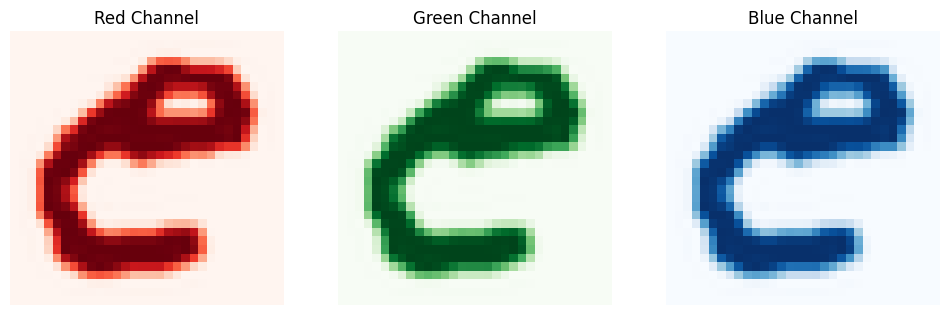

In [63]:
import matplotlib.pyplot as plt

# X_test[0] 이미지 시각화
img = X_test[0]

# 각 채널을 시각화
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

# Red 채널
axs[0].imshow(img[:, :, 0], cmap='Reds')
axs[0].set_title('Red Channel')
axs[0].axis('off')

# Green 채널
axs[1].imshow(img[:, :, 1], cmap='Greens')
axs[1].set_title('Green Channel')
axs[1].axis('off')

# Blue 채널
axs[2].imshow(img[:, :, 2], cmap='Blues')
axs[2].set_title('Blue Channel')
axs[2].axis('off')

plt.show()

### (4-1) (32, 32, 1)로 줄여서 다시 테스트

In [72]:
from PIL import Image

def process_image_grayscale(img, resize_shape):
    img = img.reshape(28, 28)  # Reshape to 28x28
    img = np.fliplr(img)  # Flip the image left to right
    img = np.rot90(img)  # Rotate the image 90 degrees
    img = Image.fromarray(img.astype('uint8'), 'L')  # Convert to PIL image in grayscale
    img = img.resize(resize_shape, Image.ANTIALIAS)  # Resize to the target shape
    #img = img.convert('RGB')  # Convert to RGB
    img = np.array(img)  # Convert back to numpy array
    return img

def prepare_datasets_grayscale(type, resize_shape=(32, 32)):
    # Define dataset paths based on type
    base_path = f"/home/hayeon/ann/project/emnist/{type}/"
    train_path = base_path + "emnist-" + type + "-train.csv"
    test_path = base_path + "emnist-" + type + "-test.csv"
    mapping_path = base_path + "emnist-" + type + "-mapping.txt"

    # Read datasets
    train = pd.read_csv(train_path, delimiter=',')
    test = pd.read_csv(test_path, delimiter=',')
    mapp = pd.read_csv(mapping_path, delimiter=' ', index_col=0, header=None, squeeze=True)

    # Split datasets
    X_train = train.iloc[:, 1:].values
    y_train = train.iloc[:, 0].values
    X_test = test.iloc[:, 1:].values
    y_test = test.iloc[:, 0].values

    val_size = len(X_test)

    X_valid = X_train[-val_size:]
    y_valid = y_train[-val_size:]
    X_train = X_train[:-val_size]
    y_train = y_train[:-val_size]

    # Apply processing
    X_train = np.array([process_image_grayscale(img, resize_shape) for img in X_train])
    X_valid = np.array([process_image_grayscale(img, resize_shape) for img in X_valid])
    X_test = np.array([process_image_grayscale(img, resize_shape) for img in X_test])

    # Normalize pixel values to [0, 1]
    X_train = X_train.astype('float32') / 255.0
    X_valid = X_valid.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    X_train = np.expand_dims(X_train, axis=-1)
    X_valid = np.expand_dims(X_valid, axis=-1)
    X_test = np.expand_dims(X_test, axis=-1)

    print("X_train shape:", X_train.shape)
    print("X_valid shape:", X_valid.shape)
    print("X_test shape:", X_test.shape)
    print("")

    num_classes = np.unique(y_train).size
    print("Number of label classes:", num_classes)
    print("")

    return X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes


X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('balanced', resize_shape=(32, 32))

datagen_4 = ImageDataGenerator(
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

batch_size = 1024
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)
                                

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (94000, 32, 32, 1)
X_valid shape: (18799, 32, 32, 1)
X_test shape: (18799, 32, 32, 1)

Number of label classes: 47



In [73]:
def conv_block(x, growth_rate, name):
    x1 = BatchNormalization(name=name + '/bn')(x)
    x1 = ELU(name=name + '/elu')(x1)
    x1 = Conv2D(4 * growth_rate, 1, use_bias=False, name=name + '/conv1')(x1)
    x1 = BatchNormalization(name=name + '/bn2')(x1)
    x1 = ELU(name=name + '/elu2')(x1)
    x1 = Conv2D(growth_rate, 3, padding='same', use_bias=False, name=name + '/conv2')(x1)
    x = tf.keras.layers.concatenate([x, x1], name=name + '/concat')
    return x

# Define the dense_block with ELU activation
def dense_block(x, blocks, name):
    for i in range(blocks):
        x = conv_block(x, 32, name=name + '/block' + str(i + 1))
    return x

# Define the transition_block with ELU activation
def transition_block(x, reduction, name):
    x = BatchNormalization(name=name + '/bn')(x)
    x = ELU(name=name + '/elu')(x)
    x = Conv2D(int(tf.keras.backend.int_shape(x)[-1] * reduction), 1, use_bias=False, name=name + '/conv')(x)
    x = AveragePooling2D(2, strides=2, name=name + '/pool')(x)
    return x

def DenseNet_layers_4_1(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 3, name='conv2')  # Reduced layers
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 6, name='conv3')  # Reduced layers
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 12, name='conv4')  # Reduced layers
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 6, name='conv5')  # Reduced layers

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.3, name='dropout')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='DenseNet_layers_4_2')
    return model

with strategy.scope():
    custom_model = DenseNet_layers_4_1(input_shape=(32,32,1), num_classes=num_classes)

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_4_1", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

Model: "densenet121_with_dropout_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_27 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_48 (ZeroPadding  (None, 38, 38, 1)   0           ['input_27[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_48[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1/

2024-06-05 17:06:19.309315: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 49 of 100
2024-06-05 17:06:29.246361: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 99 of 100
2024-06-05 17:06:29.515591: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


92/92 [==============================] - 114s 332ms/step - loss: 2.6859 - accuracy: 0.3279 - val_loss: 3.9054 - val_accuracy: 0.0204 - lr: 0.0010
Epoch 2/50
92/92 [==============================] - 20s 218ms/step - loss: 1.3257 - accuracy: 0.6608 - val_loss: 4.1143 - val_accuracy: 0.0463 - lr: 0.0010
Epoch 3/50
92/92 [==============================] - 22s 236ms/step - loss: 0.9543 - accuracy: 0.7407 - val_loss: 4.4263 - val_accuracy: 0.0678 - lr: 0.0010
Epoch 4/50
92/92 [==============================] - 22s 239ms/step - loss: 0.7845 - accuracy: 0.7784 - val_loss: 4.2349 - val_accuracy: 0.0991 - lr: 0.0010
Epoch 5/50
92/92 [==============================] - 21s 232ms/step - loss: 0.6831 - accuracy: 0.7999 - val_loss: 2.3779 - val_accuracy: 0.3409 - lr: 0.0010
Epoch 6/50
92/92 [==============================] - 21s 229ms/step - loss: 0.6295 - accuracy: 0.8104 - val_loss: 0.9074 - val_accuracy: 0.7434 - lr: 0.0010
Epoch 7/50
92/92 [==============================] - 21s 232ms/step - loss:

('trained_models/DenseNet_layer_4_1_lr_0.001_Nesterov_elu.h5',
 0.8918585777282715)

In [74]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 6s 38ms/step - loss: 0.3335 - accuracy: 0.8984 - top_1_accuracy: 0.8984 - top_5_accuracy: 0.9932
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_lr_0.001_Nesterov_elu.h5
Test Loss: 0.334
Overall Accuracy: 0.8984
Top-1 Accuracy: 0.8984
Top-5 Accuracy: 0.9932
Evaluation Time: 5.917 seconds
Inference Time: 6.399 seconds


### (4-2) 구조는 유지하되 숫자를 더 줄여보기 (2-4-8-4)

In [81]:
def DenseNet_layers_4_2(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((3, 3), (3, 3)))(inputs)
    x = Conv2D(64, 7, strides=2, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 2, name='conv2')  # Reduced layers
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 4, name='conv3')  # Reduced layers
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 8, name='conv4')  # Reduced layers
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 4, name='conv5')  # Reduced layers

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.3, name='dropout')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='DenseNet_layers_4_2.')
    return model

with strategy.scope():
    custom_model = DenseNet_layers_4_2(input_shape=(32,32,1), num_classes=num_classes)

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_4_2", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_2_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

Model: "DenseNet_layers_4_2."
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_31 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_56 (ZeroPadding  (None, 38, 38, 1)   0           ['input_31[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_56[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1/conv[0

2024-06-06 11:49:23.627497: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 51 of 100


 1/92 [..............................] - ETA: 1:49:50 - loss: 4.4602 - accuracy: 0.0244

2024-06-06 11:49:33.239498: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


92/92 [==============================] - 98s 285ms/step - loss: 2.8213 - accuracy: 0.2970 - val_loss: 3.8666 - val_accuracy: 0.0226 - lr: 0.0010
Epoch 2/50
92/92 [==============================] - 20s 216ms/step - loss: 1.5247 - accuracy: 0.6220 - val_loss: 3.9774 - val_accuracy: 0.0204 - lr: 0.0010
Epoch 3/50
92/92 [==============================] - 20s 223ms/step - loss: 1.1051 - accuracy: 0.7171 - val_loss: 4.2526 - val_accuracy: 0.0434 - lr: 0.0010
Epoch 4/50
92/92 [==============================] - 20s 223ms/step - loss: 0.9047 - accuracy: 0.7587 - val_loss: 4.2163 - val_accuracy: 0.0397 - lr: 0.0010
Epoch 5/50
92/92 [==============================] - 21s 227ms/step - loss: 0.7898 - accuracy: 0.7815 - val_loss: 2.9016 - val_accuracy: 0.1906 - lr: 0.0010
Epoch 6/50
92/92 [==============================] - 21s 225ms/step - loss: 0.7205 - accuracy: 0.7948 - val_loss: 1.0705 - val_accuracy: 0.7081 - lr: 0.0010
Epoch 7/50
92/92 [==============================] - 20s 224ms/step - loss: 

### (4-3) 처음 제로패딩, 합성곱층 줄이기

In [82]:
def DenseNet_layers_4_3(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(inputs)
    x = Conv2D(32, 3, strides=1, use_bias=False, name='conv1/conv')(x)
    x = BatchNormalization(name='conv1/bn')(x)
    x = ReLU(name='conv1/relu')(x)
    x = ZeroPadding2D(padding=((1, 1), (1, 1)))(x)
    x = AveragePooling2D(3, strides=2, name='pool1')(x)

    x = dense_block(x, 2, name='conv2')  # Reduced layers
    x = transition_block(x, 0.5, name='pool2')
    x = dense_block(x, 4, name='conv3')  # Reduced layers
    x = transition_block(x, 0.5, name='pool3')
    x = dense_block(x, 8, name='conv4')  # Reduced layers
    x = transition_block(x, 0.5, name='pool4')
    x = dense_block(x, 4, name='conv5')  # Reduced layers

    x = BatchNormalization(name='bn')(x)
    x = ReLU(name='relu')(x)
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.3, name='dropout')(x)
    outputs = Dense(num_classes, activation='softmax', name='fc')(x)

    model = Model(inputs, outputs, name='DenseNet_layers_4_3')
    return model

with strategy.scope():
    custom_model = DenseNet_layers_4_3(input_shape=(32,32,1), num_classes=num_classes)

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=50, 

                model_name=f"{base_model_name}_4_3", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_3_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

Model: "DenseNet_layers_4_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_32 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_58 (ZeroPadding  (None, 34, 34, 1)   0           ['input_32[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 32, 32, 32)   288         ['zero_padding2d_58[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 32, 32, 32)   128         ['conv1/conv[0]

2024-06-06 12:07:49.134121: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 51 of 100
2024-06-06 12:07:58.883728: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


92/92 [==============================] - 92s 284ms/step - loss: 3.4696 - accuracy: 0.1299 - val_loss: 3.9081 - val_accuracy: 0.0224 - lr: 0.0010
Epoch 2/50
92/92 [==============================] - 19s 207ms/step - loss: 2.5827 - accuracy: 0.3896 - val_loss: 4.0637 - val_accuracy: 0.0224 - lr: 0.0010
Epoch 3/50
92/92 [==============================] - 20s 224ms/step - loss: 2.0310 - accuracy: 0.5523 - val_loss: 4.7065 - val_accuracy: 0.0220 - lr: 0.0010
Epoch 4/50
92/92 [==============================] - 20s 221ms/step - loss: 1.6234 - accuracy: 0.6480 - val_loss: 5.4474 - val_accuracy: 0.0222 - lr: 0.0010
Epoch 5/50
92/92 [==============================] - 20s 224ms/step - loss: 1.3376 - accuracy: 0.7038 - val_loss: 4.8132 - val_accuracy: 0.0241 - lr: 0.0010
Epoch 6/50
92/92 [==============================] - 21s 225ms/step - loss: 1.1364 - accuracy: 0.7380 - val_loss: 2.9594 - val_accuracy: 0.1086 - lr: 0.0010
Epoch 7/50
92/92 [==============================] - 21s 225ms/step - loss: 

## 5-11) 전이학습(transfer learning)

### (1) bymerge 데이터셋을 2048 배치, 10에포크, 0.001 학습률로 학습함.

In [78]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('bymerge', resize_shape=(32, 32))

batch_size = 2048
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

with strategy.scope():
    custom_model = DenseNet_layers_4_1(input_shape=(32,32,1), num_classes=num_classes)

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=10, 

                model_name=f"{base_model_name}_4_1_base", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=learning_rates, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_base_lr_0.001_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (581609, 32, 32, 1)
X_valid shape: (116322, 32, 32, 1)
X_test shape: (116322, 32, 32, 1)

Number of label classes: 47

Model: "densenet121_with_dropout_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_30 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_54 (ZeroPadding  (None, 38, 38, 1)   0           ['input_30[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_54[0][0]']      
                                      

2024-06-05 21:41:04.320248: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 26 of 100
2024-06-05 21:41:14.331005: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 52 of 100
2024-06-05 21:41:24.314475: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 78 of 100


  1/284 [..............................] - ETA: 8:44:27 - loss: 4.3966 - accuracy: 0.0210

2024-06-05 21:41:32.755078: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


284/284 [==============================] - 238s 447ms/step - loss: 1.3581 - accuracy: 0.6499 - val_loss: 3.8490 - val_accuracy: 0.0668 - lr: 0.0010
Epoch 2/10
284/284 [==============================] - 117s 414ms/step - loss: 0.6248 - accuracy: 0.8155 - val_loss: 0.8700 - val_accuracy: 0.7188 - lr: 0.0010
Epoch 3/10
284/284 [==============================] - 116s 410ms/step - loss: 0.4982 - accuracy: 0.8440 - val_loss: 0.3853 - val_accuracy: 0.8756 - lr: 0.0010
Epoch 4/10
284/284 [==============================] - 117s 413ms/step - loss: 0.4417 - accuracy: 0.8558 - val_loss: 0.3480 - val_accuracy: 0.8842 - lr: 0.0010
Epoch 5/10
284/284 [==============================] - 117s 414ms/step - loss: 0.4067 - accuracy: 0.8650 - val_loss: 0.3416 - val_accuracy: 0.8843 - lr: 0.0010
Epoch 6/10
284/284 [==============================] - 116s 411ms/step - loss: 0.3851 - accuracy: 0.8702 - val_loss: 0.3280 - val_accuracy: 0.8879 - lr: 0.0010
Epoch 7/10
284/284 [==============================] - 116

In [79]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('balanced', resize_shape=(32, 32))

datagen_4 = ImageDataGenerator(
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

batch_size = 1024
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)
with strategy.scope():
    custom_model.layers[-1] = Dense(num_classes, activation='softmax', name='fc')

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=100, 

                model_name=f"{base_model_name}_4_1_transfered", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=0.01, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (94000, 32, 32, 1)
X_valid shape: (18799, 32, 32, 1)
X_test shape: (18799, 32, 32, 1)

Number of label classes: 47

Model: "densenet121_with_dropout_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_30 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_54 (ZeroPadding  (None, 38, 38, 1)   0           ['input_30[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_54[0][0]']      
                                         

2024-06-05 22:03:01.010319: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 53 of 100


 1/92 [..............................] - ETA: 2:02:17 - loss: 0.6673 - accuracy: 0.7881

2024-06-05 22:03:09.810779: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


92/92 [==============================] - 108s 301ms/step - loss: 0.5347 - accuracy: 0.8248 - val_loss: 0.9208 - val_accuracy: 0.7060 - lr: 0.0100
Epoch 2/100
92/92 [==============================] - 20s 221ms/step - loss: 0.3877 - accuracy: 0.8642 - val_loss: 0.5176 - val_accuracy: 0.8203 - lr: 0.0100
Epoch 3/100
92/92 [==============================] - 20s 214ms/step - loss: 0.3708 - accuracy: 0.8690 - val_loss: 0.3456 - val_accuracy: 0.8783 - lr: 0.0100
Epoch 4/100
92/92 [==============================] - 21s 227ms/step - loss: 0.3472 - accuracy: 0.8763 - val_loss: 0.3453 - val_accuracy: 0.8740 - lr: 0.0100
Epoch 5/100
92/92 [==============================] - 21s 235ms/step - loss: 0.3340 - accuracy: 0.8791 - val_loss: 0.3357 - val_accuracy: 0.8793 - lr: 0.0100
Epoch 6/100
92/92 [==============================] - 21s 233ms/step - loss: 0.3232 - accuracy: 0.8814 - val_loss: 0.3083 - val_accuracy: 0.8871 - lr: 0.0100
Epoch 7/100
92/92 [==============================] - 19s 211ms/step -

OSError: No file or directory found at /home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_transfered_lr_0.001_Nesterov_elu.h5

In [80]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_transfered_lr_0.01_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 6s 33ms/step - loss: 0.2944 - accuracy: 0.9082 - top_1_accuracy: 0.9082 - top_5_accuracy: 0.9951
Model Path:  /home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_transfered_lr_0.01_Nesterov_elu.h5
Test Loss: 0.294
Overall Accuracy: 0.9082
Top-1 Accuracy: 0.9082
Top-5 Accuracy: 0.9951
Evaluation Time: 5.864 seconds
Inference Time: 5.391 seconds


### (4-4) 전이학습 (2048, 0.1학습률, 5epoch -> 1024, 0.001학습률, 100+early+scheduler)

In [83]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('bymerge', resize_shape=(32, 32))

batch_size = 2048
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

with strategy.scope():
    custom_model = DenseNet_layers_4_1(input_shape=(32,32,1), num_classes=num_classes)

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=5, 

                model_name=f"{base_model_name}_4_1_base_1", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=0.1, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_base_1_lr_0.1_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (581609, 32, 32, 1)
X_valid shape: (116322, 32, 32, 1)
X_test shape: (116322, 32, 32, 1)

Number of label classes: 47

Model: "densenet121_with_dropout_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_33 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_60 (ZeroPadding  (None, 38, 38, 1)   0           ['input_33[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_60[0][0]']      
                                      

2024-06-06 13:26:37.535152: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 26 of 100
2024-06-06 13:26:47.607403: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 52 of 100
2024-06-06 13:26:57.799139: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 78 of 100


  1/284 [..............................] - ETA: 7:59:28 - loss: 4.4884 - accuracy: 0.0244

2024-06-06 13:27:06.415377: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


284/284 [==============================] - 229s 449ms/step - loss: 0.4820 - accuracy: 0.8406 - val_loss: 0.3739 - val_accuracy: 0.8615 - lr: 0.1000
Epoch 2/5
284/284 [==============================] - 120s 424ms/step - loss: 0.3014 - accuracy: 0.8892 - val_loss: 0.2827 - val_accuracy: 0.8962 - lr: 0.1000
Epoch 3/5
284/284 [==============================] - 120s 423ms/step - loss: 0.2813 - accuracy: 0.8956 - val_loss: 0.2639 - val_accuracy: 0.8995 - lr: 0.1000
Epoch 4/5
284/284 [==============================] - 118s 417ms/step - loss: 0.2702 - accuracy: 0.8987 - val_loss: 0.2985 - val_accuracy: 0.8843 - lr: 0.1000
Epoch 5/5
284/284 [==============================] - 118s 417ms/step - loss: 0.2640 - accuracy: 0.9001 - val_loss: 0.2887 - val_accuracy: 0.8867 - lr: 0.1000
Training time :  705.1891369819641
Validation Accuracy :  0.8994654417037964
14/14 [==============================] - 7s 35ms/step - loss: 0.2993 - accuracy: 0.8843 - top_1_accuracy: 0.8843 - top_5_accuracy: 0.9982
Model

In [84]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('balanced', resize_shape=(32, 32))

datagen_4 = ImageDataGenerator(
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

batch_size = 1024
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)
with strategy.scope():
    custom_model.layers[-1] = Dense(num_classes, activation='softmax', name='fc')

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=100, 

                model_name=f"{base_model_name}_4_1_transfered_1", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=0.01, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_transfered_1_lr_0.01_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (94000, 32, 32, 1)
X_valid shape: (18799, 32, 32, 1)
X_test shape: (18799, 32, 32, 1)

Number of label classes: 47

Model: "densenet121_with_dropout_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_33 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_60 (ZeroPadding  (None, 38, 38, 1)   0           ['input_33[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_60[0][0]']      
                                         

2024-06-06 13:39:00.723290: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 51 of 100


 1/92 [..............................] - ETA: 2:01:17 - loss: 0.4116 - accuracy: 0.8438

2024-06-06 13:39:10.407046: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


92/92 [==============================] - 108s 313ms/step - loss: 0.2847 - accuracy: 0.8943 - val_loss: 0.2607 - val_accuracy: 0.8960 - lr: 0.0100
Epoch 2/100
92/92 [==============================] - 21s 226ms/step - loss: 0.2661 - accuracy: 0.8993 - val_loss: 0.2397 - val_accuracy: 0.8997 - lr: 0.0100
Epoch 3/100
92/92 [==============================] - 21s 225ms/step - loss: 0.2591 - accuracy: 0.9028 - val_loss: 0.2535 - val_accuracy: 0.8993 - lr: 0.0100
Epoch 4/100
92/92 [==============================] - 21s 234ms/step - loss: 0.2565 - accuracy: 0.9033 - val_loss: 0.2493 - val_accuracy: 0.9013 - lr: 0.0100
Epoch 5/100
92/92 [==============================] - 21s 226ms/step - loss: 0.2547 - accuracy: 0.9045 - val_loss: 0.2462 - val_accuracy: 0.9007 - lr: 0.0100
Epoch 6/100
92/92 [==============================] - 21s 226ms/step - loss: 0.2515 - accuracy: 0.9041 - val_loss: 0.2450 - val_accuracy: 0.9025 - lr: 0.0100
Epoch 7/100
92/92 [==============================] - 20s 223ms/step -

### (4-5) byclass 전이학습 3epoch씩 (2048, 0.1) -> 기존과 동일

In [85]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('byclass', resize_shape=(32, 32))

batch_size = 2048
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

with strategy.scope():
    custom_model = DenseNet_layers_4_1(input_shape=(32,32,1), num_classes=num_classes)

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=5, 

                model_name=f"{base_model_name}_4_1_base_2", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=0.1, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_2_base_2_lr_0.1_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (581609, 32, 32, 1)
X_valid shape: (116322, 32, 32, 1)
X_test shape: (116322, 32, 32, 1)

Number of label classes: 62

Model: "densenet121_with_dropout_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_34 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_62 (ZeroPadding  (None, 38, 38, 1)   0           ['input_34[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_62[0][0]']      
                                      

2024-06-07 00:19:37.917833: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 26 of 100
2024-06-07 00:19:48.007285: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 52 of 100
2024-06-07 00:19:58.117037: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 78 of 100


  1/284 [..............................] - ETA: 8:11:27 - loss: 4.8611 - accuracy: 0.0122

2024-06-07 00:20:06.670513: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


284/284 [==============================] - 233s 457ms/step - loss: 0.6139 - accuracy: 0.8011 - val_loss: 0.6247 - val_accuracy: 0.7792 - lr: 0.1000
Epoch 2/5
284/284 [==============================] - 122s 429ms/step - loss: 0.4047 - accuracy: 0.8519 - val_loss: 0.3971 - val_accuracy: 0.8550 - lr: 0.1000
Epoch 3/5
284/284 [==============================] - 118s 415ms/step - loss: 0.3824 - accuracy: 0.8586 - val_loss: 0.3776 - val_accuracy: 0.8577 - lr: 0.1000
Epoch 4/5
284/284 [==============================] - 118s 417ms/step - loss: 0.3722 - accuracy: 0.8614 - val_loss: 0.4280 - val_accuracy: 0.8398 - lr: 0.1000
Epoch 5/5
284/284 [==============================] - 122s 431ms/step - loss: 0.3627 - accuracy: 0.8645 - val_loss: 0.3664 - val_accuracy: 0.8638 - lr: 0.1000
Training time :  713.3216342926025
Validation Accuracy :  0.863829493522644


OSError: No file or directory found at /home/hayeon/ann/project/trained_models/DenseNet_layer_4_2_base_1_lr_0.1_Nesterov_elu.h5

In [86]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('balanced', resize_shape=(32, 32))

datagen_4 = ImageDataGenerator(
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

batch_size = 1024
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_4, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)
with strategy.scope():
    custom_model.layers[-1] = Dense(num_classes, activation='softmax', name='fc')

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=100, 

                model_name=f"{base_model_name}_4_1_transfered_2", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=0.01, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_transfered_2_lr_0.01_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (94000, 32, 32, 1)
X_valid shape: (18799, 32, 32, 1)
X_test shape: (18799, 32, 32, 1)

Number of label classes: 47

Model: "densenet121_with_dropout_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_34 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_62 (ZeroPadding  (None, 38, 38, 1)   0           ['input_34[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_62[0][0]']      
                                         

2024-06-07 02:40:07.131584: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 51 of 100


 1/92 [..............................] - ETA: 2:01:55 - loss: 2.6569 - accuracy: 0.6904

2024-06-07 02:40:16.846920: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


92/92 [==============================] - 109s 311ms/step - loss: 0.5735 - accuracy: 0.8502 - val_loss: 0.3336 - val_accuracy: 0.8766 - lr: 0.0100
Epoch 2/100
92/92 [==============================] - 21s 226ms/step - loss: 0.3178 - accuracy: 0.8882 - val_loss: 0.2982 - val_accuracy: 0.8902 - lr: 0.0100
Epoch 3/100
92/92 [==============================] - 21s 234ms/step - loss: 0.3002 - accuracy: 0.8913 - val_loss: 0.2762 - val_accuracy: 0.8958 - lr: 0.0100
Epoch 4/100
92/92 [==============================] - 21s 232ms/step - loss: 0.2858 - accuracy: 0.8956 - val_loss: 0.2752 - val_accuracy: 0.8951 - lr: 0.0100
Epoch 5/100
92/92 [==============================] - 21s 226ms/step - loss: 0.2854 - accuracy: 0.8961 - val_loss: 0.2612 - val_accuracy: 0.9009 - lr: 0.0100
Epoch 6/100
92/92 [==============================] - 20s 218ms/step - loss: 0.2774 - accuracy: 0.8963 - val_loss: 0.2601 - val_accuracy: 0.8964 - lr: 0.0100
Epoch 7/100
92/92 [==============================] - 20s 217ms/step -

## 5-12) Final

In [88]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('bymerge', resize_shape=(32, 32))

batch_size = 2048
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset(batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

with strategy.scope():
    custom_model = DenseNet_layers_4_2(input_shape=(32,32,1), num_classes=num_classes)

custom_model.summary()

base_model_name='final'

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=3, 

                model_name=f"{base_model_name}_base", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=0.1, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/final_base_lr_0.1_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (581609, 32, 32, 1)
X_valid shape: (116322, 32, 32, 1)
X_test shape: (116322, 32, 32, 1)

Number of label classes: 47

Model: "DenseNet_layers_4_2."
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_35 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_64 (ZeroPadding  (None, 38, 38, 1)   0           ['input_35[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_64[0][0]']      
                                            

In [89]:
X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets_grayscale('balanced', resize_shape=(32, 32))

datagen_final = ImageDataGenerator(
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

batch_size = 1024
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_final, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)
with strategy.scope():
    custom_model.layers[-1] = Dense(num_classes, activation='softmax', name='fc')

custom_model.summary()

test_activation_lr_scheduler(custom_model,

                train_dist_dataset, 
                train_steps_per_epoch, 
                val_dist_dataset,
                val_steps_per_epoch,
                X_test, 

                batch_size=batch_size, 
                num_epochs=100, 

                model_name=f"{base_model_name}_transfered", 
                
                # 튜닝하는 부분 --> 찾은 최적 값으로 고정
                learning_rates=0.01, 
                optimizers=optimizers,

                strategy=strategy,
                num_gpus=num_gpus,

                test_dist_dataset=test_dist_dataset,

                num_classes=num_classes,

                activation_functions=activ_func
            )

test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/final_transfered_0.01_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

/home/hayeon/anaconda3/envs/ANN/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  


X_train shape: (94000, 32, 32, 1)
X_valid shape: (18799, 32, 32, 1)
X_test shape: (18799, 32, 32, 1)

Number of label classes: 47

Model: "DenseNet_layers_4_2."
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_35 (InputLayer)          [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 zero_padding2d_64 (ZeroPadding  (None, 38, 38, 1)   0           ['input_35[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 16, 16, 64)   3136        ['zero_padding2d_64[0][0]']      
                                               

2024-06-10 19:10:34.384648: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 64 of 100


 1/92 [..............................] - ETA: 1:28:13 - loss: 0.5376 - accuracy: 0.8291

2024-06-10 19:10:40.023887: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


92/92 [==============================] - 80s 239ms/step - loss: 0.3564 - accuracy: 0.8736 - val_loss: 0.2961 - val_accuracy: 0.8882 - lr: 0.0100
Epoch 2/100
92/92 [==============================] - 16s 178ms/step - loss: 0.3224 - accuracy: 0.8826 - val_loss: 0.2872 - val_accuracy: 0.8931 - lr: 0.0100
Epoch 3/100
92/92 [==============================] - 16s 180ms/step - loss: 0.3156 - accuracy: 0.8855 - val_loss: 0.2897 - val_accuracy: 0.8892 - lr: 0.0100
Epoch 4/100
92/92 [==============================] - 16s 180ms/step - loss: 0.3121 - accuracy: 0.8852 - val_loss: 0.2894 - val_accuracy: 0.8886 - lr: 0.0100
Epoch 5/100
92/92 [==============================] - 17s 183ms/step - loss: 0.3070 - accuracy: 0.8891 - val_loss: 0.2808 - val_accuracy: 0.8931 - lr: 0.0100
Epoch 6/100
92/92 [==============================] - 17s 182ms/step - loss: 0.2959 - accuracy: 0.8925 - val_loss: 0.2837 - val_accuracy: 0.8929 - lr: 0.0100
Epoch 7/100
92/92 [==============================] - 16s 177ms/step - 

OSError: No file or directory found at /home/hayeon/ann/project/trained_models/final_transfered_0.01_Nesterov_elu.h5

In [90]:
test_loss_and_accuracy_update('/home/hayeon/ann/project/trained_models/final_transfered_lr_0.01_Nesterov_elu.h5',
                       strategy,
                       X_test,
                       batch_size,
                       num_gpus,
                       test_dist_dataset)

4/4 [==============================] - 5s 28ms/step - loss: 0.3033 - accuracy: 0.8975 - top_1_accuracy: 0.8975 - top_5_accuracy: 0.9932
Model Path:  /home/hayeon/ann/project/trained_models/final_transfered_lr_0.01_Nesterov_elu.h5
Test Loss: 0.303
Overall Accuracy: 0.8975
Top-1 Accuracy: 0.8975
Top-5 Accuracy: 0.9932
Evaluation Time: 4.653 seconds
Inference Time: 4.203 seconds


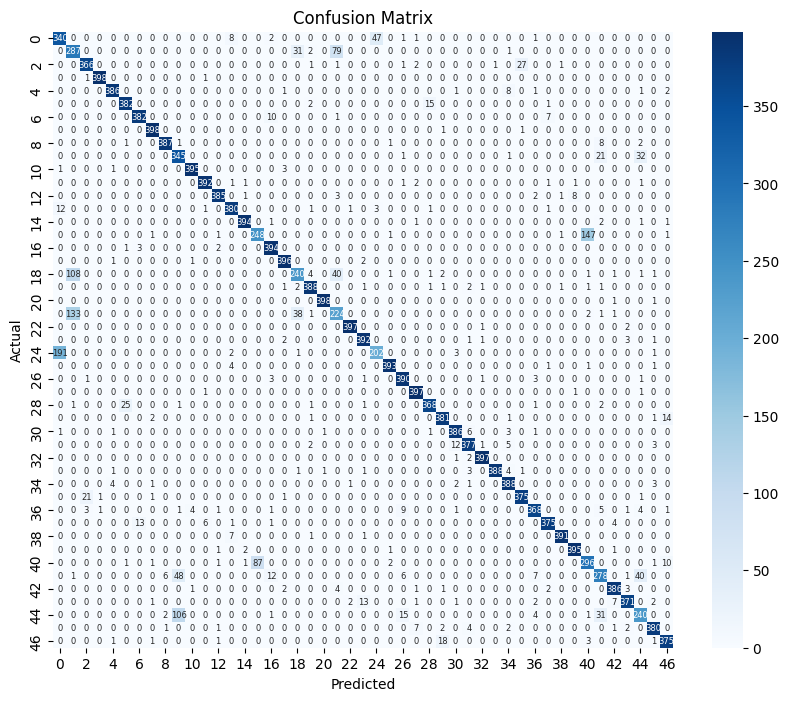

In [94]:
import numpy as np
import pandas as pd
import h5py
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import load_model

batch_size = 1024
train_steps_per_epoch, val_steps_per_epoch, \
    train_dist_dataset, val_dist_dataset, test_dist_dataset \
        = distribute_dataset_datagen(datagen_final, batch_size, num_gpus, strategy,
                                X_train, y_train,
                                X_valid, y_valid,
                                X_test, y_test)

# 모델 불러오기
model_path = '/home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_transfered_1_lr_0.01_Nesterov_elu.h5'

model = load_model(model_path)

# 모델을 사용하여 예측값 생성
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # 클래스 예측값 추출

# 혼동 행렬 생성
conf_matrix = confusion_matrix(y_test, y_pred_classes)

# 혼동 행렬 시각화
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', annot_kws={"size": 6})
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


In [116]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import cv2

# 모델 로드
model = load_model('/home/hayeon/ann/project/trained_models/DenseNet_layer_4_1_transfered_1_lr_0.01_Nesterov_elu.h5')

X_train, y_train, X_valid, y_valid, X_test, y_test, mapp, num_classes \
    = prepare_datasets('balanced', resize_shape=(32, 32))

# Grad-CAM 함수 정의
def get_grad_cam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions[0])]

    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]
    gate_f = tf.cast(output > 0, 'float32')
    gate_r = tf.cast(grads > 0, 'float32')
    guided_grads = gate_f * gate_r * grads
    weights = tf.reduce_mean(guided_grads, axis=(0, 1))
    cam = np.dot(output, weights.numpy())
    
    cam = np.maximum(cam, 0)
    heatmap = (cam - cam.min()) / (cam.max() - cam.min())
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))
    return heatmap


layer_name = 'conv5/block6/concat'
heatmap = get_grad_cam(model, y_test, layer_name)

# 시각화
img = y_test[0].reshape((32, 32))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(img, cmap='gray')
plt.imshow(heatmap, cmap='jet', alpha=0.5)
plt.title('Grad-CAM')

plt.show()


X_train shape: (94000, 32, 32, 3)
X_valid shape: (18799, 32, 32, 3)
X_test shape: (18799, 32, 32, 3)

Number of label classes: 47



ValueError: Exception encountered when calling layer "model_15" (type Functional).

Input 0 of layer "zero_padding2d_60" is incompatible with the layer: expected ndim=4, found ndim=1. Full shape received: (18799,)

Call arguments received:
  • inputs=tf.Tensor(shape=(18799,), dtype=int64)
  • training=False
  • mask=None

# 이하 실험 시 참고한 학습 곡선 이미지

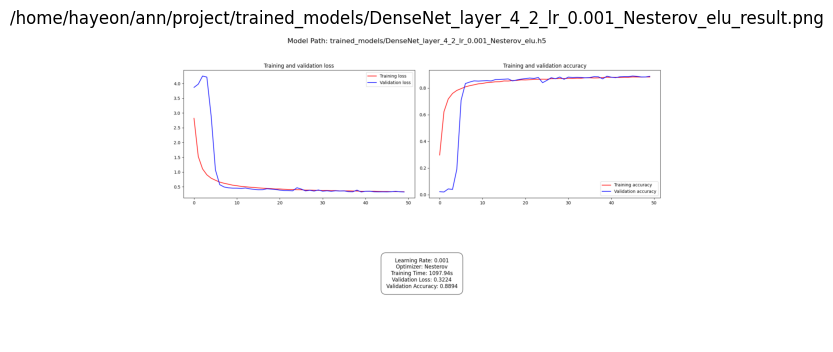

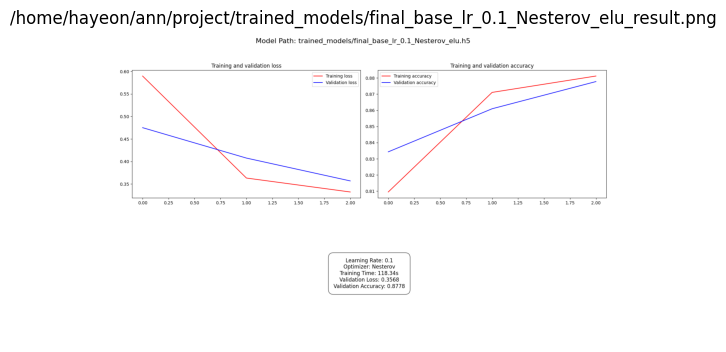

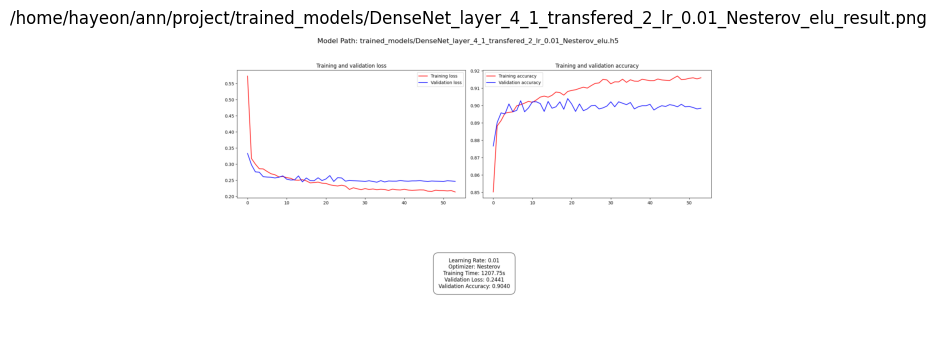

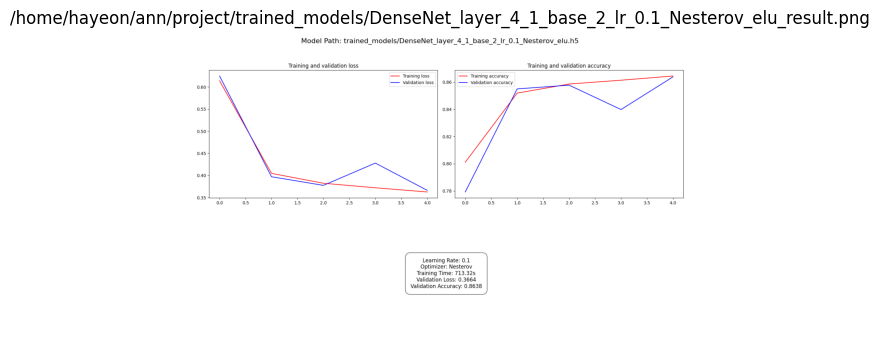

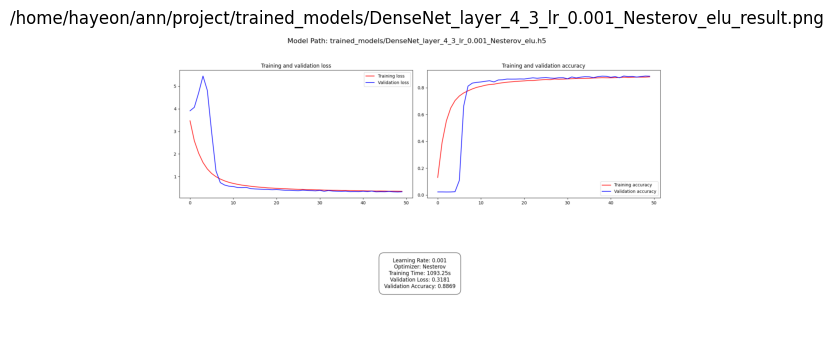

...

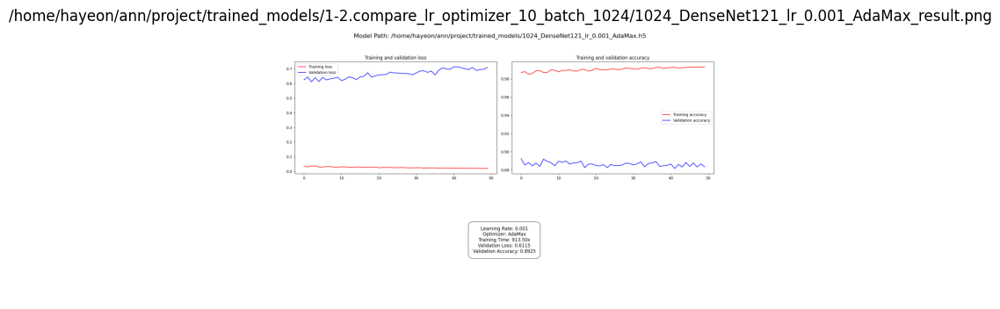

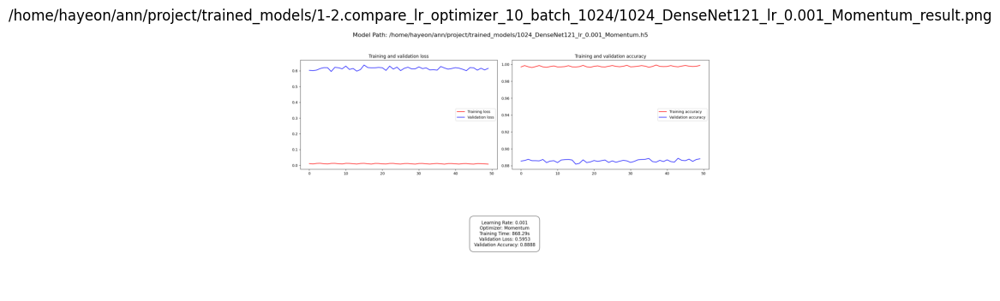

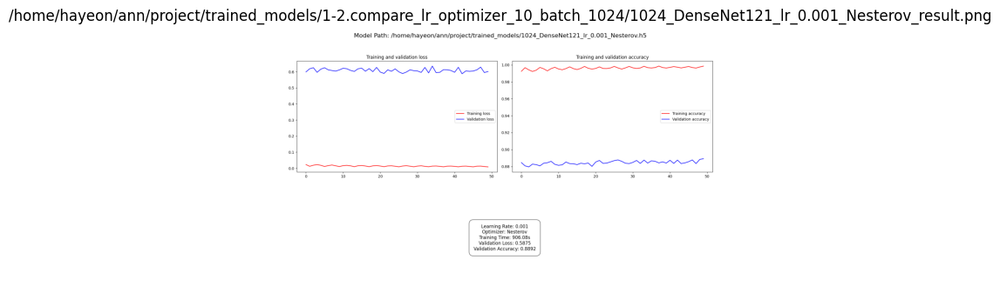

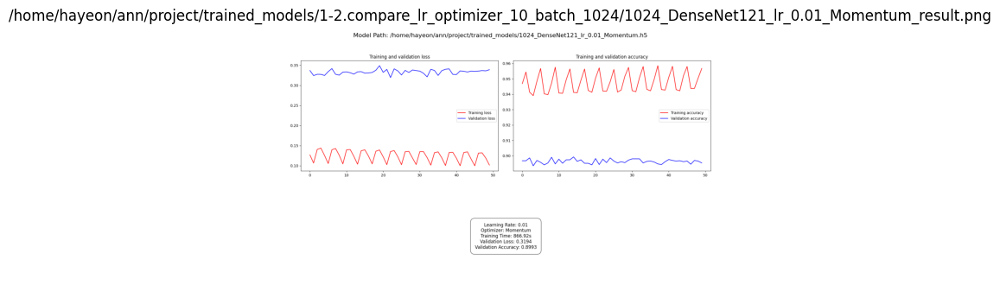

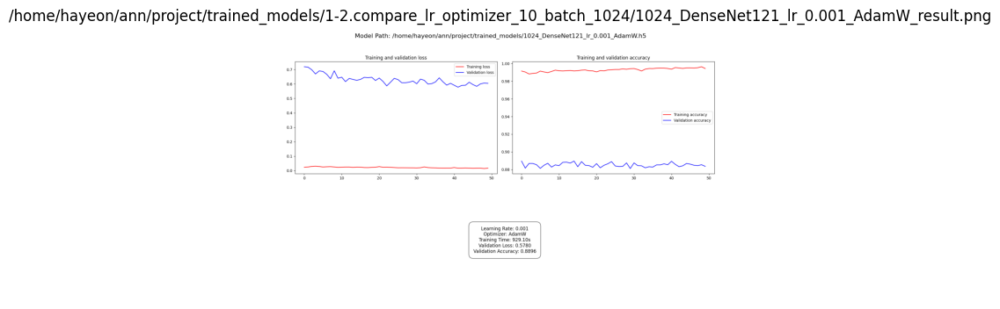

In [118]:
import os
import matplotlib.pyplot as plt
from IPython.display import display
from PIL import Image

def plot_all_pngs(directory):
    # 디렉토리를 순회하며 모든 png 파일의 경로를 리스트에 저장
    png_files = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith(".png"):
                png_files.append(os.path.join(root, file))
    
    # 각 png 파일을 플롯팅
    for png_file in png_files:
        img = Image.open(png_file)
        plt.figure()
        plt.imshow(img)
        plt.axis('off')  # 축을 표시하지 않음
        plt.title(png_file)  # 파일 경로를 제목으로 표시
        plt.show()

# 사용 예시: '/path/to/your/directory'를 원하는 디렉토리 경로로 변경
plot_all_pngs('/home/hayeon/ann/project/trained_models')
